<a href="https://colab.research.google.com/github/Ayona123/Drug_repurposing/blob/main/8702_TEST_700-750.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1543]:
# Install RDKit.
%%capture
!pip install rdkit-pypi

In [1544]:
from rdkit import Chem
from rdkit.Chem import Draw
from rdkit.Chem.Draw import IPythonConsole
from rdkit.Chem import Descriptors
from rdkit.Chem import AllChem
from rdkit import DataStructs
import numpy as np

RDKit ERROR: [06:06:29] non-ring atom 1 marked aromatic
RDKit ERROR: [06:06:29] non-ring atom 1 marked aromatic


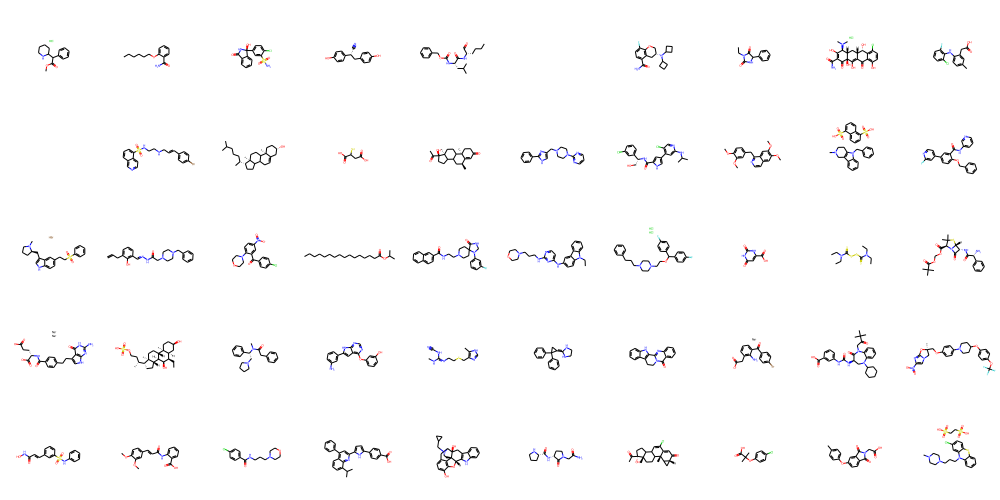

RDKit ERROR: [06:06:51] non-ring atom 1 marked aromatic
RDKit ERROR: [06:06:51] non-ring atom 1 marked aromatic


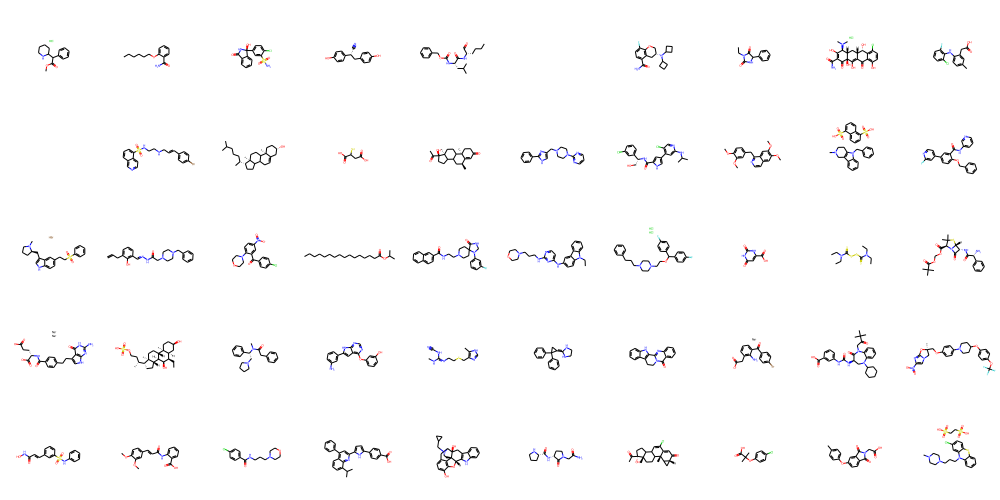

In [1545]:
smiles_list = [
'COC(=O)C(c1ccccc1)C1CCCCN1.Cl',
'CCCCCCOc1ccccc1C(N)=O',
'NS(=O)(=O)c1cc([C@@]2(O)NC(=O)c3ccccc32)ccc1Cl',
'N#C[C@H](Cc1ccc(O)cc1)c1ccc(O)cc1',
'CCCC[C@@H](C=O)NC(=O)[C@H](CC(C)C)NC(=O)OCc1ccccc1',
'No Data',
'NC(=O)c1ccc(F)c2c1C[C@@H](N(C1CCC1)C1CCC1)CO2',
'CCN1C(=O)NC(c2ccccc2)C1=O',
'CN(C)[C@@H]1C(O)=C(C(N)=O)C(=O)[C@@]2(O)C(O)=C3C(=O)c4c(O)ccc(Cl)c4[C@@H](O)[C@H]3C[C@@H]12.Cl',
'Cc1ccc(Nc2c(F)cccc2Cl)c(CC(=O)O)c1',
'No Data',
'O=S(=O)(NCCNC/C=C/c1ccc(Br)cc1)c1cccc2cnccc12',
'CC(C)CCCC(C)[C@H]1CCC2C3CC=C4C[C@@H](O)CC[C@]4(C)C3CC[C@@]21C',
'O=C(O)CC(S)C(=O)O',
'CC(=O)[C@@]1(O)CCC2C3C[C@H](C)C4=CC(=O)CC[C@]4(C)C3CC[C@@]21C',
'c1ccc(-c2nc(CN3CCN(c4ncccn4)CC3)c[nH]2)cc1',
'CC(C)Nc1cc(-c2c[nH]c(C(=O)N[C@H](CO)c3cccc(Cl)c3)c2)c(Cl)cn1',
'COc1ccc(Cc2nccc3cc(OC)c(OC)cc23)cc1OC',
'CN1CCc2c(c3ccccc3n2Cc2ccccc2)C1.O=S(=O)(O)c1cccc2c(S(=O)(=O)O)cccc12',
'O=C(Nc1cccnc1)c1cc(-c2ccnc(F)c2)ccc1OCc1ccccc1',
'Br.CN1CCC[C@@H]1Cc1c[nH]c2ccc(CCS(=O)(=O)c3ccccc3)cc12',
'C=CCc1cccc(/C=N/NC(=O)CN2CCN(Cc3ccccc3)CC2)c1O',
'O=C(c1ccc(Cl)cc1)c1cc([N+](=O)[O-])ccc1N1CCOCC1',
'CCCCCCCCCCCCCCCC(=O)OC(C)C',
'O=C(NCCN1CCC2(CC1)C(=O)NCN2c1cccc(F)c1)c1ccc2ccccc2c1',
'CCn1c2ccccc2c2cc(Nc3ccnc(NCCCN4CCOCC4)n3)ccc21',
'Cl.Cl.Fc1ccc(C(OCCN2CCN(CCCc3ccccc3)CC2)c2ccc(F)cc2)cc1',
'O=C(O)c1cc(=O)[nH]c(=O)[nH]1',
'CCN(CC)C(=S)SSC(=S)N(CC)CC',
'CC(C)(C)C(=O)OCOC(=O)[C@@H]1N2C(=O)[C@@H](NC(=O)[C@H](N)c3ccccc3)[C@H]2SC1(C)C',
'Nc1nc2[nH]cc(CCc3ccc(C(=O)N[C@@H](CCC(=O)[O-])C(=O)[O-])cc3)c2c(=O)[nH]1.[Na+].[Na+]',
'CC[C@@H]1[C@@H]2C[C@H](O)CC[C@]2(C)[C@H]2CC[C@@]3(C)[C@@H](CC[C@@H]3[C@H](C)CCOS(=O)(=O)O)[C@@H]2[C@@H]1O',
'CN(C(=O)Cc1ccccc1)[C@H](CN1CCCC1)c1ccccc1',
'Nc1cccc(-c2cc3c(Oc4cccc(O)c4)ncnc3[nH]2)c1',
'CN/C(=N/CCSCc1nc[nH]c1C)NC#N',
'c1ccc(C2(c3ccccc3)CC2=C2NCCN2)cc1',
'O=c1c2ccccc2nc2n1CCc1c-2[nH]c2ccccc12',
'Nc1c(CC(=O)[O-])cccc1C(=O)c1ccc(Br)cc1.[Na+]',
'CC(C)(C)C(=O)CN1C(=O)[C@H](NC(=O)Nc2cccc(C(=O)O)c2)CN(C2CCCCC2)c2ccccc21',
'C[C@]1(COc2ccc(N3CCC(Oc4ccc(OC(F)(F)F)cc4)CC3)cc2)Cn2cc([N+](=O)[O-])nc2O1',
'O=C(/C=C/c1cccc(S(=O)(=O)Nc2ccccc2)c1)NO',
'COc1ccc(/C=C/C(=O)Nc2ccccc2C(=O)O)cc1OC',
'O=C(NCCCN1CCOCC1)c1ccc(Cl)cc1',
'CC(C)c1cccc2c(-c3ccccc3)cc(-c3ccc(-c4ccc(C(=O)O)cc4)[nH]3)nc12',
'Oc1ccc2c3c1O[C@H]1c4[nH]c5ccccc5c4C[C@@]4(O)C(C2)N(CC2CC2)CC[C@]314',
'NC(=O)CN1CC[C@@H](NC(=O)[C@@H]2CCCN2)C1=O',
'CC(=O)[C@@]1(O)CCC2C3C=C(Cl)C4=CC(=O)[C@@H]5CC5[C@]4(C)C3CC[C@@]21C',
'CC(C)(Oc1ccc(Cl)cc1)C(=O)O',
'Cc1ccc(Oc2ccc3c(c2)C(=O)N(CC(=O)O)C3=O)cc1',
'CN1CCN(CCCN2c3ccccc3Sc3ccc(Cl)cc32)CC1.O=S(=O)(O)CCS(=O)(=O)O',
               
]
mol_list = []
for smiles in smiles_list:
   mol= Chem.MolFromSmiles (smiles)
   mol_list.append (mol)

img = Draw.MolsToGridImage(mol_list, molsPerRow=10)
img



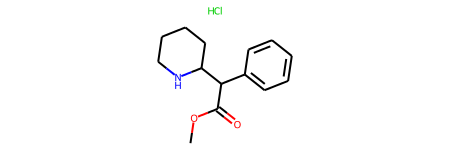

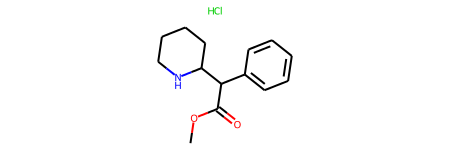

In [1546]:
M1 = mol_list [0]
M1

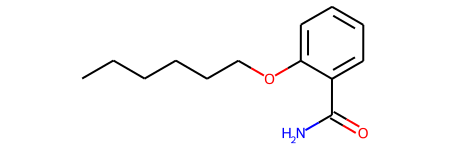

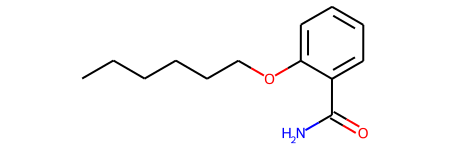

In [1547]:
M2 = mol_list [1]
M2

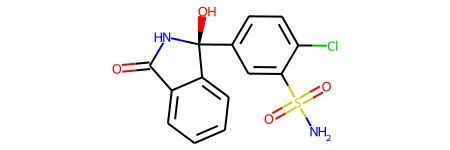

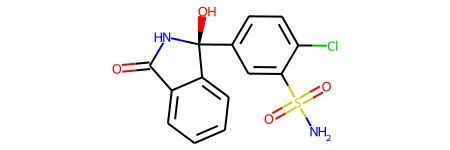

In [1548]:
M3 = mol_list [2]
M3

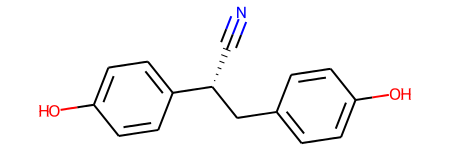

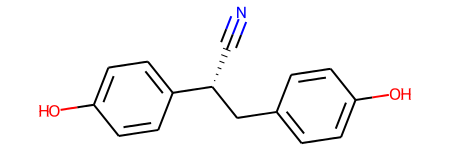

In [1549]:
M4 = mol_list [3]
M4

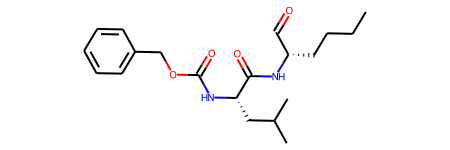

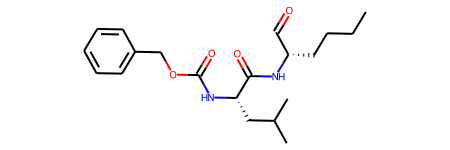

In [1550]:
M5 = mol_list [4]
M5

In [1551]:
M6 = mol_list [5]
M6

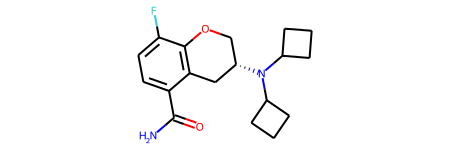

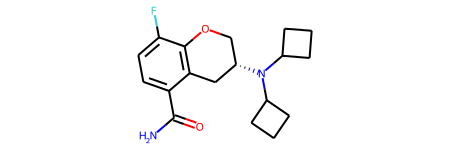

In [1552]:
M7 = mol_list [6]
M7

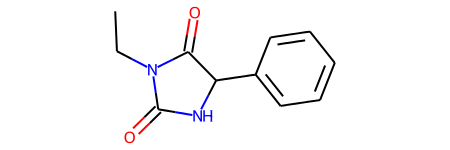

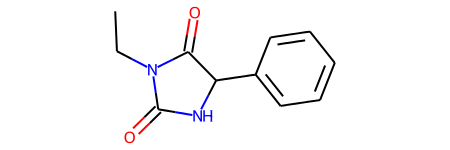

In [1553]:
M8 = mol_list [7]
M8

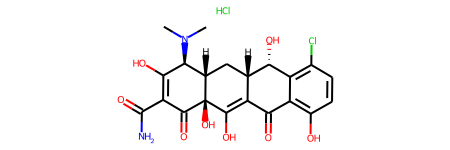

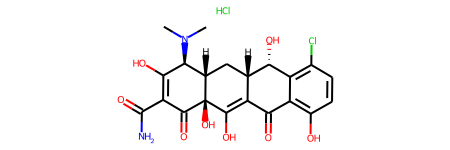

In [1554]:
M9 = mol_list [8]
M9

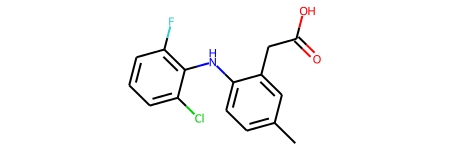

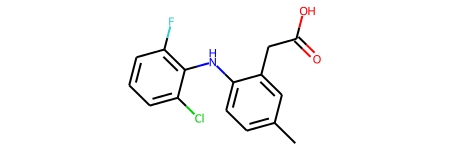

In [1555]:
M10= mol_list [9]
M10

In [1556]:
M11= mol_list [10]
M11

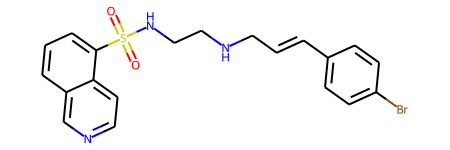

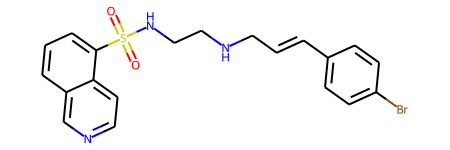

In [1557]:
M12= mol_list [11]
M12

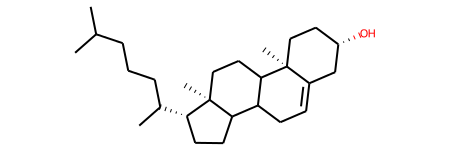

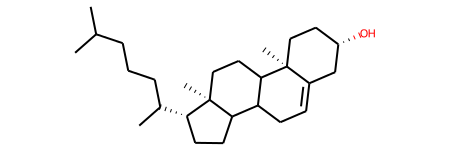

In [1558]:
M13= mol_list [12]
M13

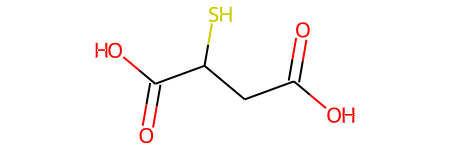

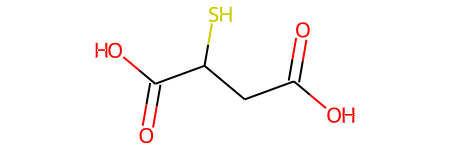

In [1559]:
M14= mol_list [13]
M14

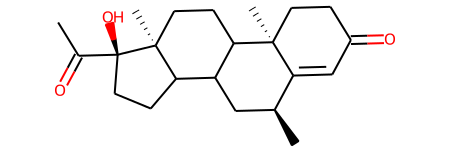

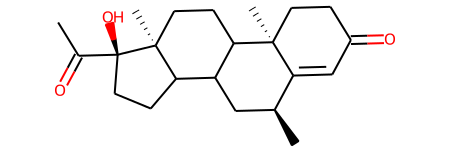

In [1560]:
M15= mol_list [14]
M15

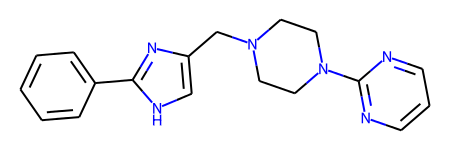

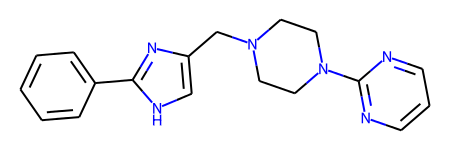

In [1561]:
M16= mol_list [15]
M16

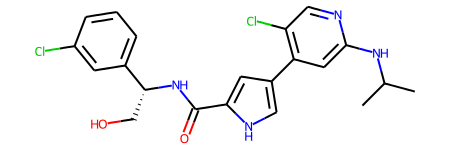

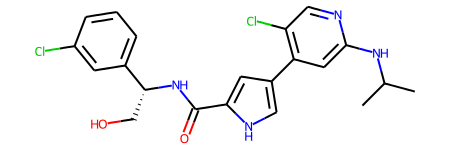

In [1562]:
M17= mol_list [16]
M17

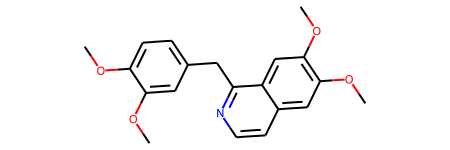

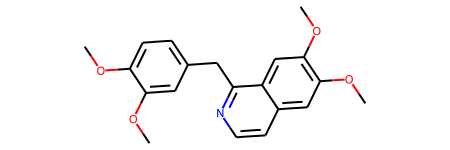

In [1563]:
M18= mol_list [17]
M18

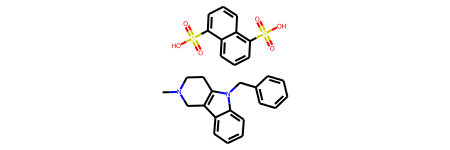

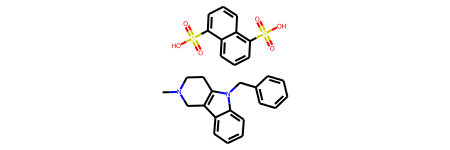

In [1564]:
M19= mol_list [18]
M19

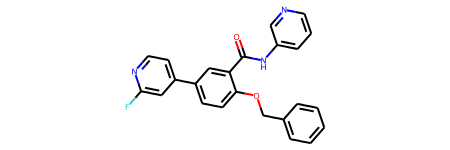

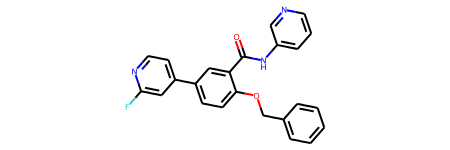

In [1565]:
M20= mol_list [19]
M20

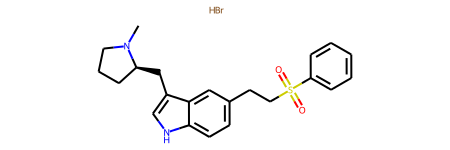

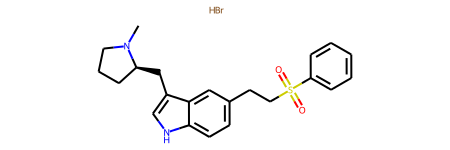

In [1566]:
M21= mol_list [20]
M21

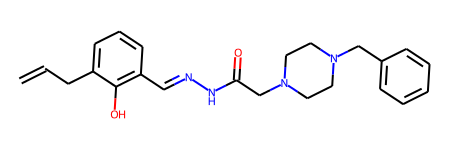

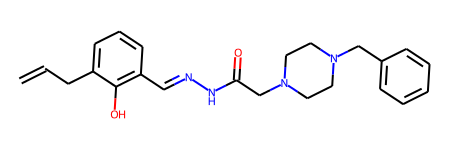

In [1567]:
M22= mol_list [21]
M22

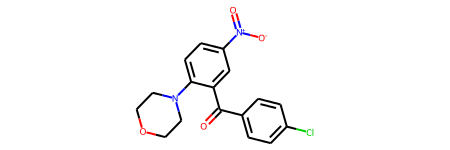

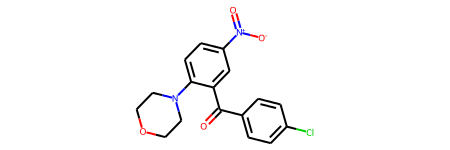

In [1568]:
M23= mol_list [22]
M23

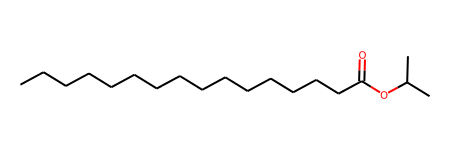

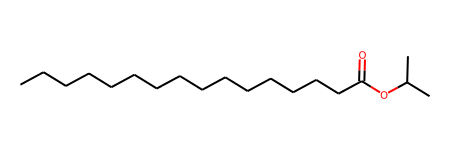

In [1569]:
M24= mol_list [23]
M24

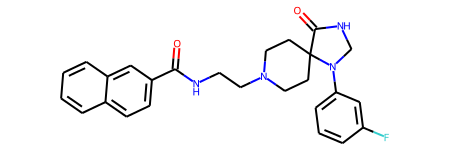

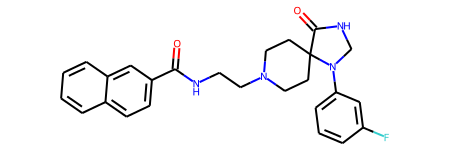

In [1570]:
M25= mol_list [24]
M25

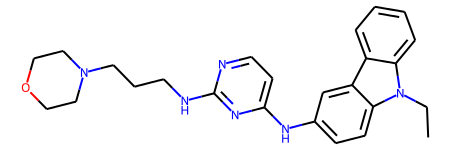

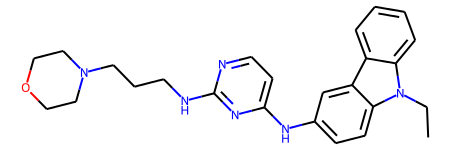

In [1571]:
M26= mol_list [25]
M26

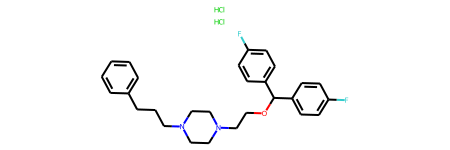

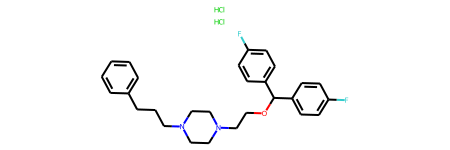

In [1572]:
M27= mol_list [26]
M27

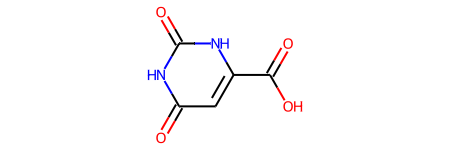

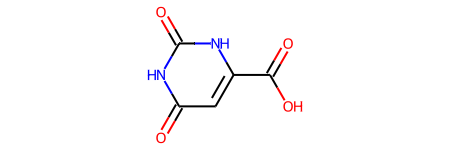

In [1573]:
M28= mol_list [27]
M28

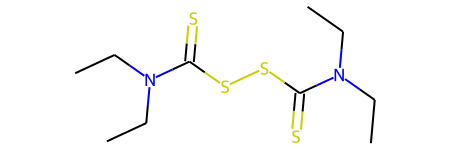

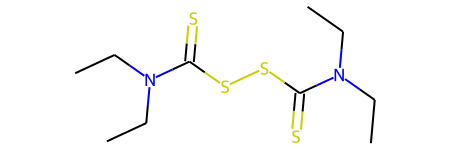

In [1574]:
M29= mol_list [28]
M29

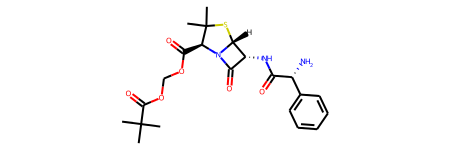

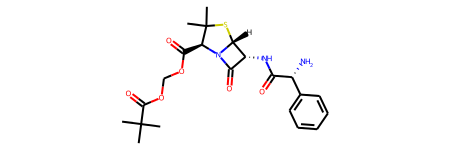

In [1575]:
M30= mol_list [29]
M30

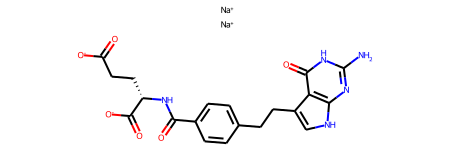

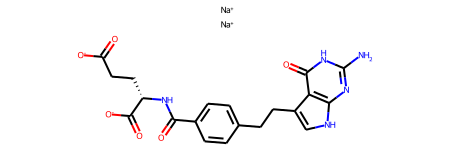

In [1576]:
M31= mol_list [30]
M31

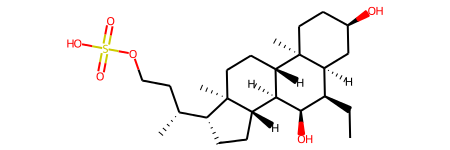

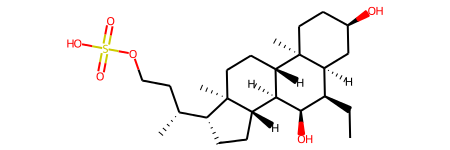

In [1577]:
M32= mol_list [31]
M32

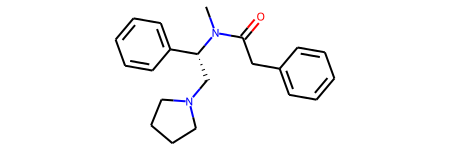

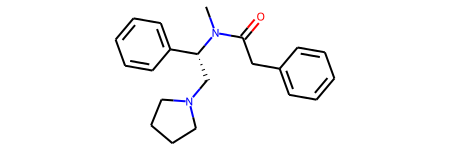

In [1578]:
M33= mol_list [32]
M33

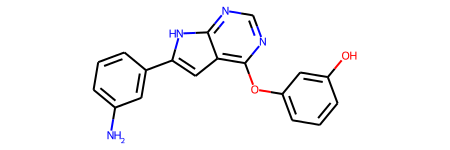

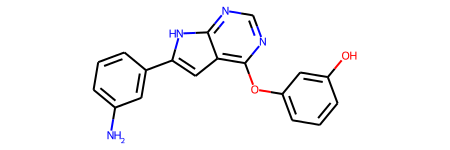

In [1579]:
M34= mol_list [33]
M34

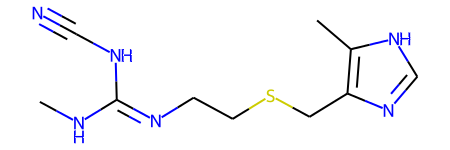

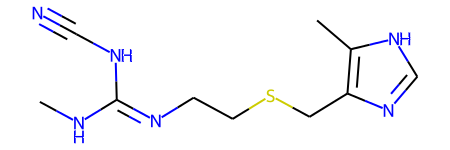

In [1580]:
M35= mol_list [34]
M35

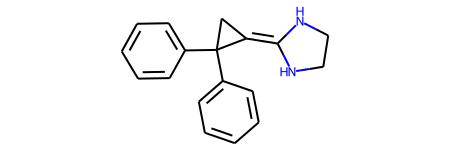

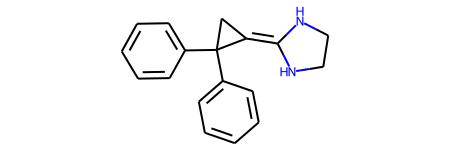

In [1581]:
M36= mol_list [35]
M36

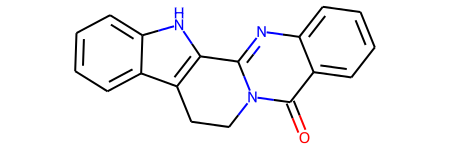

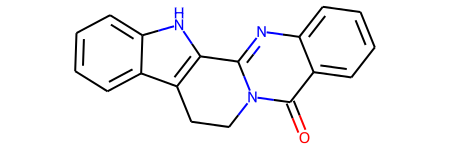

In [1582]:
M37= mol_list [36]
M37

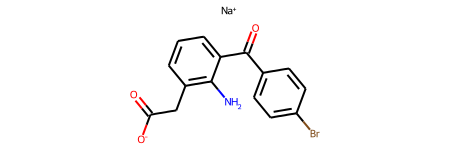

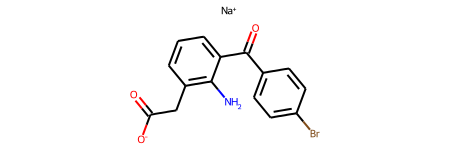

In [1583]:
M38= mol_list [37]
M38


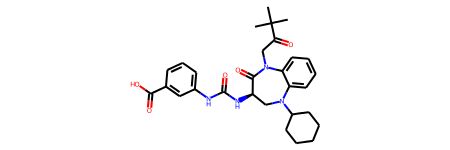

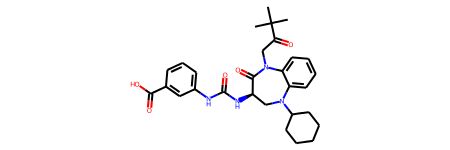

In [1584]:
M39= mol_list [38]
M39

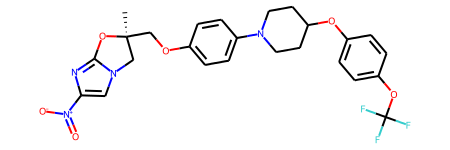

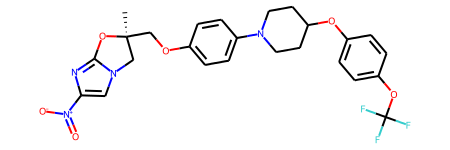

In [1585]:
M40= mol_list [39]
M40

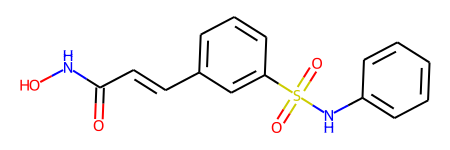

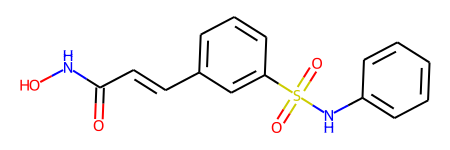

In [1586]:
M41= mol_list [40]
M41

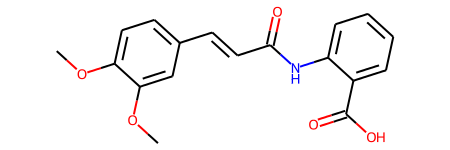

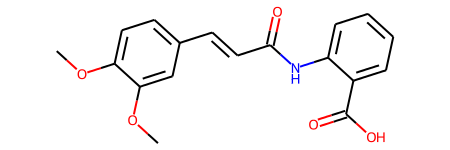

In [1587]:
M42= mol_list [41]
M42

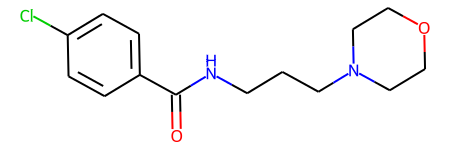

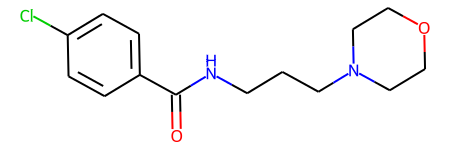

In [1588]:
M43= mol_list [42]
M43

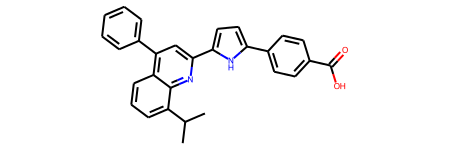

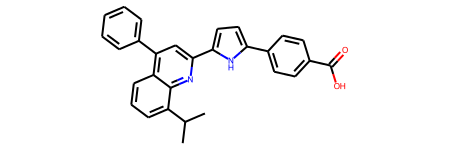

In [1589]:
M44= mol_list [43]
M44

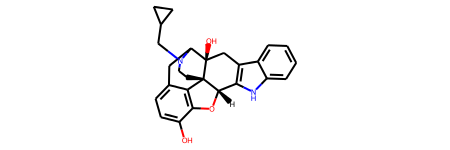

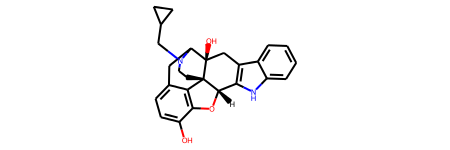

In [1590]:
M45= mol_list [44]
M45

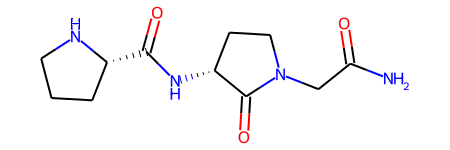

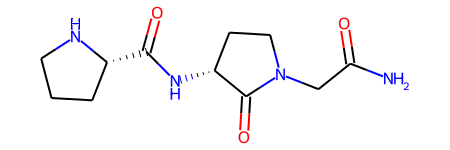

In [1591]:
M46= mol_list [45]
M46

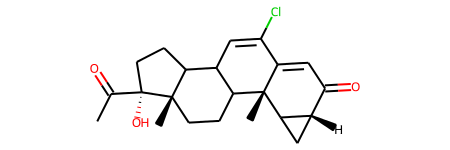

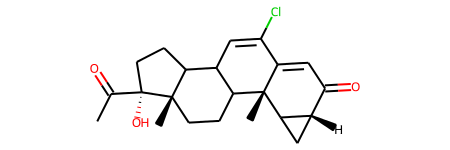

In [1592]:
M47= mol_list [46]
M47

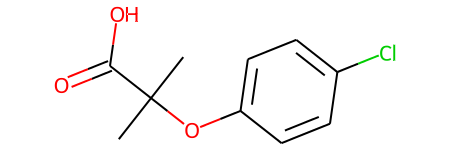

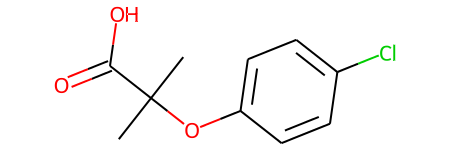

In [1593]:
M48= mol_list [47]
M48

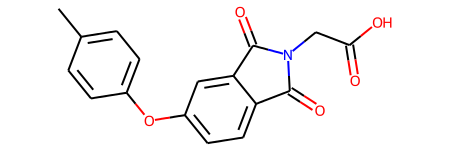

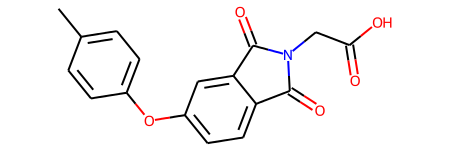

In [1594]:
M49= mol_list [48]
M49

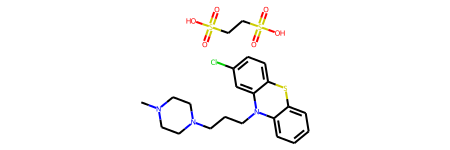

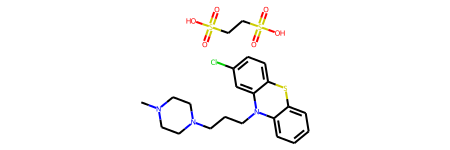

In [1595]:
M50= mol_list [49]
M50

In [1596]:
bi = {}

fp= AllChem.GetMorganFingerprintAsBitVect(M1, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp, fp_arr)
np.nonzero(fp_arr)
list(fp.GetOnBits())

[1,
 4,
 33,
 54,
 64,
 90,
 128,
 147,
 175,
 185,
 195,
 301,
 305,
 325,
 341,
 356,
 389,
 436,
 456,
 483,
 514,
 557,
 604,
 650,
 652,
 695,
 717,
 726,
 784,
 807,
 841,
 849,
 888,
 890,
 893,
 926,
 1019]

[1,
 4,
 33,
 54,
 64,
 90,
 128,
 147,
 175,
 185,
 195,
 301,
 305,
 325,
 341,
 356,
 389,
 436,
 456,
 483,
 514,
 557,
 604,
 650,
 652,
 695,
 717,
 726,
 784,
 807,
 841,
 849,
 888,
 890,
 893,
 926,
 1019]

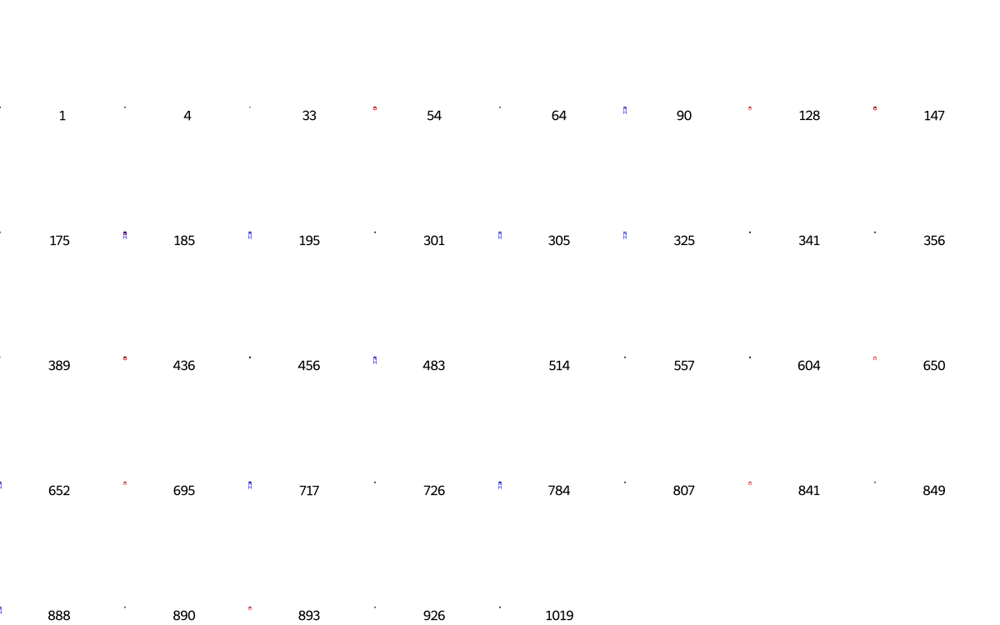

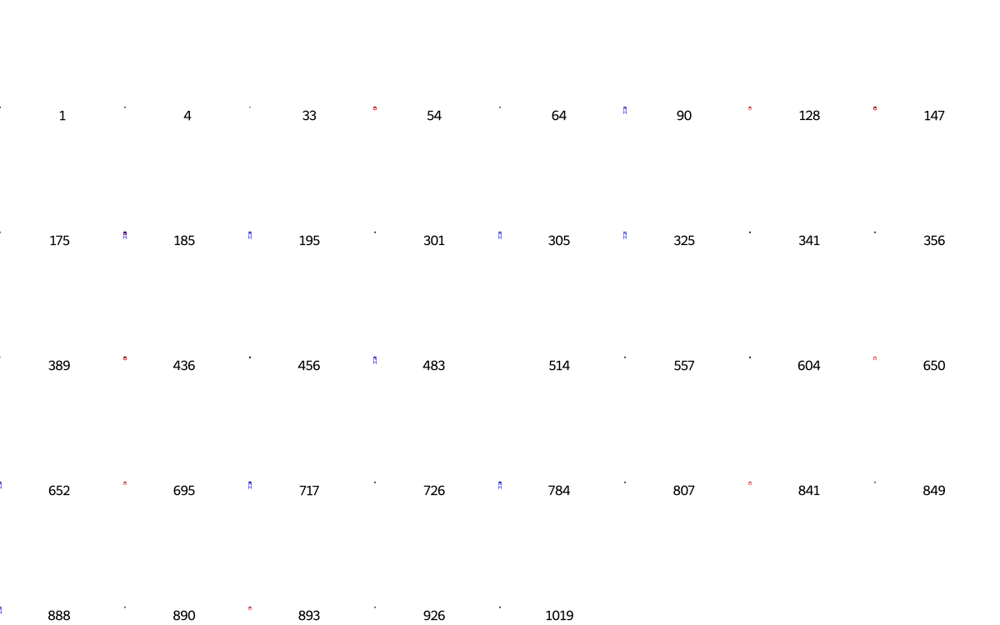

In [1597]:
prints = [(M1, x, bi) for x in fp.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp.GetOnBits ()])

In [1598]:
bi = {}

fp2= AllChem.GetMorganFingerprintAsBitVect(M2, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp2, fp_arr)
np.nonzero(fp_arr)
list(fp2.GetOnBits())

[13,
 33,
 64,
 80,
 110,
 119,
 140,
 147,
 175,
 225,
 294,
 309,
 356,
 386,
 420,
 423,
 428,
 494,
 500,
 591,
 650,
 695,
 726,
 794,
 807,
 849,
 887,
 890,
 893,
 946,
 967]

[13,
 33,
 64,
 80,
 110,
 119,
 140,
 147,
 175,
 225,
 294,
 309,
 356,
 386,
 420,
 423,
 428,
 494,
 500,
 591,
 650,
 695,
 726,
 794,
 807,
 849,
 887,
 890,
 893,
 946,
 967]

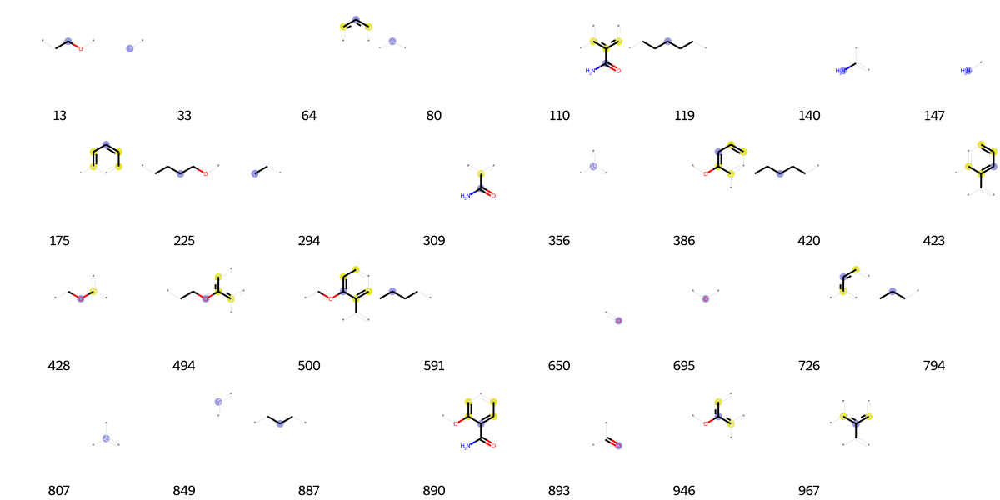

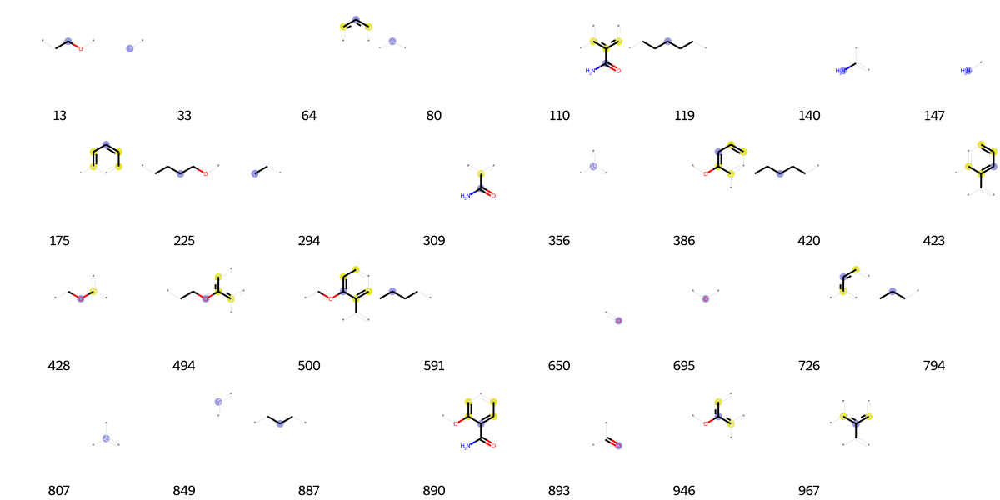

In [1599]:
prints = [(M2, x, bi) for x in fp2.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp2.GetOnBits ()])

In [1600]:
bi = {}

fp3= AllChem.GetMorganFingerprintAsBitVect(M3, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp3, fp_arr)
np.nonzero(fp_arr)
list(fp3.GetOnBits())

[36,
 57,
 64,
 90,
 113,
 129,
 130,
 147,
 160,
 175,
 176,
 276,
 314,
 342,
 350,
 352,
 356,
 366,
 392,
 436,
 452,
 484,
 556,
 561,
 583,
 633,
 650,
 659,
 666,
 691,
 726,
 807,
 833,
 849,
 861,
 875,
 884,
 889,
 956,
 984,
 987]

[36,
 57,
 64,
 90,
 113,
 129,
 130,
 147,
 160,
 175,
 176,
 276,
 314,
 342,
 350,
 352,
 356,
 366,
 392,
 436,
 452,
 484,
 556,
 561,
 583,
 633,
 650,
 659,
 666,
 691,
 726,
 807,
 833,
 849,
 861,
 875,
 884,
 889,
 956,
 984,
 987]

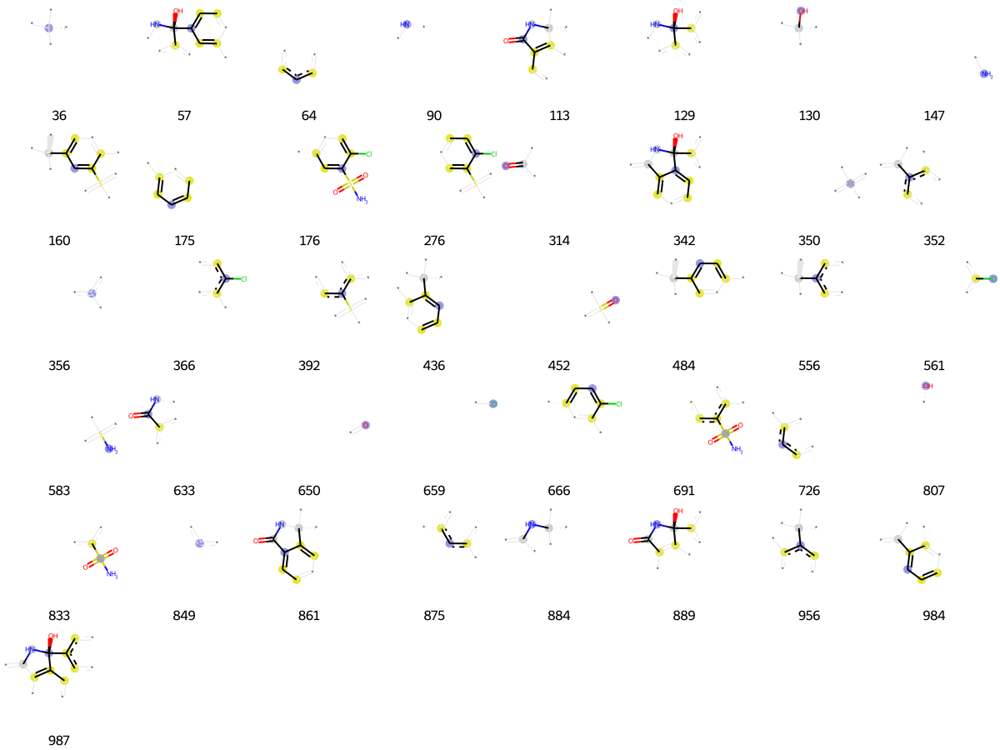

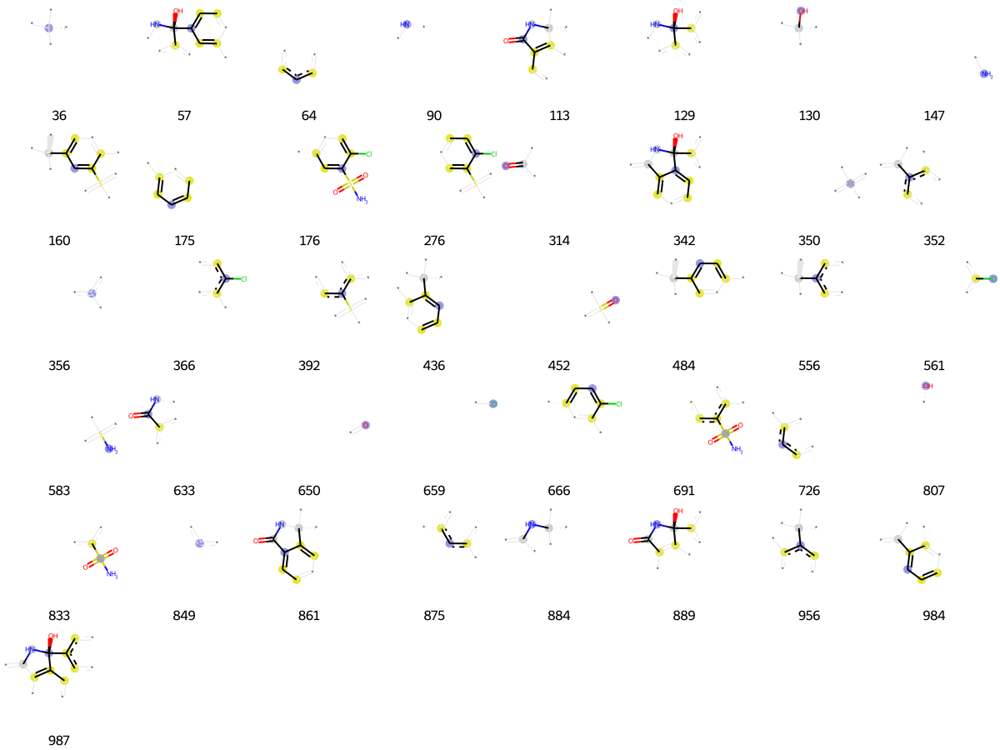

In [1601]:
prints = [(M3, x, bi) for x in fp3.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp3.GetOnBits ()])

In [1602]:
bi = {}

fp4= AllChem.GetMorganFingerprintAsBitVect(M4, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp4, fp_arr)
np.nonzero(fp_arr)
list(fp4.GetOnBits())

[1,
 51,
 73,
 79,
 80,
 138,
 289,
 310,
 341,
 345,
 356,
 360,
 578,
 674,
 726,
 727,
 730,
 745,
 754,
 790,
 807,
 829,
 849,
 857,
 905]

[1,
 51,
 73,
 79,
 80,
 138,
 289,
 310,
 341,
 345,
 356,
 360,
 578,
 674,
 726,
 727,
 730,
 745,
 754,
 790,
 807,
 829,
 849,
 857,
 905]

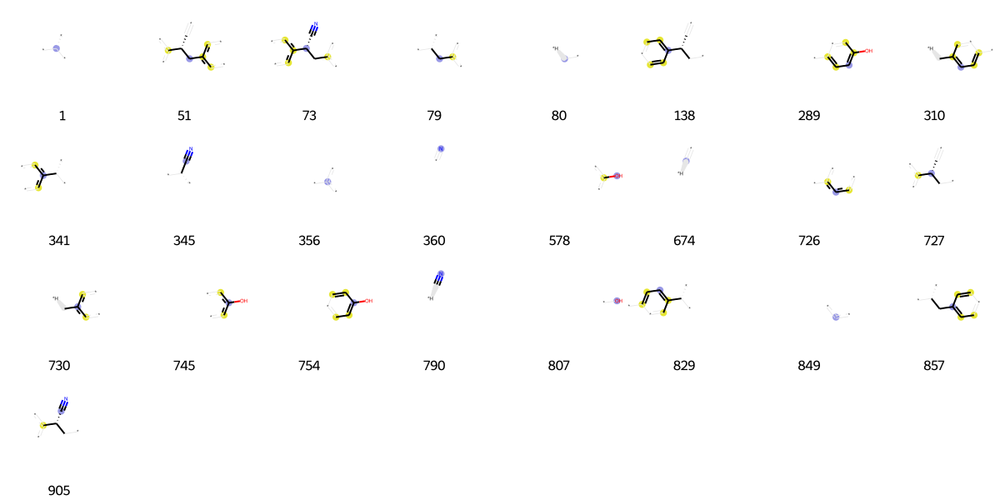

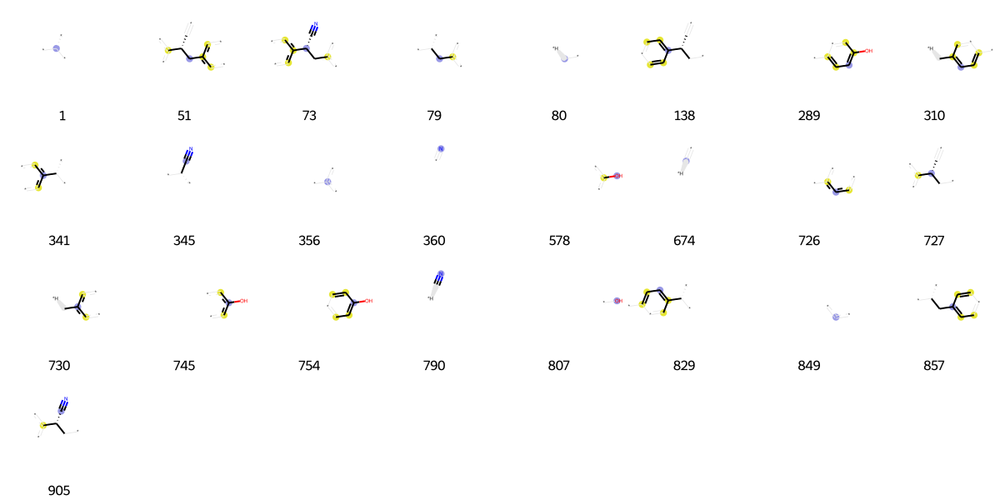

In [1603]:
prints = [(M4, x, bi) for x in fp4.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp4.GetOnBits ()])

In [1604]:
bi = {}

fp5= AllChem.GetMorganFingerprintAsBitVect(M5, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp5, fp_arr)
np.nonzero(fp_arr)
list(fp5.GetOnBits())

[1,
 23,
 33,
 42,
 64,
 80,
 86,
 117,
 128,
 147,
 163,
 175,
 238,
 283,
 294,
 304,
 356,
 389,
 458,
 488,
 508,
 573,
 591,
 629,
 635,
 650,
 680,
 694,
 695,
 726,
 730,
 734,
 736,
 739,
 745,
 759,
 794,
 807,
 823,
 849,
 887,
 890,
 893,
 905,
 953,
 1004,
 1018]

[1,
 23,
 33,
 42,
 64,
 80,
 86,
 117,
 128,
 147,
 163,
 175,
 238,
 283,
 294,
 304,
 356,
 389,
 458,
 488,
 508,
 573,
 591,
 629,
 635,
 650,
 680,
 694,
 695,
 726,
 730,
 734,
 736,
 739,
 745,
 759,
 794,
 807,
 823,
 849,
 887,
 890,
 893,
 905,
 953,
 1004,
 1018]

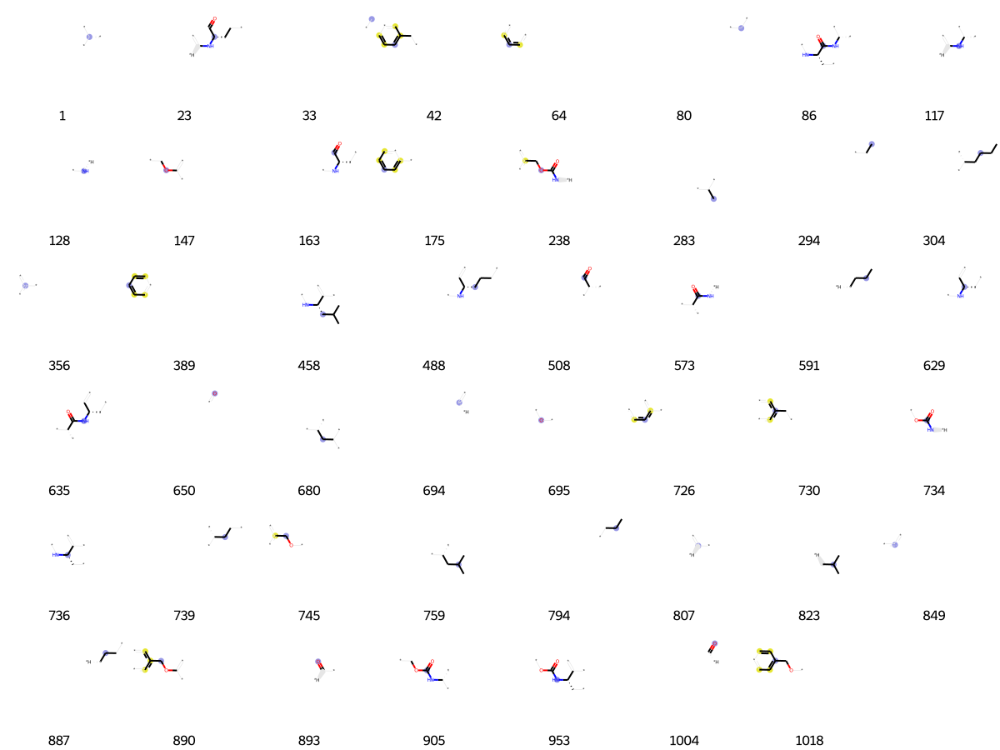

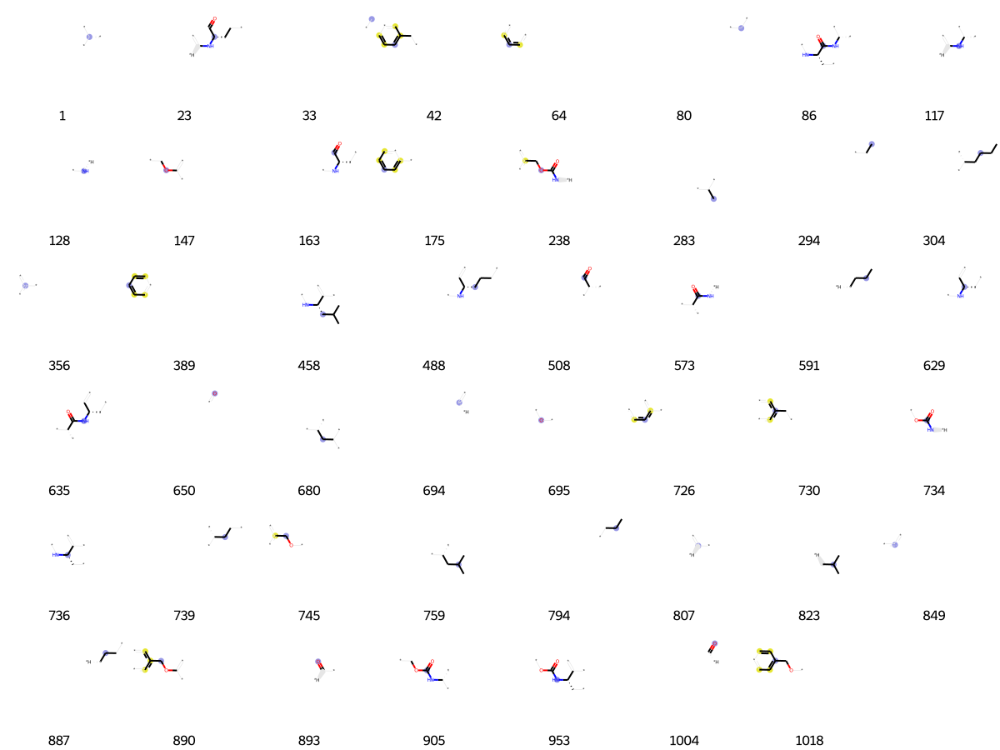

In [1605]:
prints = [(M5, x, bi) for x in fp5.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp5.GetOnBits ()])

In [1606]:
bi = {}

fp7= AllChem.GetMorganFingerprintAsBitVect(M7, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp7, fp_arr)
np.nonzero(fp_arr)
list(fp7.GetOnBits())

[4,
 39,
 67,
 110,
 140,
 147,
 216,
 231,
 270,
 283,
 301,
 309,
 356,
 361,
 367,
 370,
 392,
 441,
 461,
 466,
 534,
 650,
 656,
 699,
 701,
 707,
 726,
 807,
 809,
 816,
 849,
 881,
 893,
 899,
 904,
 926,
 953,
 967,
 1019,
 1021]

[4,
 39,
 67,
 110,
 140,
 147,
 216,
 231,
 270,
 283,
 301,
 309,
 356,
 361,
 367,
 370,
 392,
 441,
 461,
 466,
 534,
 650,
 656,
 699,
 701,
 707,
 726,
 807,
 809,
 816,
 849,
 881,
 893,
 899,
 904,
 926,
 953,
 967,
 1019,
 1021]

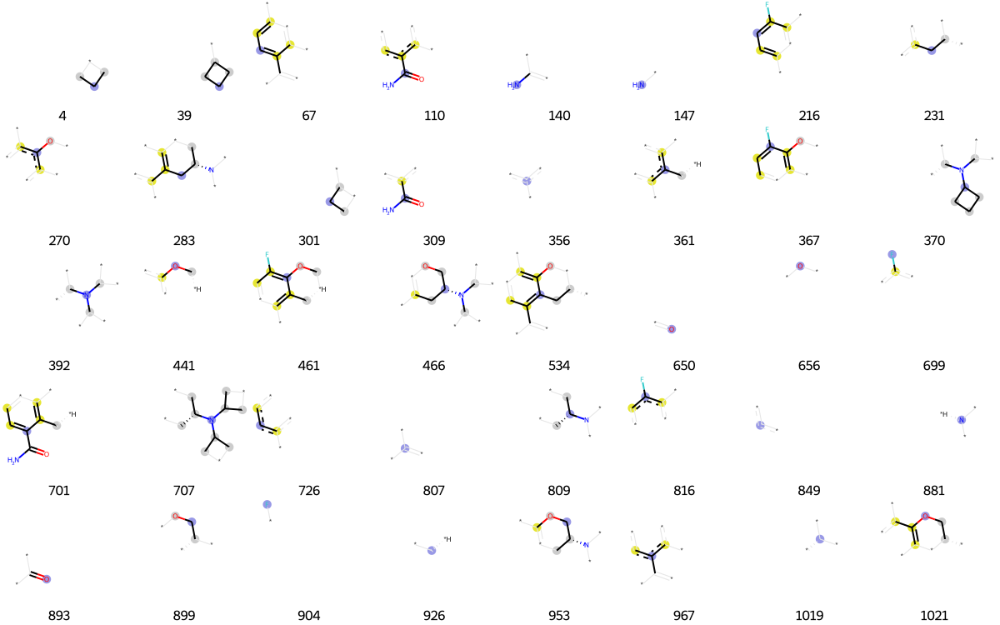

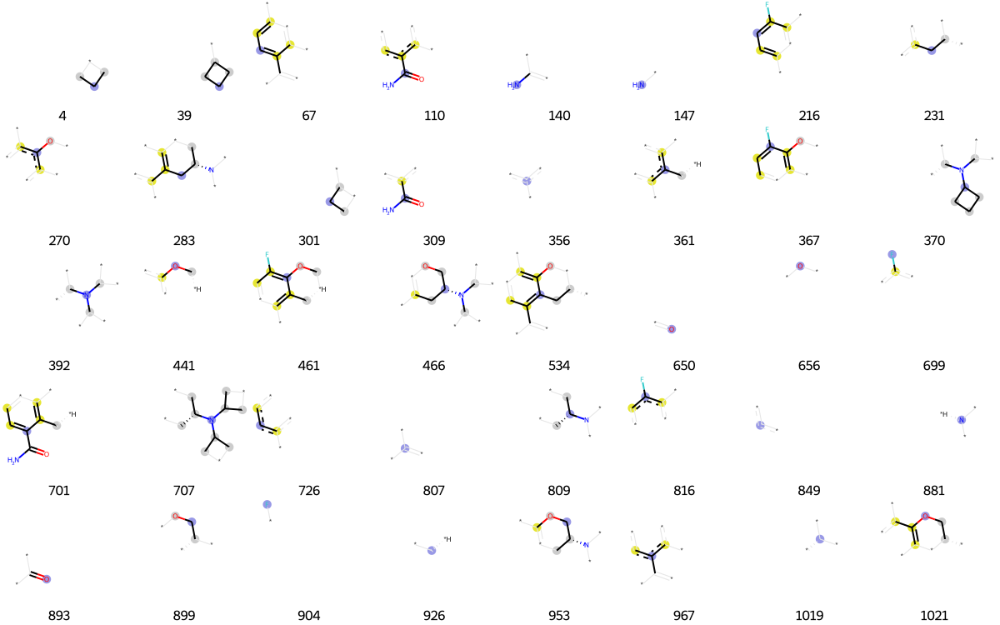

In [1607]:
prints = [(M7, x, bi) for x in fp7.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp7.GetOnBits ()])

In [1608]:
bi = {}

fp8= AllChem.GetMorganFingerprintAsBitVect(M8, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp8, fp_arr)
np.nonzero(fp_arr)
list(fp8.GetOnBits())

[5,
 25,
 27,
 33,
 34,
 64,
 80,
 90,
 152,
 175,
 255,
 294,
 301,
 314,
 356,
 389,
 550,
 588,
 608,
 639,
 650,
 726,
 849,
 926,
 935,
 954,
 969,
 1019]

[5,
 25,
 27,
 33,
 34,
 64,
 80,
 90,
 152,
 175,
 255,
 294,
 301,
 314,
 356,
 389,
 550,
 588,
 608,
 639,
 650,
 726,
 849,
 926,
 935,
 954,
 969,
 1019]

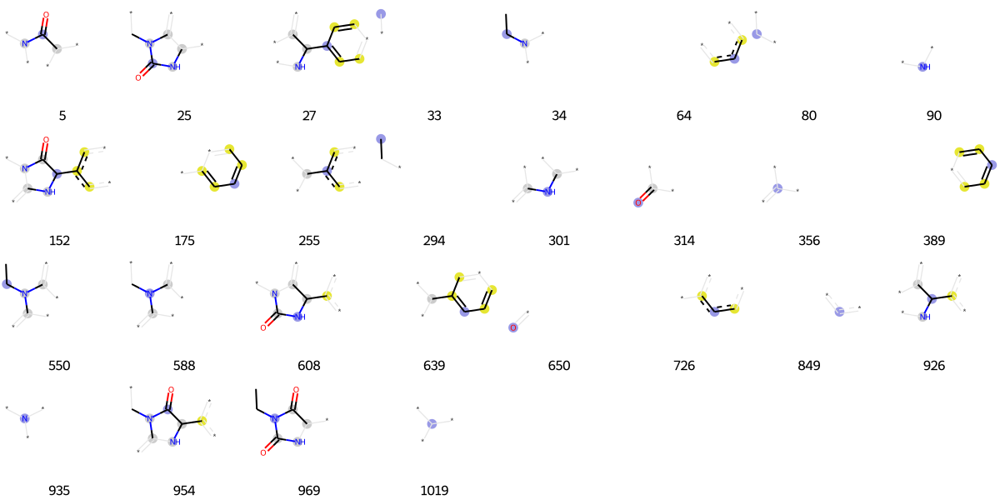

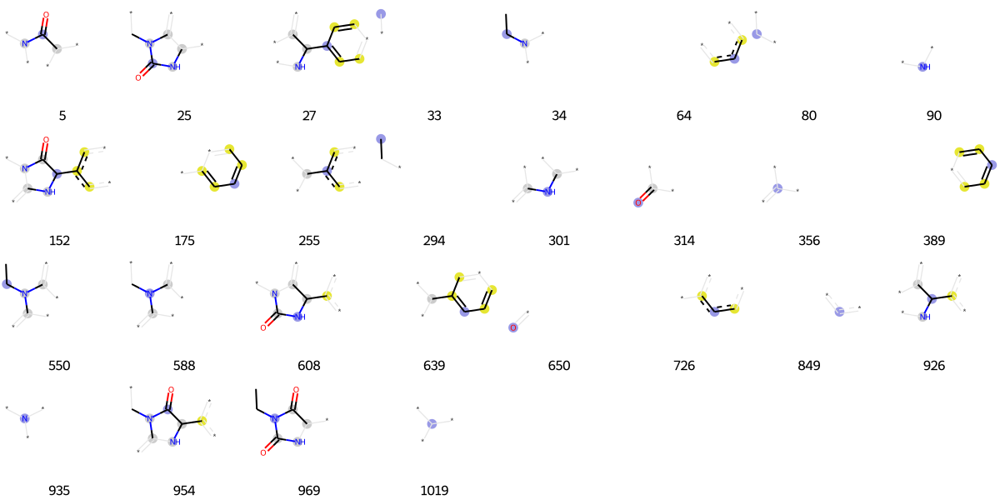

In [1609]:
prints = [(M8, x, bi) for x in fp8.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp8.GetOnBits ()])


In [1610]:
bi = {}

fp9= AllChem.GetMorganFingerprintAsBitVect(M9, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp9, fp_arr)
np.nonzero(fp_arr)
list(fp9.GetOnBits())

[33,
 36,
 130,
 139,
 140,
 147,
 164,
 233,
 253,
 268,
 272,
 309,
 314,
 317,
 356,
 366,
 371,
 423,
 432,
 435,
 447,
 451,
 452,
 455,
 499,
 514,
 519,
 525,
 558,
 561,
 578,
 583,
 588,
 606,
 620,
 624,
 636,
 650,
 658,
 659,
 666,
 673,
 723,
 726,
 736,
 764,
 807,
 824,
 829,
 849,
 874,
 881,
 893,
 926,
 933,
 945,
 1005,
 1007,
 1019]

[33,
 36,
 130,
 139,
 140,
 147,
 164,
 233,
 253,
 268,
 272,
 309,
 314,
 317,
 356,
 366,
 371,
 423,
 432,
 435,
 447,
 451,
 452,
 455,
 499,
 514,
 519,
 525,
 558,
 561,
 578,
 583,
 588,
 606,
 620,
 624,
 636,
 650,
 658,
 659,
 666,
 673,
 723,
 726,
 736,
 764,
 807,
 824,
 829,
 849,
 874,
 881,
 893,
 926,
 933,
 945,
 1005,
 1007,
 1019]

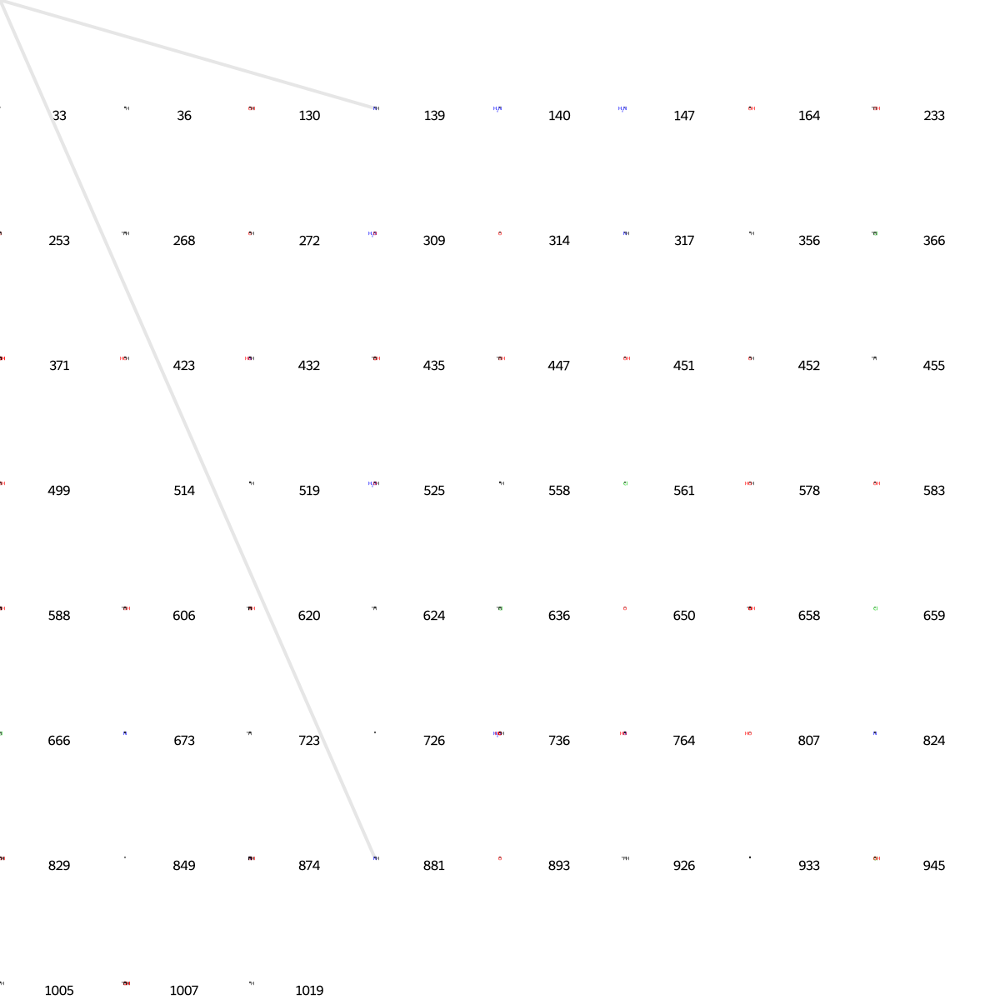

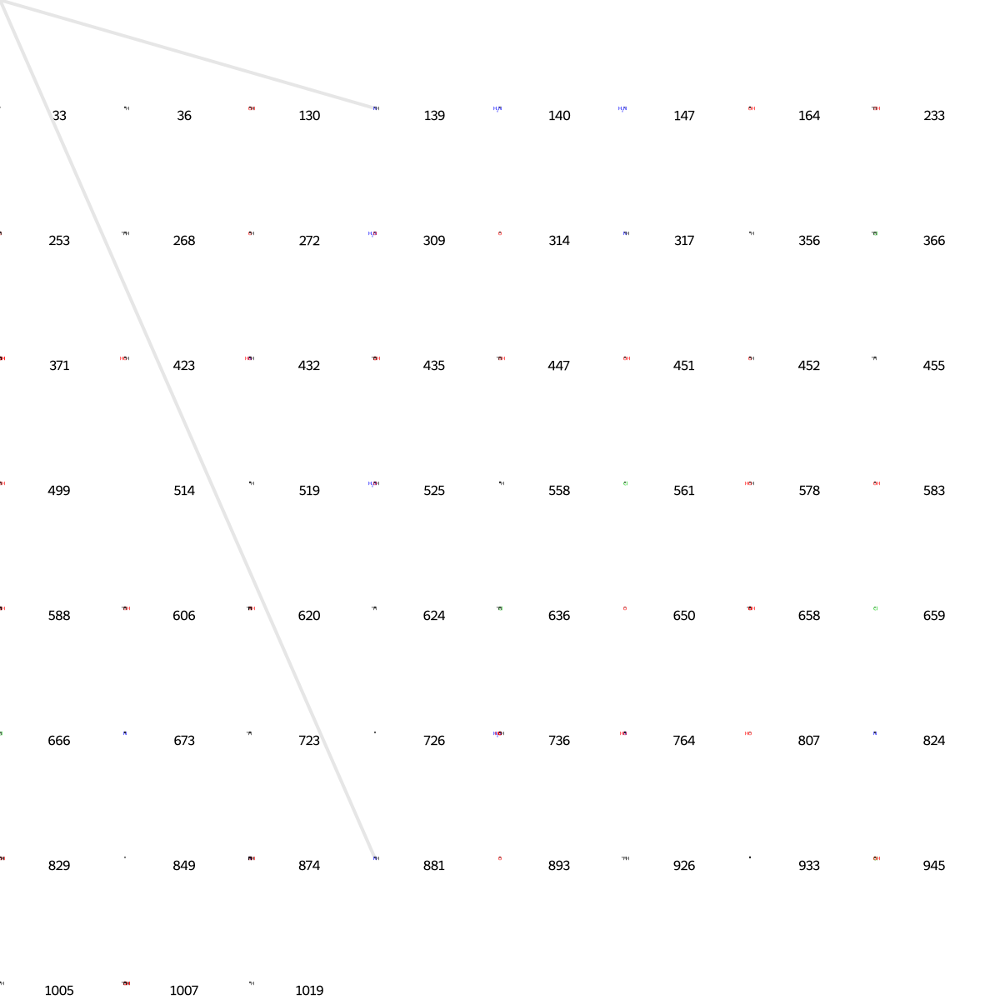

In [1611]:
prints = [(M9, x, bi) for x in fp9.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp9.GetOnBits ()])

In [1612]:
bi = {}

fp10= AllChem.GetMorganFingerprintAsBitVect(M10, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp10, fp_arr)
np.nonzero(fp_arr)
list(fp10.GetOnBits())

[8,
 15,
 33,
 64,
 80,
 128,
 200,
 235,
 325,
 346,
 356,
 366,
 381,
 383,
 389,
 420,
 468,
 491,
 561,
 650,
 659,
 698,
 699,
 701,
 713,
 726,
 793,
 799,
 807,
 816,
 832,
 849,
 875,
 893,
 904,
 914,
 974,
 976,
 1013]

[8,
 15,
 33,
 64,
 80,
 128,
 200,
 235,
 325,
 346,
 356,
 366,
 381,
 383,
 389,
 420,
 468,
 491,
 561,
 650,
 659,
 698,
 699,
 701,
 713,
 726,
 793,
 799,
 807,
 816,
 832,
 849,
 875,
 893,
 904,
 914,
 974,
 976,
 1013]

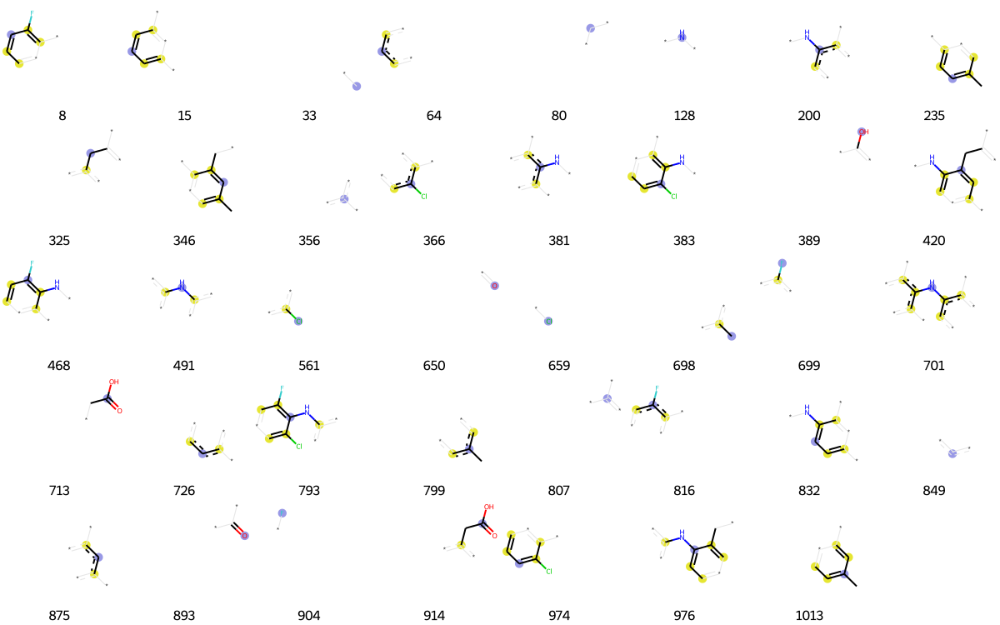

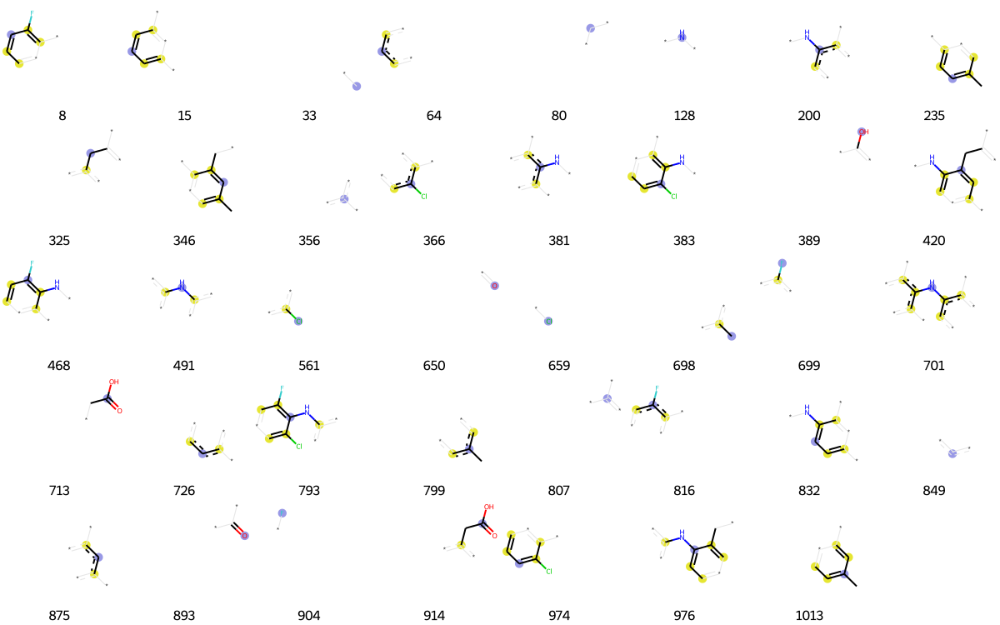

In [1613]:
prints = [(M10, x, bi) for x in fp10.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp10.GetOnBits ()])

In [1614]:
bi = {}

fp12= AllChem.GetMorganFingerprintAsBitVect(M12, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp12, fp_arr)
np.nonzero(fp_arr)
list(fp12.GetOnBits())

[15,
 25,
 53,
 63,
 64,
 65,
 80,
 128,
 133,
 134,
 184,
 195,
 288,
 332,
 333,
 348,
 350,
 356,
 378,
 392,
 428,
 452,
 502,
 511,
 535,
 562,
 579,
 600,
 602,
 607,
 625,
 647,
 650,
 667,
 694,
 726,
 728,
 732,
 733,
 831,
 835,
 842,
 849,
 878,
 897,
 909,
 992,
 1004,
 1009,
 1020]

[15,
 25,
 53,
 63,
 64,
 65,
 80,
 128,
 133,
 134,
 184,
 195,
 288,
 332,
 333,
 348,
 350,
 356,
 378,
 392,
 428,
 452,
 502,
 511,
 535,
 562,
 579,
 600,
 602,
 607,
 625,
 647,
 650,
 667,
 694,
 726,
 728,
 732,
 733,
 831,
 835,
 842,
 849,
 878,
 897,
 909,
 992,
 1004,
 1009,
 1020]

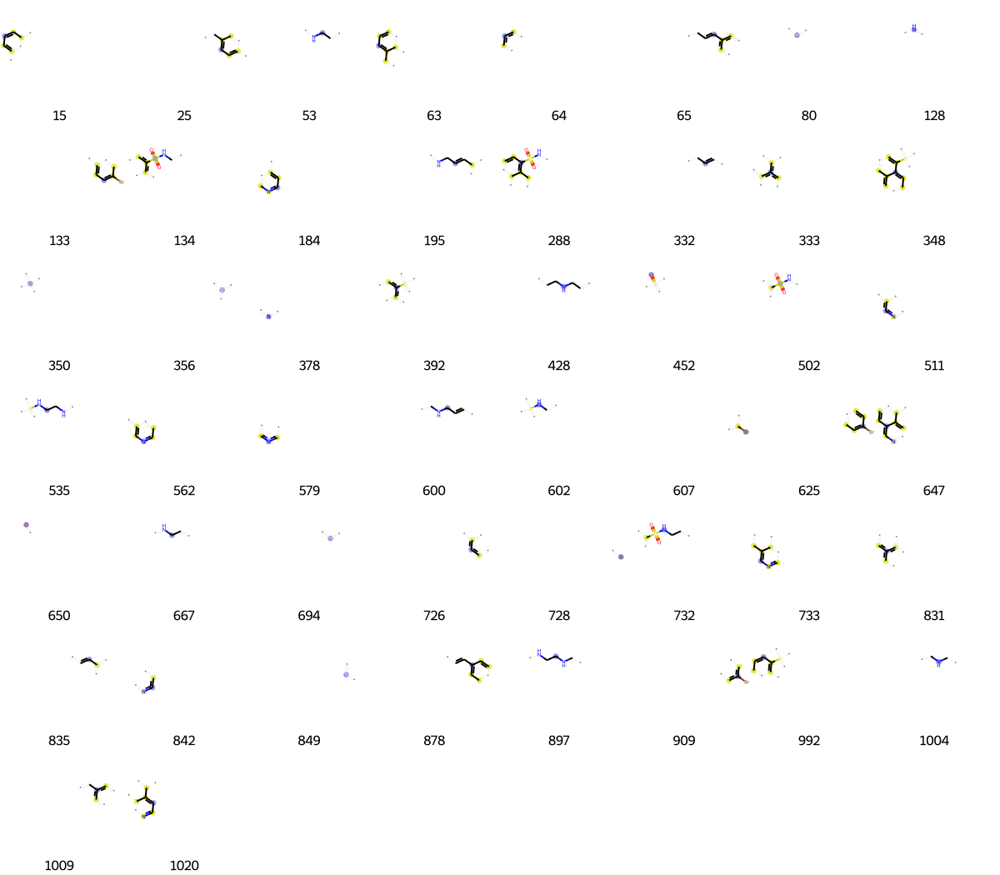

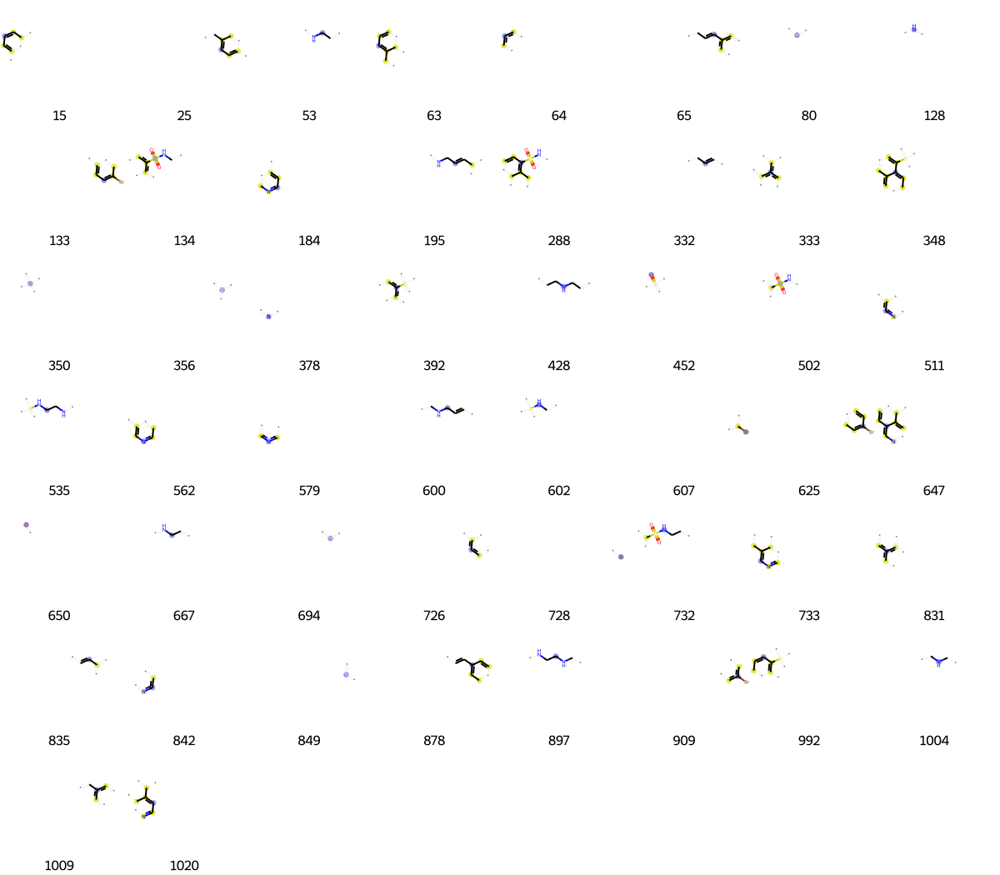

In [1615]:
prints = [(M12, x, bi) for x in fp12.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp12.GetOnBits ()])

In [1616]:
bi = {}

fp13= AllChem.GetMorganFingerprintAsBitVect(M13, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp13, fp_arr)
np.nonzero(fp_arr)
list(fp13.GetOnBits())

/usr/local/lib/python3.7/dist-packages/IPython/core/displayhook.py:260: UserWarning: Output cache limit (currently 1000 entries) hit.
Flushing oldest 200 entries.
  'Flushing oldest {cull_count} entries.'.format(sz=sz, cull_count=cull_count))


[1,
 7,
 8,
 16,
 33,
 36,
 80,
 105,
 138,
 146,
 231,
 233,
 243,
 250,
 283,
 301,
 302,
 356,
 377,
 406,
 439,
 453,
 490,
 504,
 519,
 529,
 531,
 562,
 590,
 598,
 622,
 669,
 694,
 696,
 739,
 753,
 757,
 775,
 784,
 807,
 823,
 836,
 849,
 850,
 860,
 887,
 926,
 927,
 1019]

[1,
 7,
 8,
 16,
 33,
 36,
 80,
 105,
 138,
 146,
 231,
 233,
 243,
 250,
 283,
 301,
 302,
 356,
 377,
 406,
 439,
 453,
 490,
 504,
 519,
 529,
 531,
 562,
 590,
 598,
 622,
 669,
 694,
 696,
 739,
 753,
 757,
 775,
 784,
 807,
 823,
 836,
 849,
 850,
 860,
 887,
 926,
 927,
 1019]

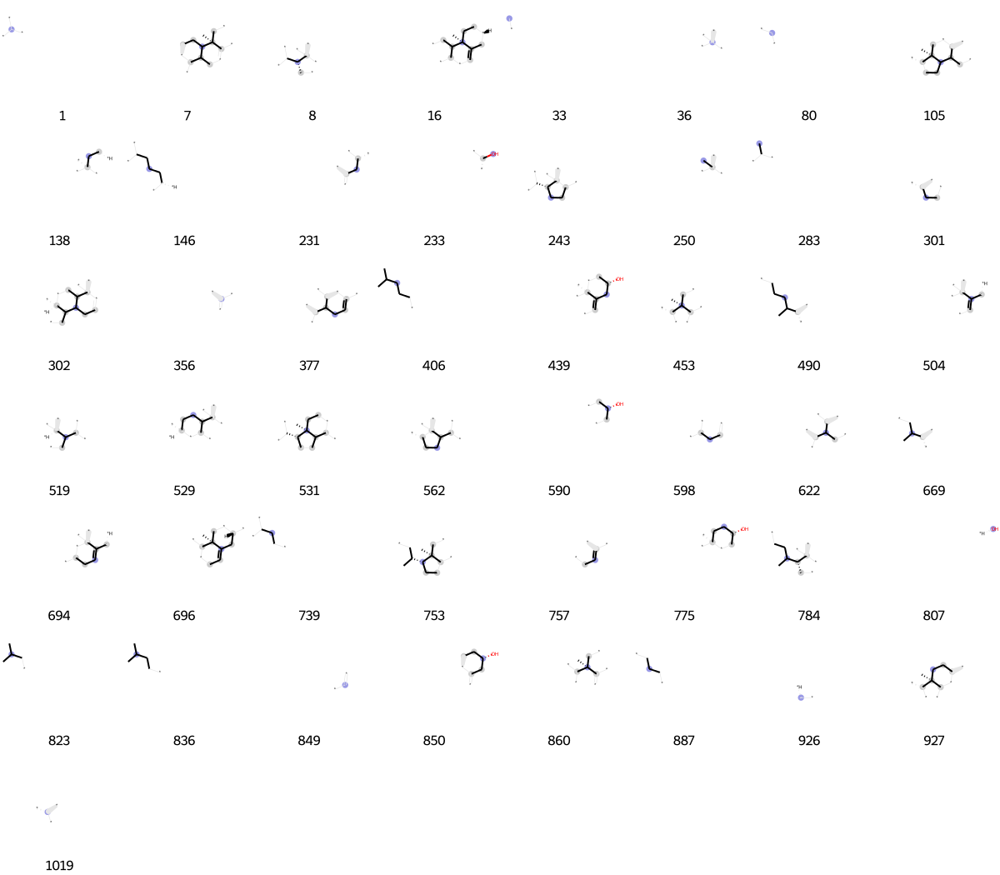

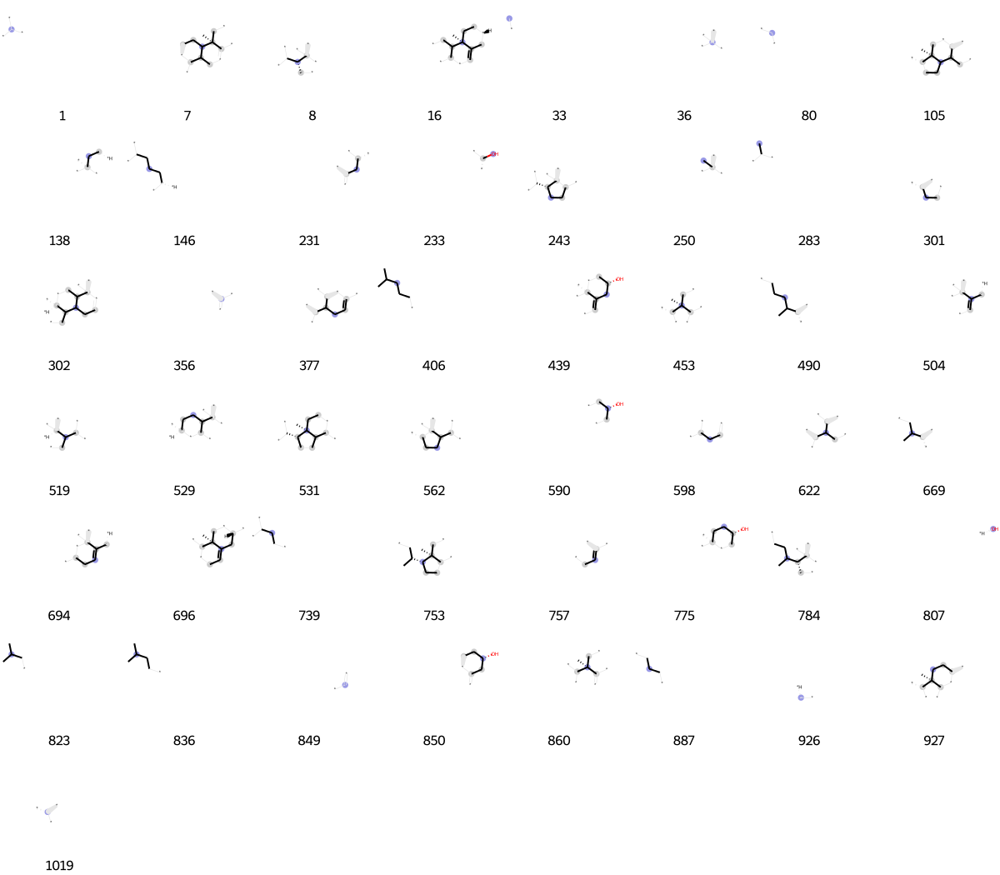

In [1617]:
prints = [(M13, x, bi) for x in fp13.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp13.GetOnBits ()])

In [1618]:
bi = {}

fp14= AllChem.GetMorganFingerprintAsBitVect(M14, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp14, fp_arr)
np.nonzero(fp_arr)
list(fp14.GetOnBits())

[1, 80, 108, 117, 206, 229, 266, 339, 389, 554, 650, 697, 713, 807, 820, 893]

[1, 80, 108, 117, 206, 229, 266, 339, 389, 554, 650, 697, 713, 807, 820, 893]

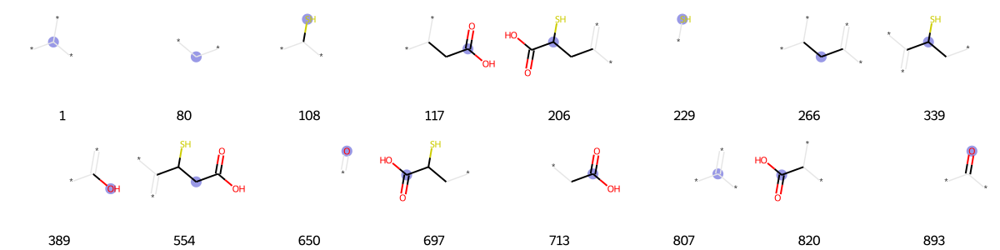

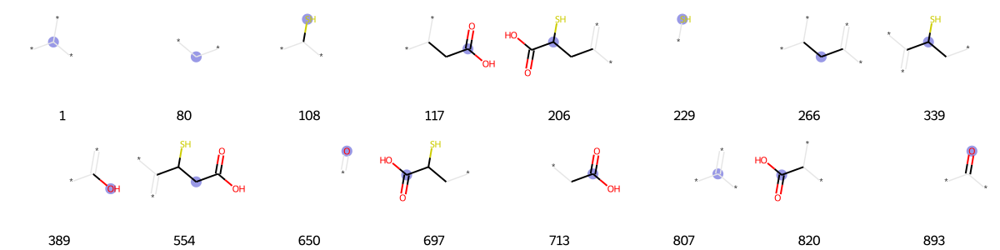

In [1619]:
prints = [(M14, x, bi) for x in fp14.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp14.GetOnBits ()])

In [1620]:
bi = {}

fp15= AllChem.GetMorganFingerprintAsBitVect(M15, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp15, fp_arr)
np.nonzero(fp_arr)
list(fp15.GetOnBits())

[7,
 33,
 36,
 84,
 88,
 130,
 138,
 242,
 250,
 268,
 285,
 301,
 308,
 314,
 356,
 412,
 426,
 460,
 479,
 507,
 519,
 529,
 555,
 563,
 580,
 622,
 645,
 650,
 714,
 738,
 769,
 781,
 790,
 798,
 807,
 835,
 841,
 849,
 860,
 872,
 893,
 926,
 962,
 1017,
 1019]

[7,
 33,
 36,
 84,
 88,
 130,
 138,
 242,
 250,
 268,
 285,
 301,
 308,
 314,
 356,
 412,
 426,
 460,
 479,
 507,
 519,
 529,
 555,
 563,
 580,
 622,
 645,
 650,
 714,
 738,
 769,
 781,
 790,
 798,
 807,
 835,
 841,
 849,
 860,
 872,
 893,
 926,
 962,
 1017,
 1019]

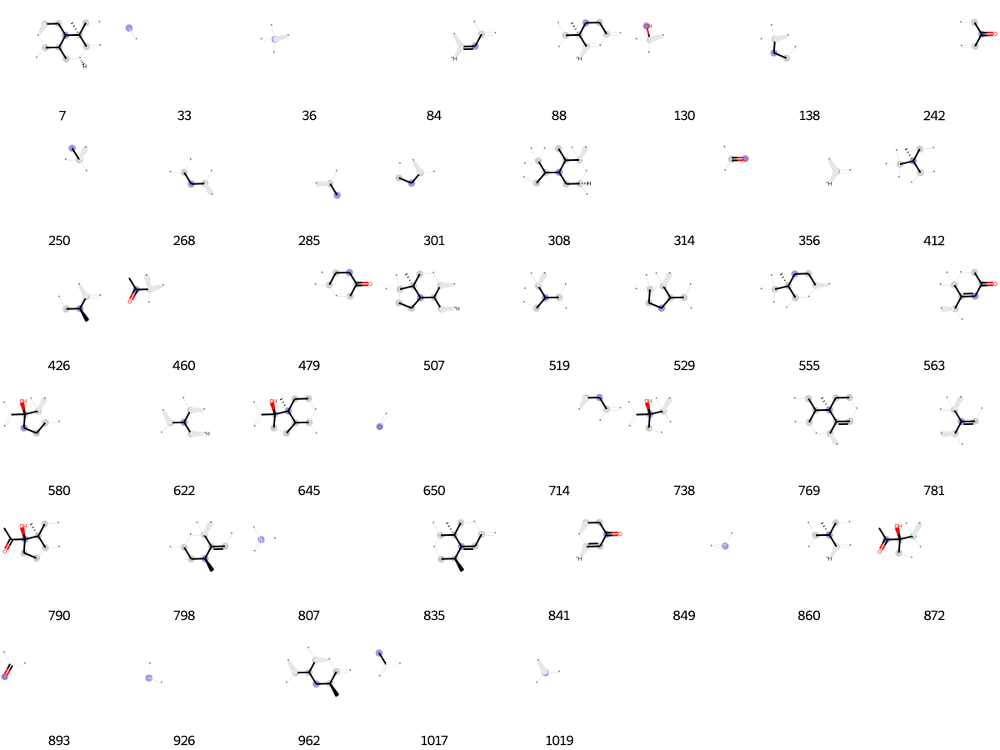

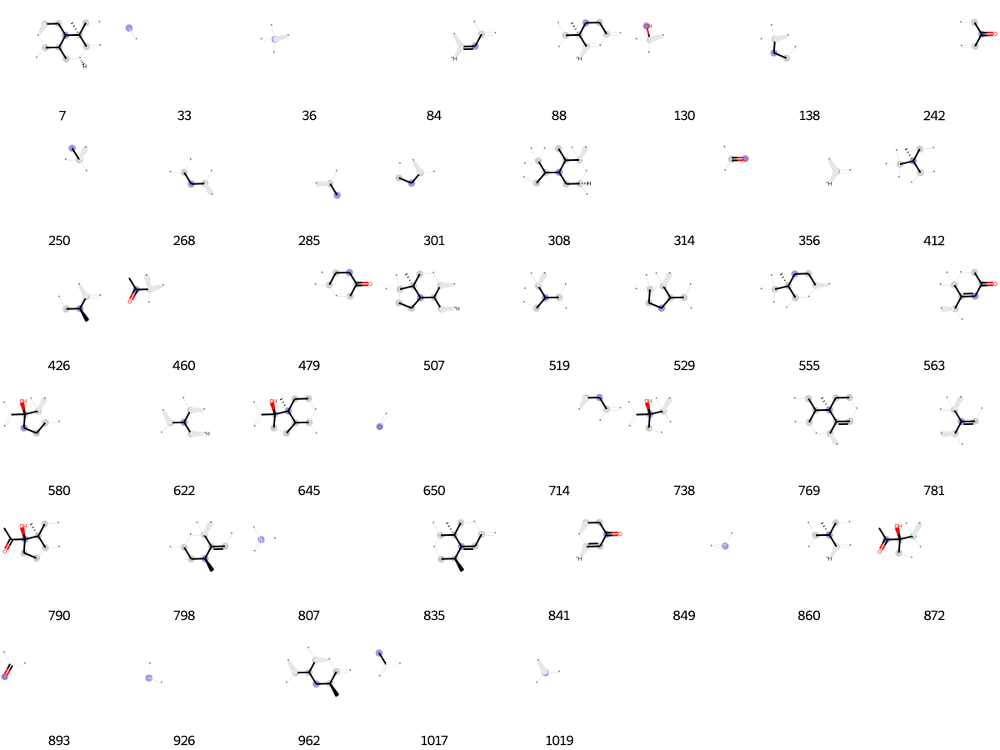

In [1621]:
prints = [(M15, x, bi) for x in fp15.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp15.GetOnBits ()])

In [1622]:
bi = {}

fp16= AllChem.GetMorganFingerprintAsBitVect(M16, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp16, fp_arr)
np.nonzero(fp_arr)
list(fp16.GetOnBits())

[64,
 74,
 80,
 90,
 136,
 175,
 195,
 232,
 327,
 356,
 365,
 378,
 389,
 407,
 428,
 438,
 448,
 456,
 460,
 463,
 484,
 585,
 644,
 674,
 724,
 726,
 736,
 741,
 767,
 782,
 784,
 806,
 825,
 831,
 842,
 849,
 855,
 926,
 935]

[64,
 74,
 80,
 90,
 136,
 175,
 195,
 232,
 327,
 356,
 365,
 378,
 389,
 407,
 428,
 438,
 448,
 456,
 460,
 463,
 484,
 585,
 644,
 674,
 724,
 726,
 736,
 741,
 767,
 782,
 784,
 806,
 825,
 831,
 842,
 849,
 855,
 926,
 935]

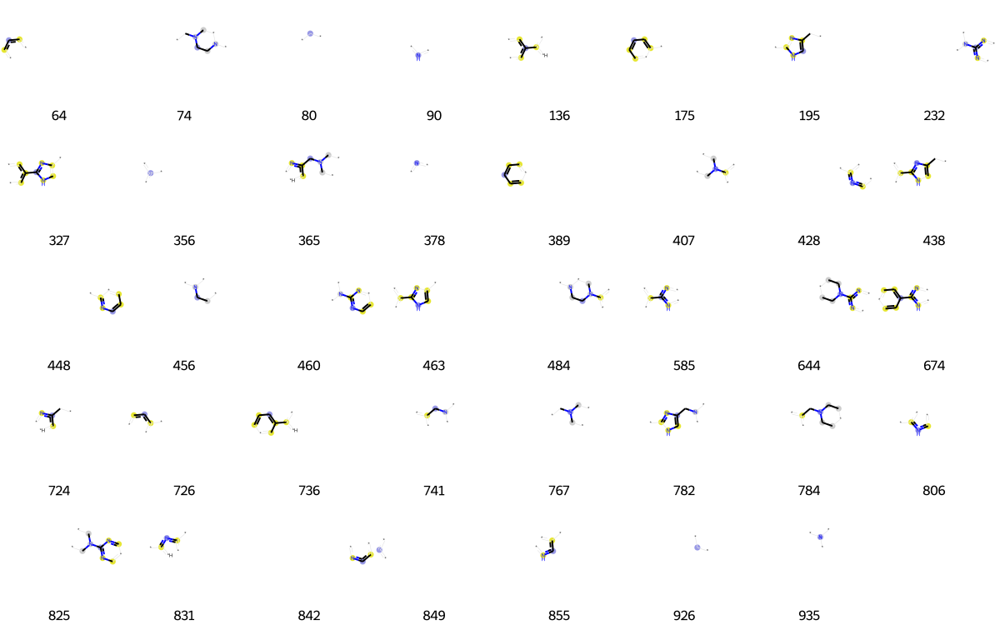

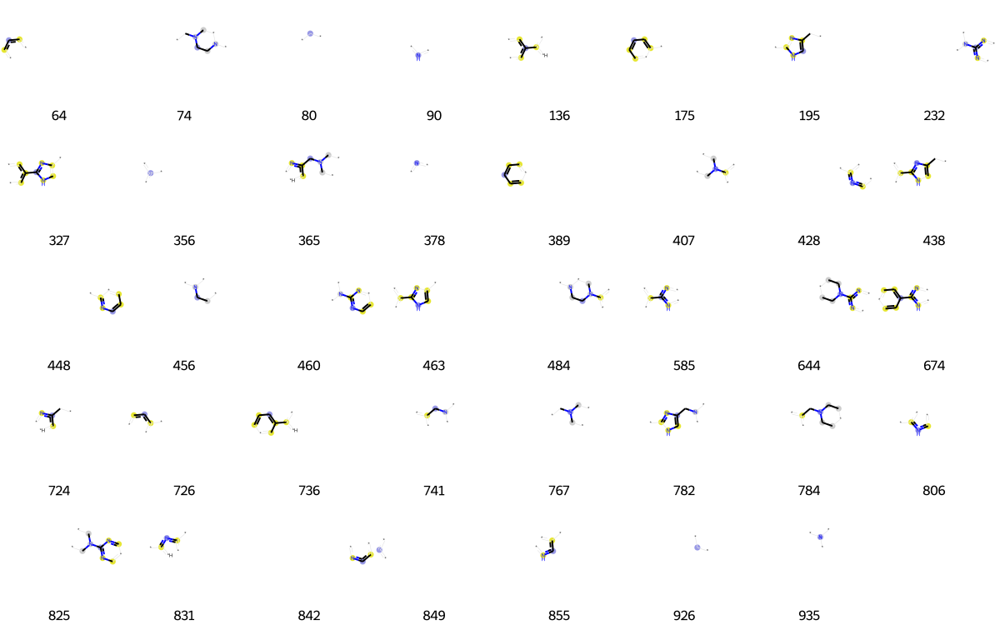

In [1623]:
prints = [(M16, x, bi) for x in fp16.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp16.GetOnBits ()])

In [1624]:
bi = {}

fp17= AllChem.GetMorganFingerprintAsBitVect(M17, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp17, fp_arr)
np.nonzero(fp_arr)
list(fp17.GetOnBits())

[1,
 4,
 15,
 24,
 33,
 36,
 47,
 64,
 75,
 80,
 90,
 117,
 128,
 136,
 143,
 165,
 214,
 216,
 222,
 225,
 265,
 283,
 291,
 321,
 341,
 352,
 356,
 366,
 378,
 391,
 428,
 482,
 486,
 499,
 511,
 557,
 561,
 562,
 592,
 650,
 659,
 671,
 690,
 721,
 726,
 738,
 803,
 806,
 807,
 849,
 855,
 861,
 875,
 893,
 982,
 998,
 1003]

[1,
 4,
 15,
 24,
 33,
 36,
 47,
 64,
 75,
 80,
 90,
 117,
 128,
 136,
 143,
 165,
 214,
 216,
 222,
 225,
 265,
 283,
 291,
 321,
 341,
 352,
 356,
 366,
 378,
 391,
 428,
 482,
 486,
 499,
 511,
 557,
 561,
 562,
 592,
 650,
 659,
 671,
 690,
 721,
 726,
 738,
 803,
 806,
 807,
 849,
 855,
 861,
 875,
 893,
 982,
 998,
 1003]

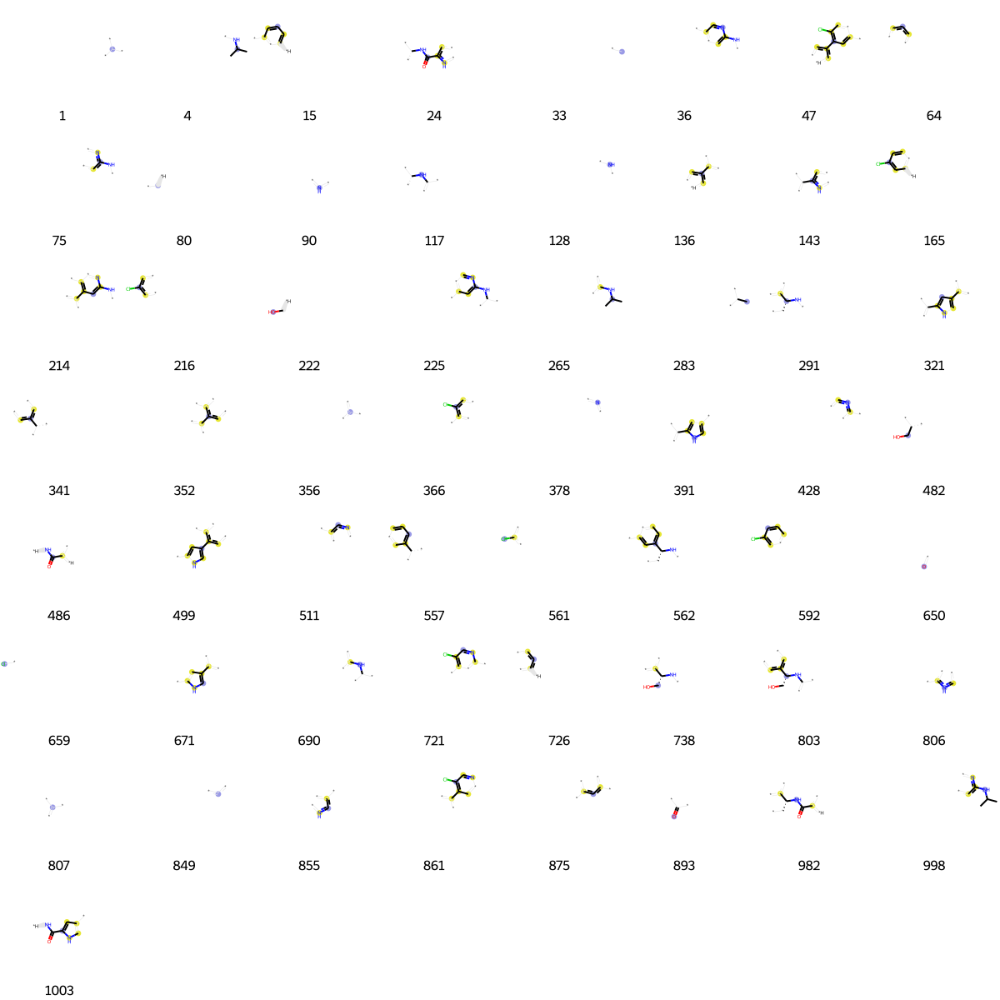

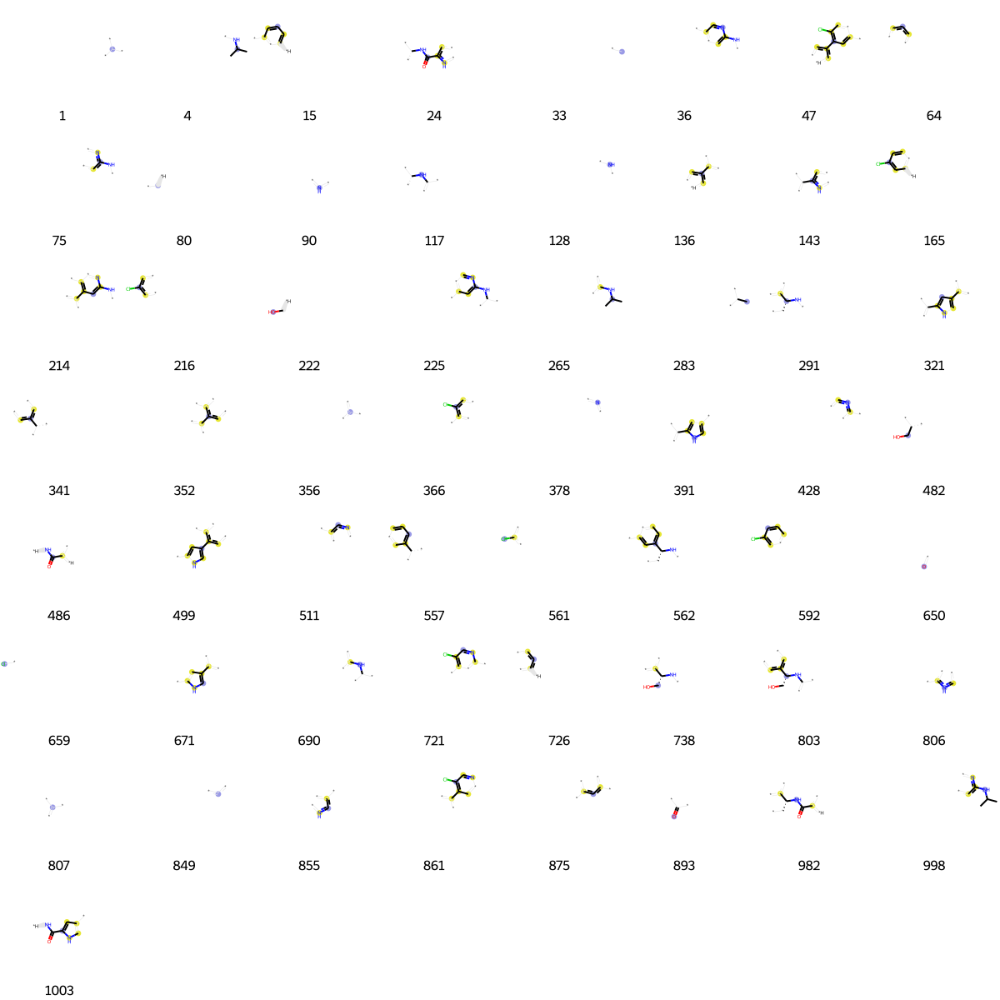

In [1625]:
prints = [(M17, x, bi) for x in fp17.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp17.GetOnBits ()])

In [1626]:
bi = {}

fp18= AllChem.GetMorganFingerprintAsBitVect(M18, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp18, fp_arr)
np.nonzero(fp_arr)
list(fp18.GetOnBits())

[3,
 33,
 80,
 94,
 118,
 140,
 221,
 249,
 310,
 333,
 356,
 378,
 406,
 428,
 429,
 512,
 624,
 695,
 697,
 722,
 726,
 730,
 787,
 810,
 831,
 836,
 841,
 842,
 849,
 873,
 875,
 910,
 944,
 946]

[3,
 33,
 80,
 94,
 118,
 140,
 221,
 249,
 310,
 333,
 356,
 378,
 406,
 428,
 429,
 512,
 624,
 695,
 697,
 722,
 726,
 730,
 787,
 810,
 831,
 836,
 841,
 842,
 849,
 873,
 875,
 910,
 944,
 946]

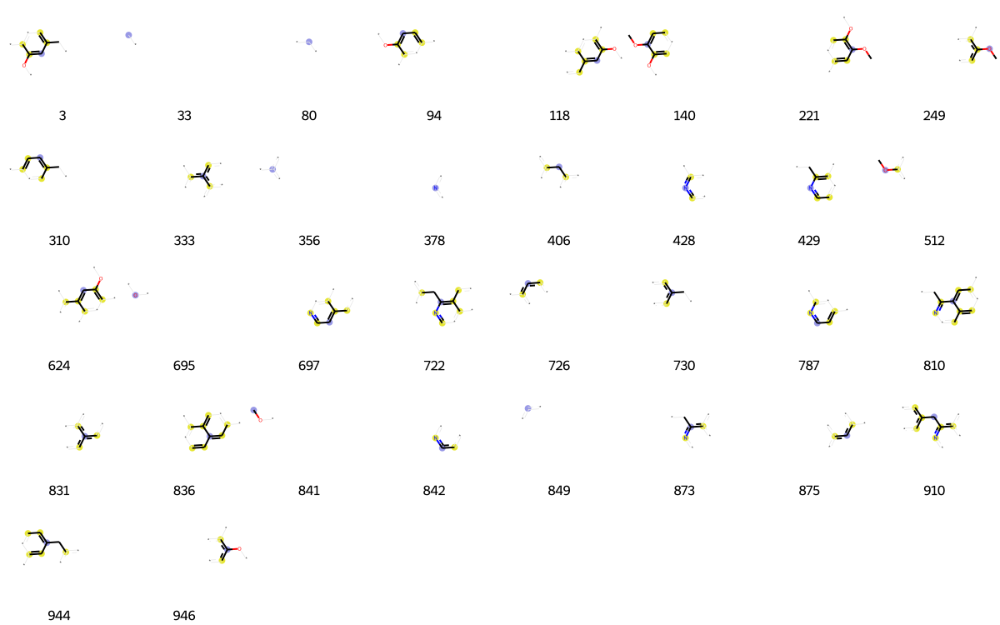

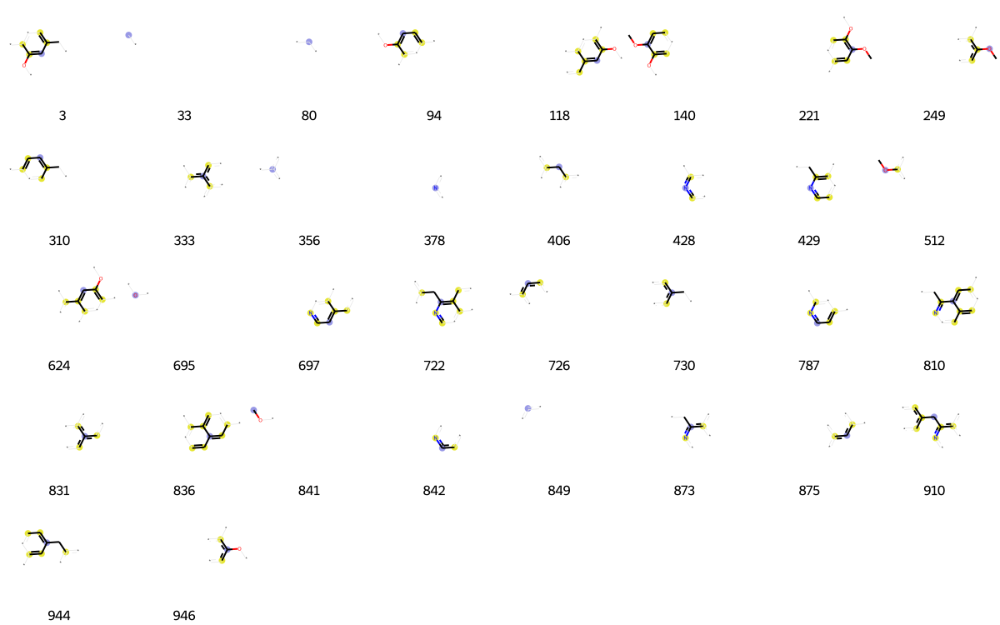

In [1627]:
prints = [(M18, x, bi) for x in fp18.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp18.GetOnBits ()])

In [1628]:
bi = {}

fp19= AllChem.GetMorganFingerprintAsBitVect(M19, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp19, fp_arr)
np.nonzero(fp_arr)
list(fp19.GetOnBits())

[15,
 33,
 42,
 45,
 64,
 80,
 121,
 168,
 175,
 207,
 215,
 242,
 261,
 333,
 335,
 350,
 356,
 361,
 389,
 392,
 398,
 407,
 452,
 456,
 475,
 544,
 549,
 592,
 614,
 623,
 626,
 650,
 654,
 659,
 714,
 726,
 730,
 741,
 802,
 807,
 836,
 838,
 849,
 880,
 922,
 926,
 935,
 992]

[15,
 33,
 42,
 45,
 64,
 80,
 121,
 168,
 175,
 207,
 215,
 242,
 261,
 333,
 335,
 350,
 356,
 361,
 389,
 392,
 398,
 407,
 452,
 456,
 475,
 544,
 549,
 592,
 614,
 623,
 626,
 650,
 654,
 659,
 714,
 726,
 730,
 741,
 802,
 807,
 836,
 838,
 849,
 880,
 922,
 926,
 935,
 992]

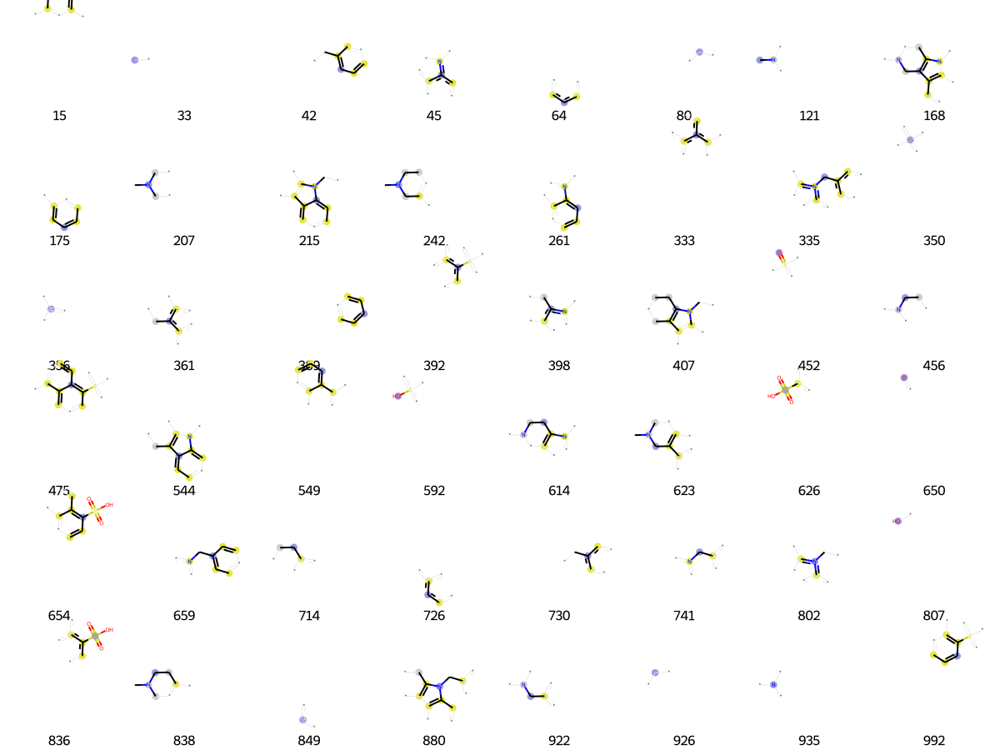

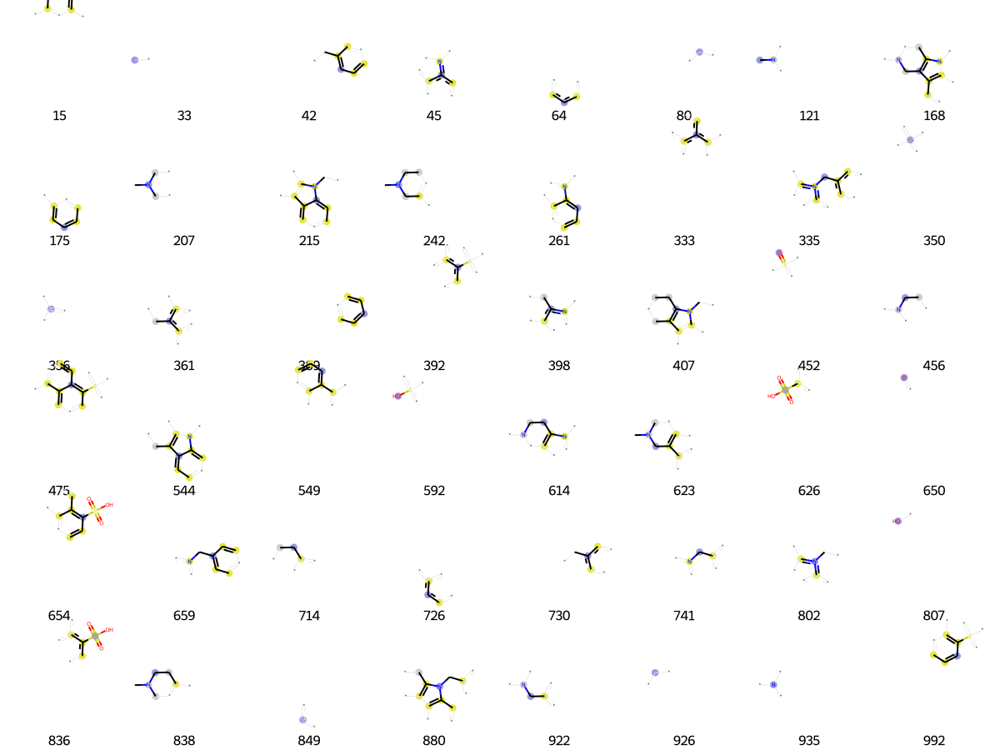

In [1629]:
prints = [(M19, x, bi) for x in fp19.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp19.GetOnBits ()])

In [1630]:
bi = {}

fp20= AllChem.GetMorganFingerprintAsBitVect(M20, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp20, fp_arr)
np.nonzero(fp_arr)
list(fp20.GetOnBits())

[19,
 32,
 40,
 42,
 64,
 80,
 94,
 107,
 128,
 136,
 148,
 175,
 191,
 202,
 356,
 378,
 389,
 428,
 437,
 486,
 500,
 511,
 515,
 539,
 552,
 562,
 579,
 650,
 695,
 699,
 703,
 726,
 730,
 738,
 745,
 785,
 787,
 792,
 807,
 817,
 842,
 847,
 849,
 860,
 875,
 893,
 896,
 904,
 946,
 954,
 967,
 1018]

[19,
 32,
 40,
 42,
 64,
 80,
 94,
 107,
 128,
 136,
 148,
 175,
 191,
 202,
 356,
 378,
 389,
 428,
 437,
 486,
 500,
 511,
 515,
 539,
 552,
 562,
 579,
 650,
 695,
 699,
 703,
 726,
 730,
 738,
 745,
 785,
 787,
 792,
 807,
 817,
 842,
 847,
 849,
 860,
 875,
 893,
 896,
 904,
 946,
 954,
 967,
 1018]

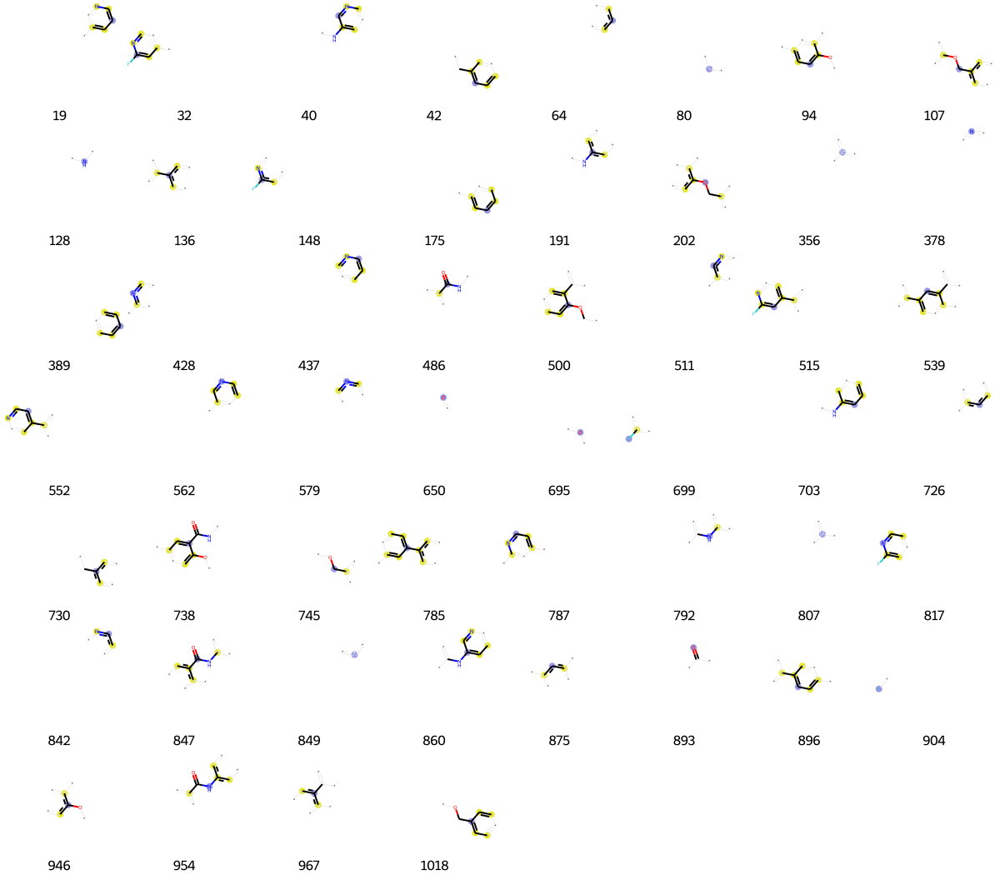

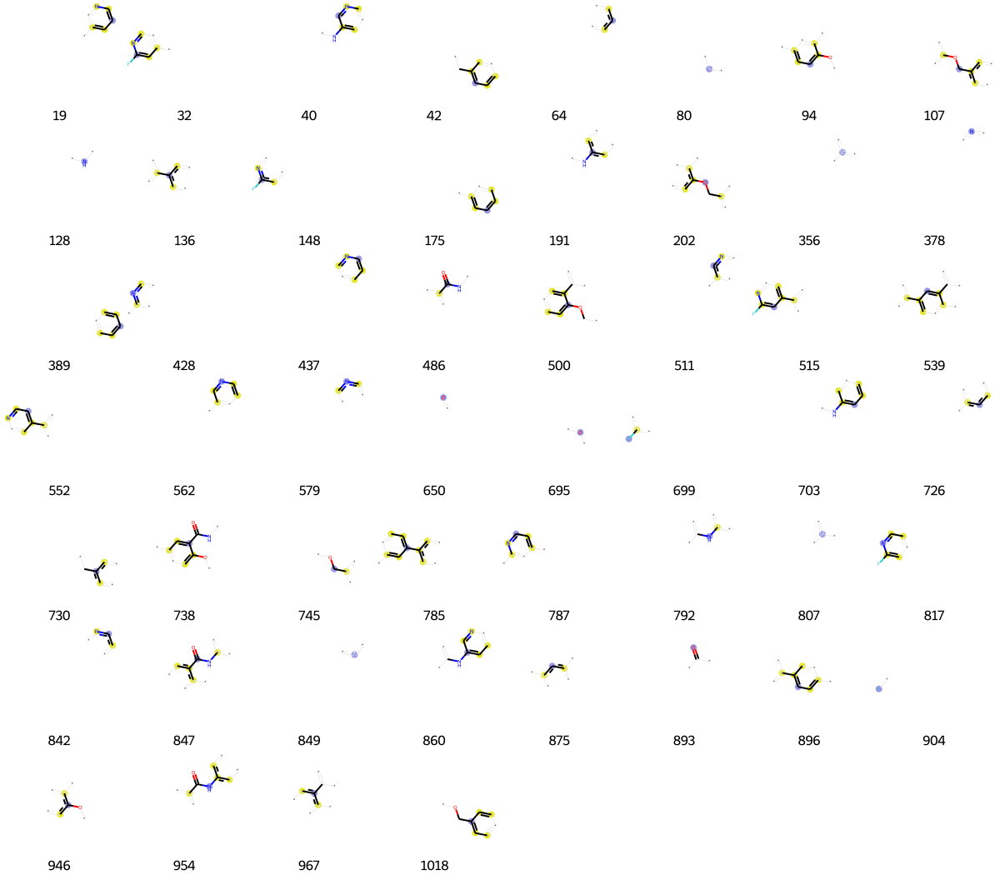

In [1631]:
prints = [(M20, x, bi) for x in fp20.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp20.GetOnBits ()])

In [1632]:
bi = {}

fp21= AllChem.GetMorganFingerprintAsBitVect(M21, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp21, fp_arr)
np.nonzero(fp_arr)
list(fp21.GetOnBits())

[4,
 33,
 52,
 64,
 80,
 90,
 104,
 119,
 121,
 150,
 160,
 175,
 201,
 219,
 245,
 291,
 301,
 310,
 319,
 325,
 328,
 333,
 343,
 350,
 356,
 364,
 376,
 389,
 446,
 452,
 456,
 458,
 481,
 486,
 515,
 528,
 562,
 575,
 650,
 726,
 728,
 730,
 756,
 777,
 806,
 849,
 855,
 875,
 913,
 915,
 926,
 935,
 978,
 1019]

[4,
 33,
 52,
 64,
 80,
 90,
 104,
 119,
 121,
 150,
 160,
 175,
 201,
 219,
 245,
 291,
 301,
 310,
 319,
 325,
 328,
 333,
 343,
 350,
 356,
 364,
 376,
 389,
 446,
 452,
 456,
 458,
 481,
 486,
 515,
 528,
 562,
 575,
 650,
 726,
 728,
 730,
 756,
 777,
 806,
 849,
 855,
 875,
 913,
 915,
 926,
 935,
 978,
 1019]

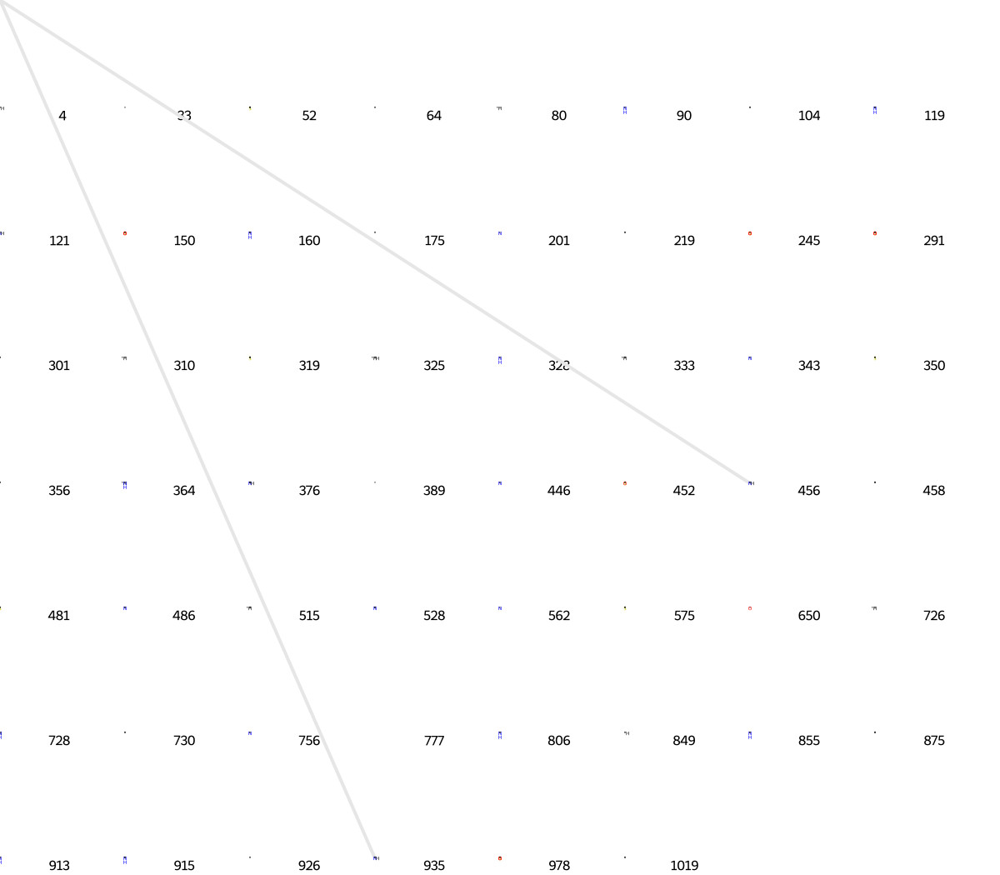

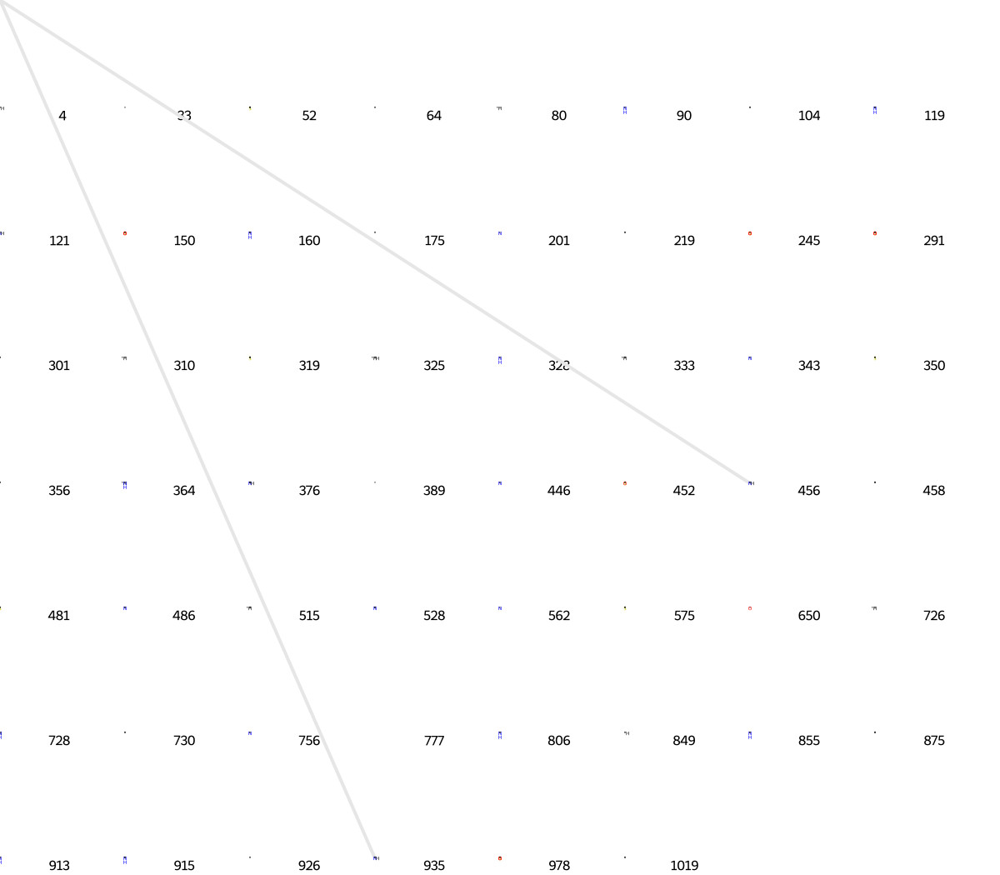

In [1633]:
prints = [(M21, x, bi) for x in fp21.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp21.GetOnBits ()])

In [1634]:
bi = {}

fp22= AllChem.GetMorganFingerprintAsBitVect(M22, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp22, fp_arr)
np.nonzero(fp_arr)
list(fp22.GetOnBits())

[15,
 41,
 42,
 64,
 74,
 80,
 128,
 166,
 175,
 201,
 202,
 209,
 225,
 277,
 288,
 318,
 325,
 342,
 356,
 389,
 441,
 456,
 573,
 578,
 616,
 621,
 623,
 650,
 659,
 694,
 725,
 726,
 730,
 741,
 747,
 767,
 784,
 807,
 843,
 849,
 852,
 864,
 893,
 896,
 906,
 924,
 926,
 935,
 940,
 961]

[15,
 41,
 42,
 64,
 74,
 80,
 128,
 166,
 175,
 201,
 202,
 209,
 225,
 277,
 288,
 318,
 325,
 342,
 356,
 389,
 441,
 456,
 573,
 578,
 616,
 621,
 623,
 650,
 659,
 694,
 725,
 726,
 730,
 741,
 747,
 767,
 784,
 807,
 843,
 849,
 852,
 864,
 893,
 896,
 906,
 924,
 926,
 935,
 940,
 961]

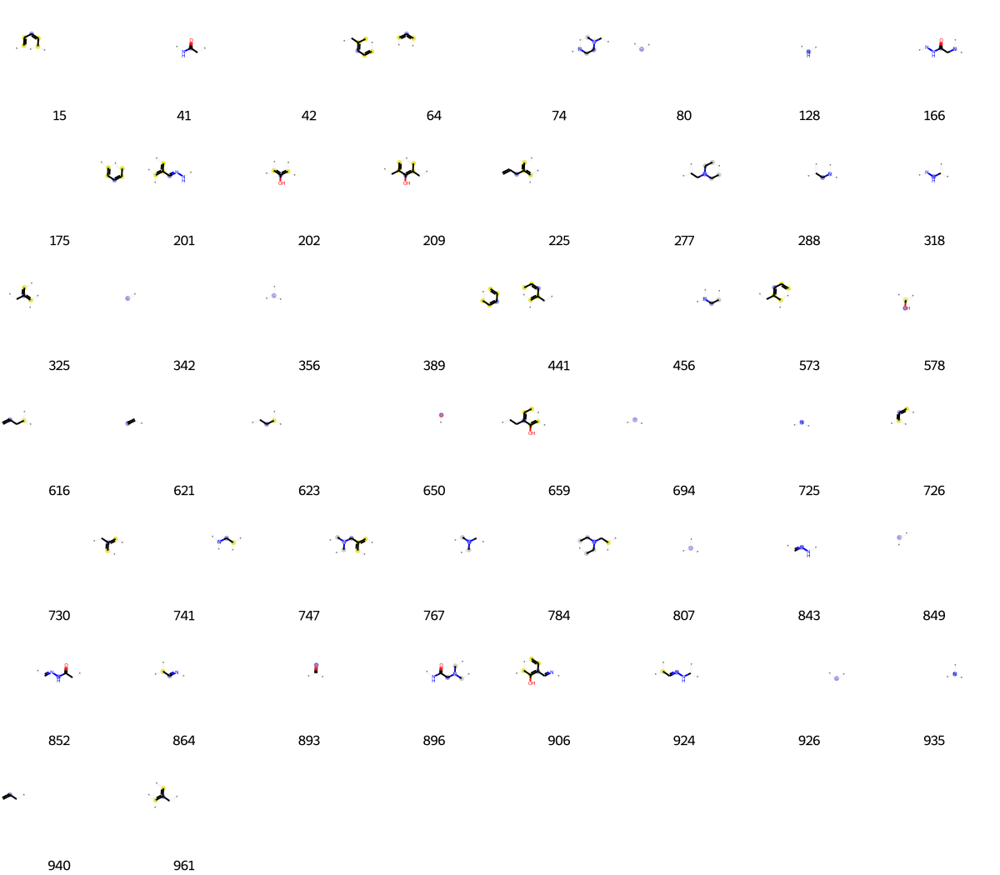

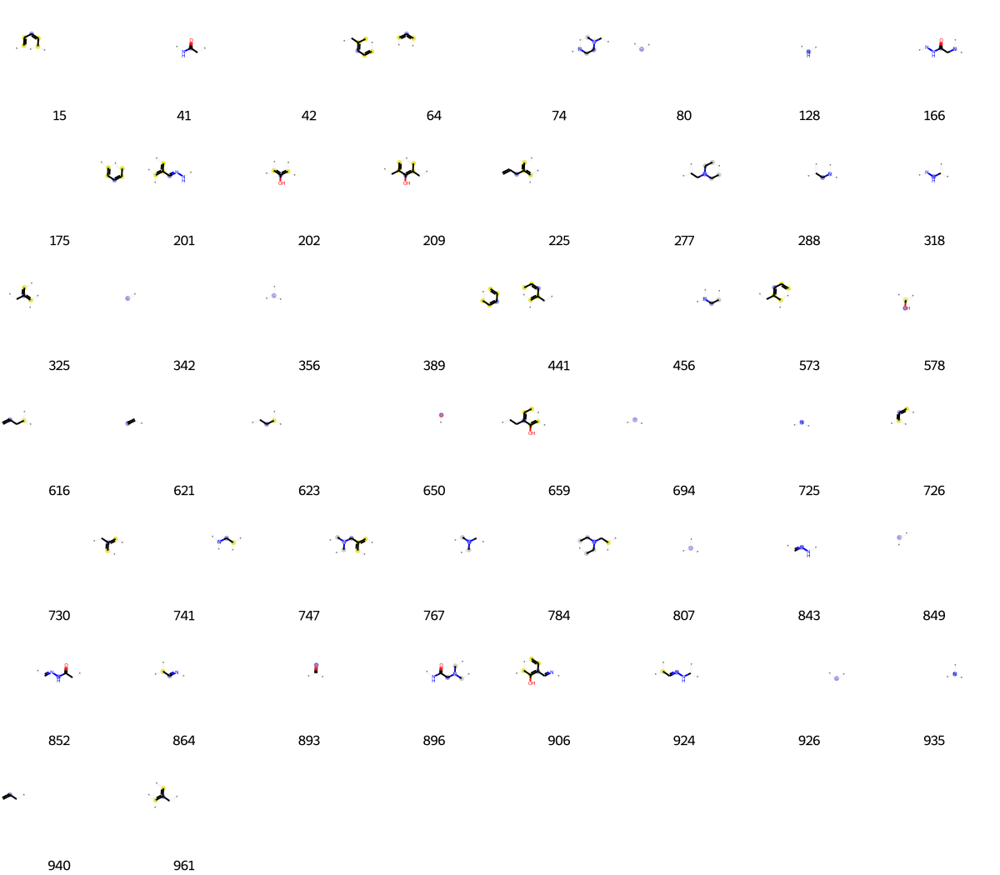

In [1635]:
prints = [(M22, x, bi) for x in fp22.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp22.GetOnBits ()])

In [1636]:
bi = {}

fp23= AllChem.GetMorganFingerprintAsBitVect(M23, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp23, fp_arr)
np.nonzero(fp_arr)
list(fp23.GetOnBits())

[9,
 46,
 171,
 216,
 231,
 250,
 271,
 356,
 361,
 381,
 406,
 407,
 417,
 456,
 523,
 561,
 650,
 656,
 659,
 673,
 705,
 715,
 726,
 751,
 753,
 785,
 790,
 807,
 816,
 838,
 849,
 875,
 891,
 893,
 916,
 926,
 935,
 939,
 950,
 964,
 967,
 1009,
 1014]

[9,
 46,
 171,
 216,
 231,
 250,
 271,
 356,
 361,
 381,
 406,
 407,
 417,
 456,
 523,
 561,
 650,
 656,
 659,
 673,
 705,
 715,
 726,
 751,
 753,
 785,
 790,
 807,
 816,
 838,
 849,
 875,
 891,
 893,
 916,
 926,
 935,
 939,
 950,
 964,
 967,
 1009,
 1014]

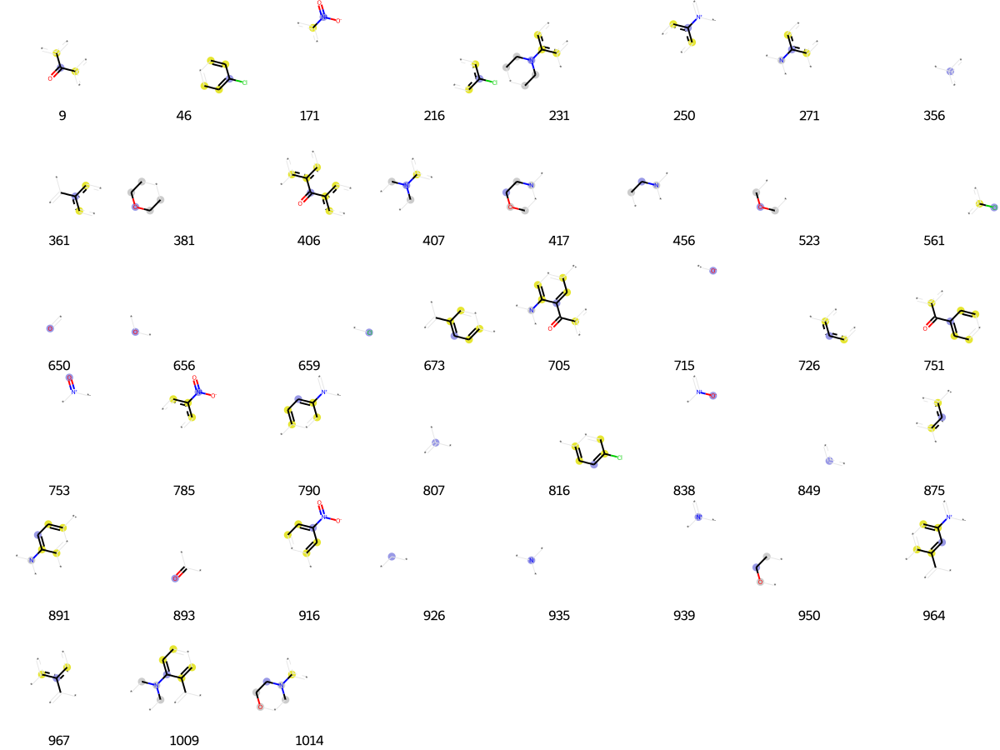

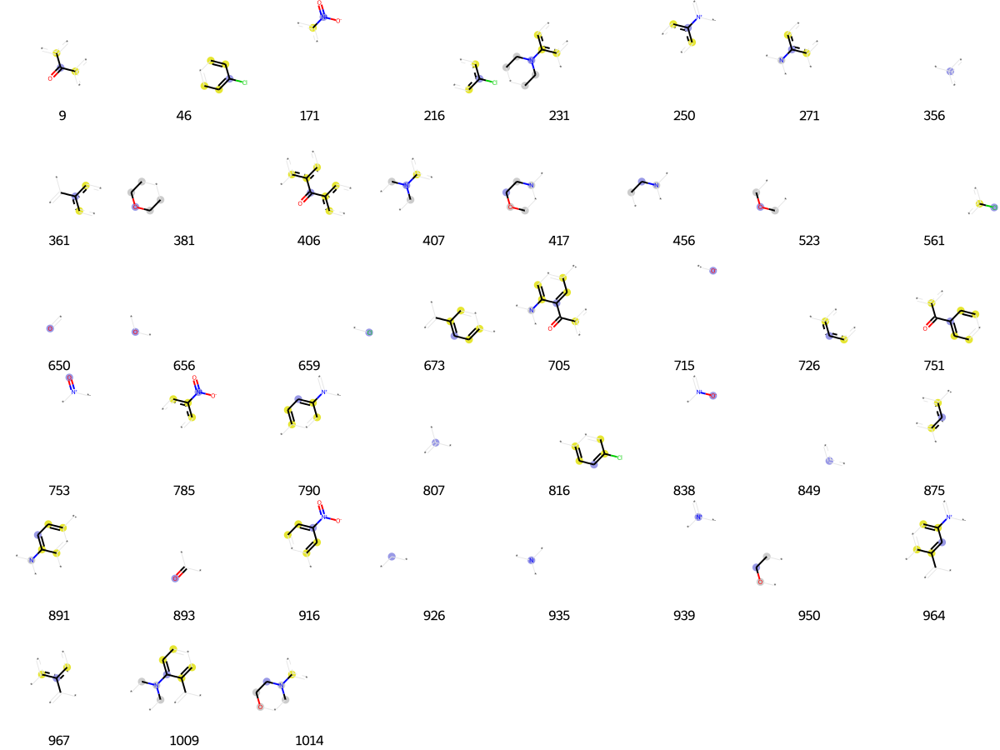

In [1637]:
prints = [(M23, x, bi) for x in fp23.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp23.GetOnBits ()])

In [1638]:
bi = {}

fp24= AllChem.GetMorganFingerprintAsBitVect(M24, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp24, fp_arr)
np.nonzero(fp_arr)
list(fp24.GetOnBits())

[1,
 7,
 33,
 69,
 80,
 119,
 243,
 283,
 294,
 362,
 375,
 417,
 420,
 540,
 585,
 591,
 650,
 695,
 794,
 807,
 887,
 893,
 954]

[1,
 7,
 33,
 69,
 80,
 119,
 243,
 283,
 294,
 362,
 375,
 417,
 420,
 540,
 585,
 591,
 650,
 695,
 794,
 807,
 887,
 893,
 954]

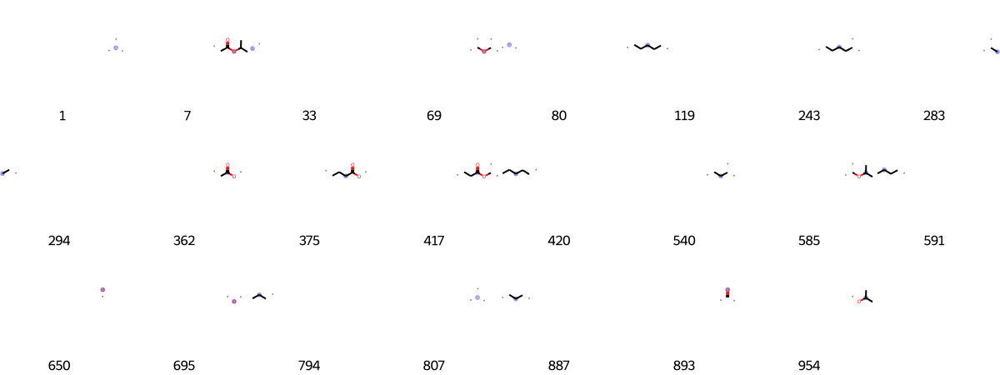

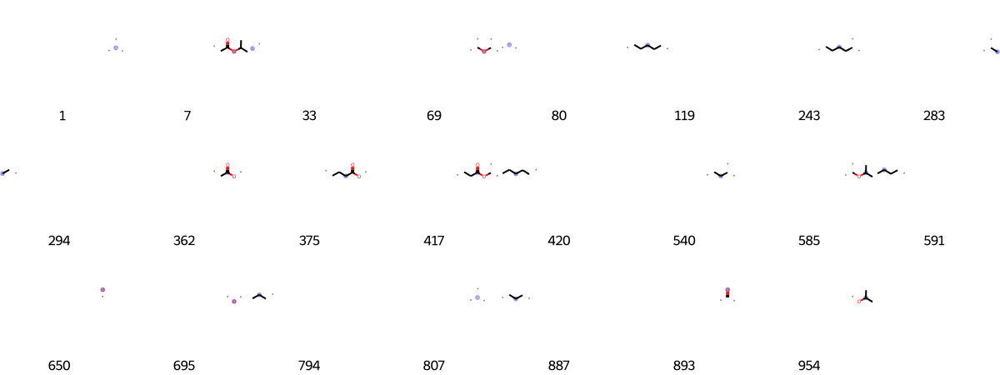

In [1639]:
prints = [(M24, x, bi) for x in fp24.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp24.GetOnBits ()])

In [1640]:
bi = {}

fp25= AllChem.GetMorganFingerprintAsBitVect(M25, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp25, fp_arr)
np.nonzero(fp_arr)
list(fp25.GetOnBits())

[8,
 15,
 25,
 36,
 63,
 64,
 80,
 90,
 121,
 128,
 138,
 175,
 197,
 203,
 230,
 256,
 265,
 314,
 322,
 351,
 356,
 361,
 417,
 427,
 456,
 458,
 462,
 463,
 486,
 513,
 526,
 586,
 598,
 646,
 650,
 652,
 667,
 673,
 690,
 699,
 711,
 713,
 714,
 726,
 767,
 797,
 801,
 807,
 814,
 831,
 842,
 849,
 875,
 893,
 904,
 926,
 935]

[8,
 15,
 25,
 36,
 63,
 64,
 80,
 90,
 121,
 128,
 138,
 175,
 197,
 203,
 230,
 256,
 265,
 314,
 322,
 351,
 356,
 361,
 417,
 427,
 456,
 458,
 462,
 463,
 486,
 513,
 526,
 586,
 598,
 646,
 650,
 652,
 667,
 673,
 690,
 699,
 711,
 713,
 714,
 726,
 767,
 797,
 801,
 807,
 814,
 831,
 842,
 849,
 875,
 893,
 904,
 926,
 935]

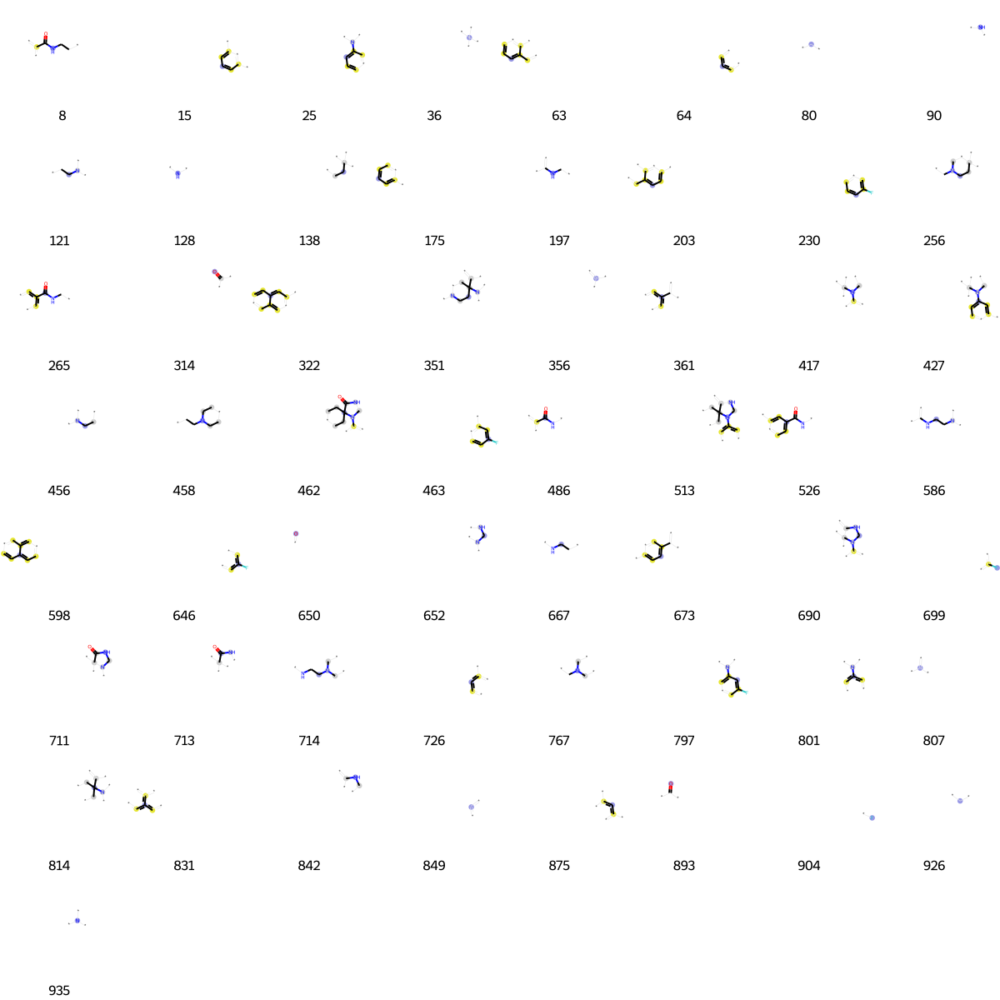

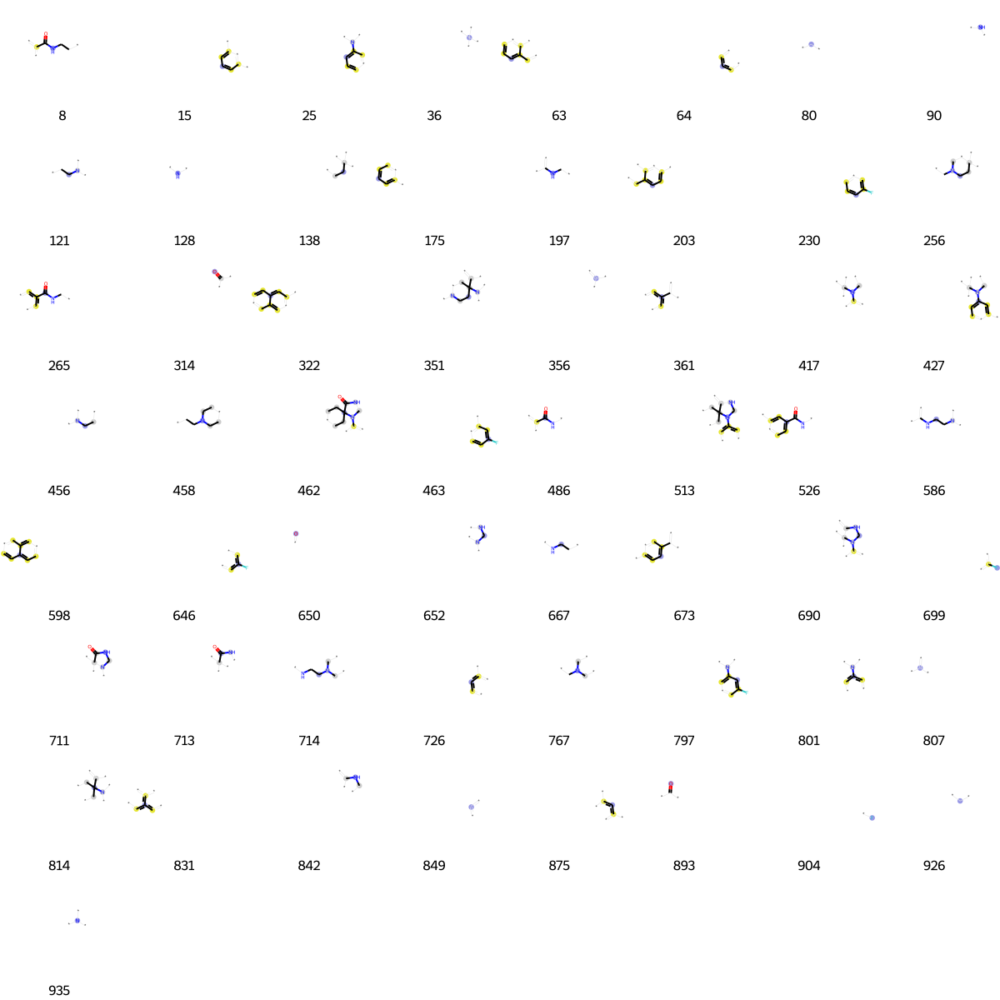

In [1641]:
prints = [(M25, x, bi) for x in fp25.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp25.GetOnBits ()])

In [1642]:
bi = {}

fp26= AllChem.GetMorganFingerprintAsBitVect(M26, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp26, fp_arr)
np.nonzero(fp_arr)
list(fp26.GetOnBits())

[33,
 34,
 45,
 61,
 64,
 75,
 80,
 121,
 128,
 175,
 191,
 211,
 215,
 261,
 282,
 294,
 324,
 329,
 333,
 350,
 356,
 378,
 380,
 381,
 392,
 417,
 428,
 456,
 458,
 491,
 523,
 549,
 558,
 609,
 619,
 653,
 656,
 667,
 717,
 726,
 767,
 787,
 795,
 802,
 825,
 831,
 842,
 843,
 849,
 850,
 875,
 887,
 922,
 926,
 935,
 948,
 950,
 997]

[33,
 34,
 45,
 61,
 64,
 75,
 80,
 121,
 128,
 175,
 191,
 211,
 215,
 261,
 282,
 294,
 324,
 329,
 333,
 350,
 356,
 378,
 380,
 381,
 392,
 417,
 428,
 456,
 458,
 491,
 523,
 549,
 558,
 609,
 619,
 653,
 656,
 667,
 717,
 726,
 767,
 787,
 795,
 802,
 825,
 831,
 842,
 843,
 849,
 850,
 875,
 887,
 922,
 926,
 935,
 948,
 950,
 997]

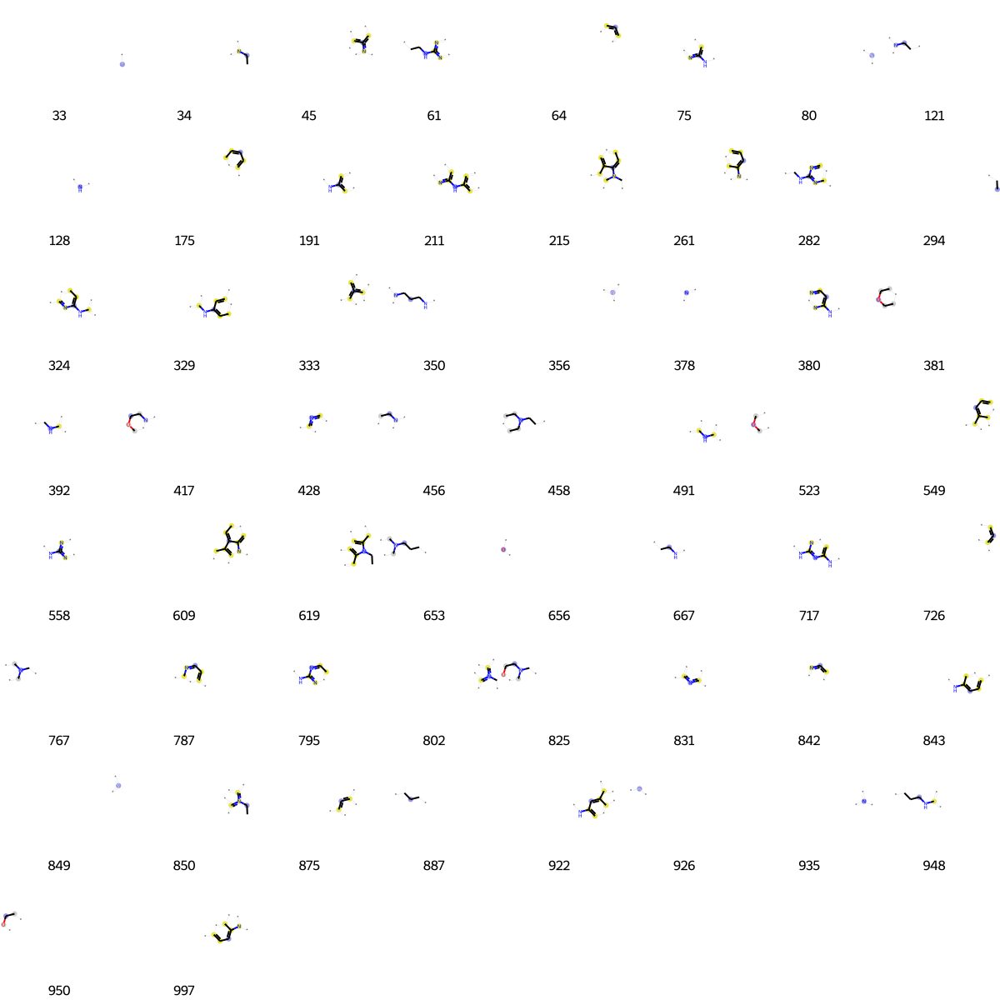

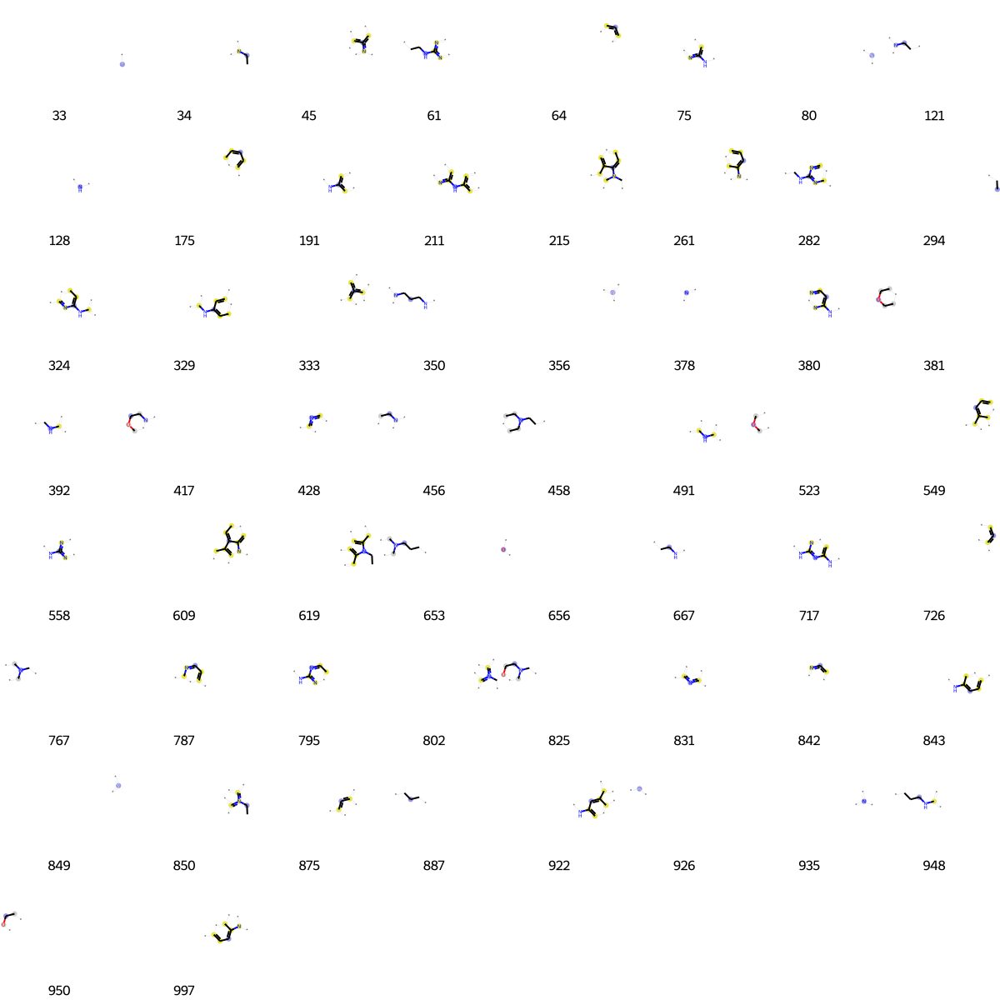

In [1643]:
prints = [(M26, x, bi) for x in fp26.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp26.GetOnBits ()])

In [1644]:
bi = {}

fp27= AllChem.GetMorganFingerprintAsBitVect(M27, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp27, fp_arr)
np.nonzero(fp_arr)
list(fp27.GetOnBits())

[1,
 13,
 21,
 42,
 64,
 74,
 80,
 90,
 121,
 175,
 219,
 302,
 316,
 341,
 356,
 386,
 389,
 430,
 456,
 458,
 514,
 533,
 646,
 653,
 695,
 699,
 726,
 730,
 741,
 767,
 819,
 829,
 849,
 887,
 904,
 908,
 926,
 935,
 978]

[1,
 13,
 21,
 42,
 64,
 74,
 80,
 90,
 121,
 175,
 219,
 302,
 316,
 341,
 356,
 386,
 389,
 430,
 456,
 458,
 514,
 533,
 646,
 653,
 695,
 699,
 726,
 730,
 741,
 767,
 819,
 829,
 849,
 887,
 904,
 908,
 926,
 935,
 978]

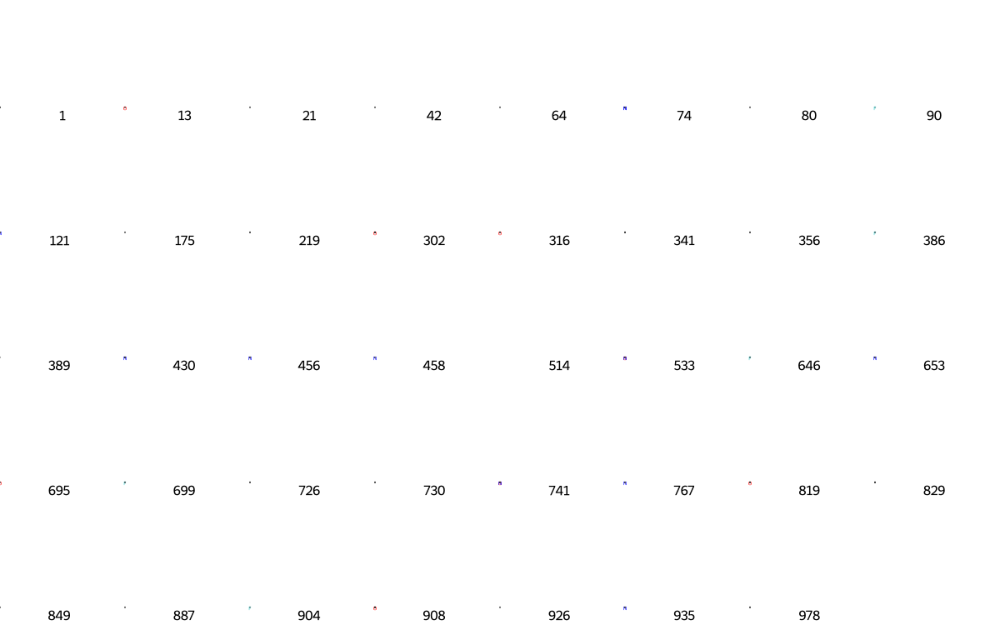

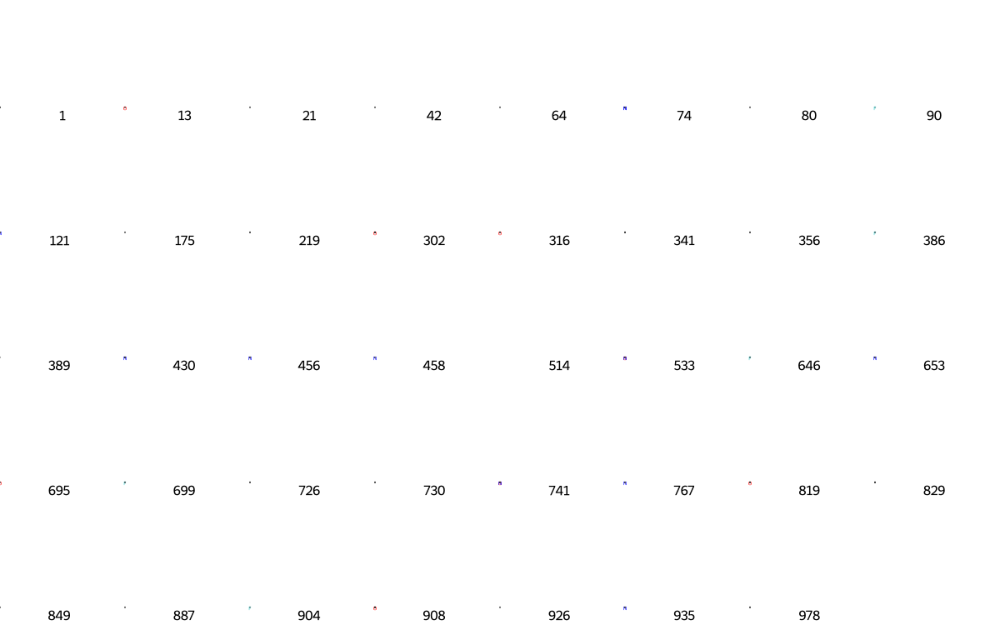

In [1645]:
prints = [(M27, x, bi) for x in fp27.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp27.GetOnBits ()])

In [1646]:
bi = {}

fp28= AllChem.GetMorganFingerprintAsBitVect(M28, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp28, fp_arr)
np.nonzero(fp_arr)
list(fp28.GetOnBits())

[81,
 90,
 91,
 143,
 275,
 282,
 314,
 356,
 389,
 440,
 456,
 607,
 650,
 718,
 721,
 768,
 807,
 849,
 875,
 893,
 980]

[81,
 90,
 91,
 143,
 275,
 282,
 314,
 356,
 389,
 440,
 456,
 607,
 650,
 718,
 721,
 768,
 807,
 849,
 875,
 893,
 980]

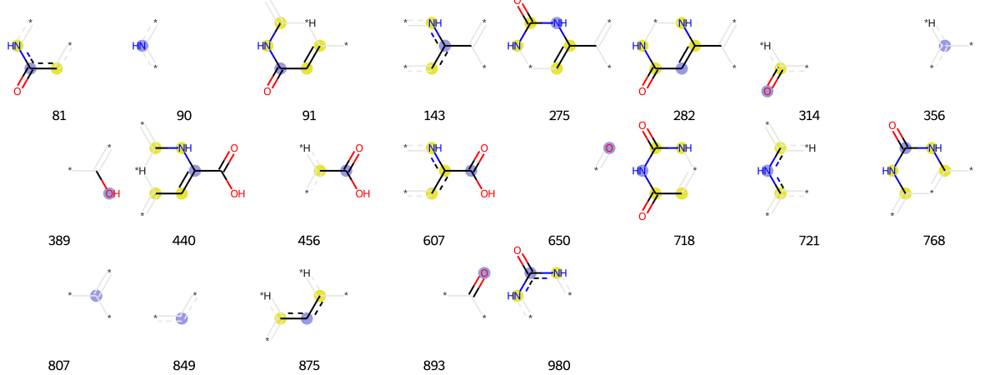

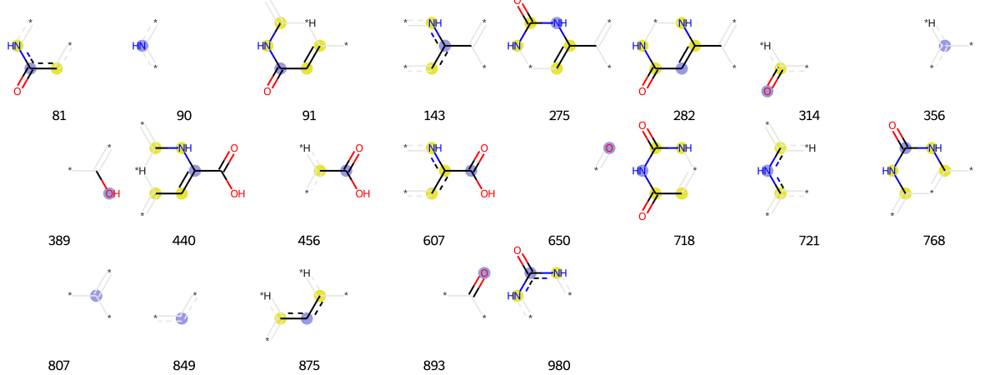

In [1647]:
prints = [(M28, x, bi) for x in fp28.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp28.GetOnBits ()])

In [1648]:
bi = {}

fp29= AllChem.GetMorganFingerprintAsBitVect(M29, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp29, fp_arr)
np.nonzero(fp_arr)
list(fp29.GetOnBits())

[33, 80, 97, 105, 110, 116, 280, 294, 295, 407, 433, 807, 881, 932, 978, 1008]

[33, 80, 97, 105, 110, 116, 280, 294, 295, 407, 433, 807, 881, 932, 978, 1008]

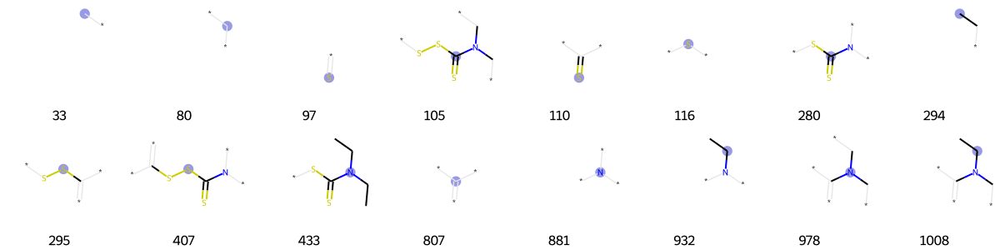

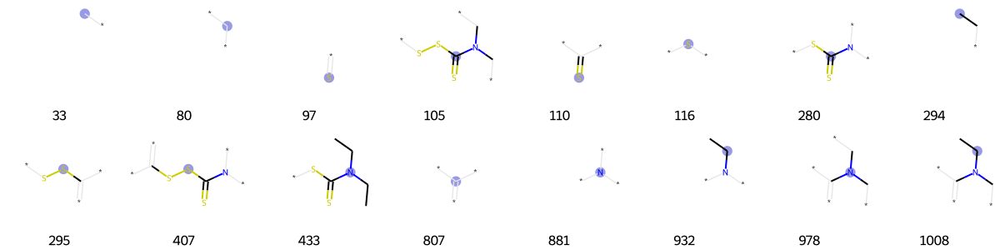

In [1649]:
prints = [(M29, x, bi) for x in fp29.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp29.GetOnBits ()])

In [1650]:
bi = {}

fp30= AllChem.GetMorganFingerprintAsBitVect(M30, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp30, fp_arr)
np.nonzero(fp_arr)
list(fp30.GetOnBits())

[1,
 5,
 18,
 33,
 36,
 64,
 70,
 80,
 114,
 125,
 126,
 128,
 130,
 147,
 175,
 181,
 225,
 233,
 250,
 251,
 255,
 270,
 274,
 314,
 336,
 341,
 356,
 372,
 387,
 389,
 392,
 534,
 557,
 573,
 585,
 607,
 611,
 650,
 673,
 675,
 684,
 695,
 709,
 726,
 753,
 773,
 786,
 807,
 849,
 893,
 913,
 919,
 923,
 932,
 935,
 964,
 1019]

[1,
 5,
 18,
 33,
 36,
 64,
 70,
 80,
 114,
 125,
 126,
 128,
 130,
 147,
 175,
 181,
 225,
 233,
 250,
 251,
 255,
 270,
 274,
 314,
 336,
 341,
 356,
 372,
 387,
 389,
 392,
 534,
 557,
 573,
 585,
 607,
 611,
 650,
 673,
 675,
 684,
 695,
 709,
 726,
 753,
 773,
 786,
 807,
 849,
 893,
 913,
 919,
 923,
 932,
 935,
 964,
 1019]

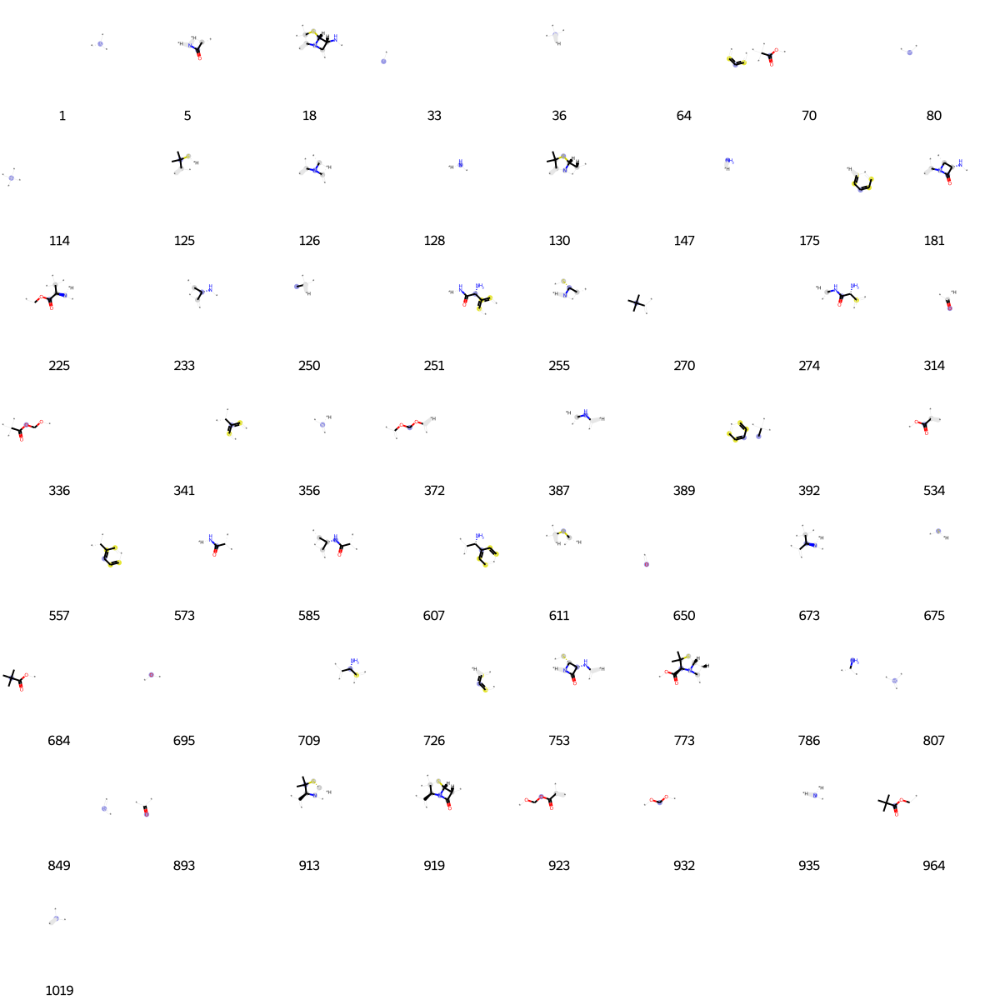

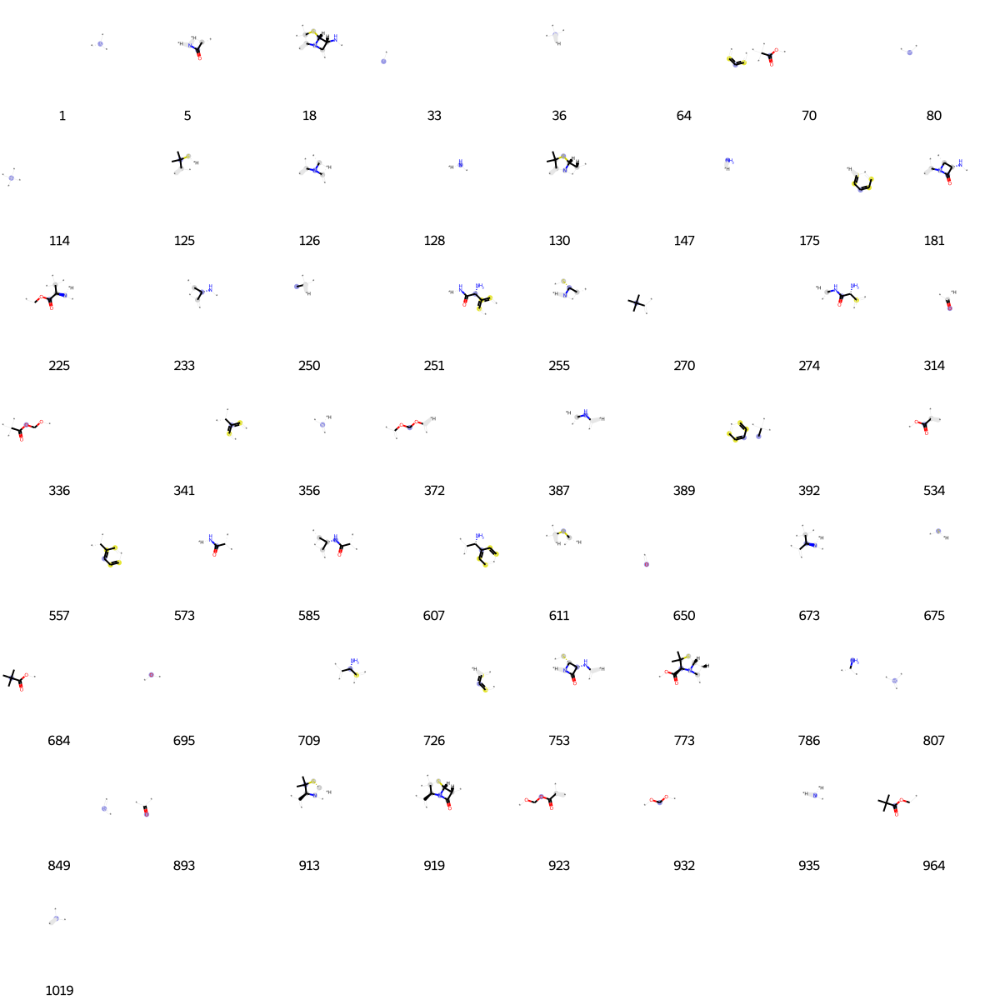

In [1651]:
prints = [(M30, x, bi) for x in fp30.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp30.GetOnBits ()])

In [1652]:
bi = {}

fp31= AllChem.GetMorganFingerprintAsBitVect(M31, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp31, fp_arr)
np.nonzero(fp_arr)
list(fp31.GetOnBits())

[1,
 21,
 78,
 80,
 90,
 95,
 117,
 128,
 147,
 189,
 202,
 219,
 310,
 314,
 325,
 334,
 356,
 361,
 364,
 373,
 378,
 411,
 414,
 433,
 457,
 486,
 499,
 508,
 540,
 641,
 643,
 650,
 673,
 697,
 715,
 721,
 726,
 730,
 735,
 736,
 739,
 750,
 766,
 785,
 794,
 806,
 807,
 831,
 849,
 855,
 856,
 893,
 935,
 953,
 960,
 973,
 1000]

[1,
 21,
 78,
 80,
 90,
 95,
 117,
 128,
 147,
 189,
 202,
 219,
 310,
 314,
 325,
 334,
 356,
 361,
 364,
 373,
 378,
 411,
 414,
 433,
 457,
 486,
 499,
 508,
 540,
 641,
 643,
 650,
 673,
 697,
 715,
 721,
 726,
 730,
 735,
 736,
 739,
 750,
 766,
 785,
 794,
 806,
 807,
 831,
 849,
 855,
 856,
 893,
 935,
 953,
 960,
 973,
 1000]

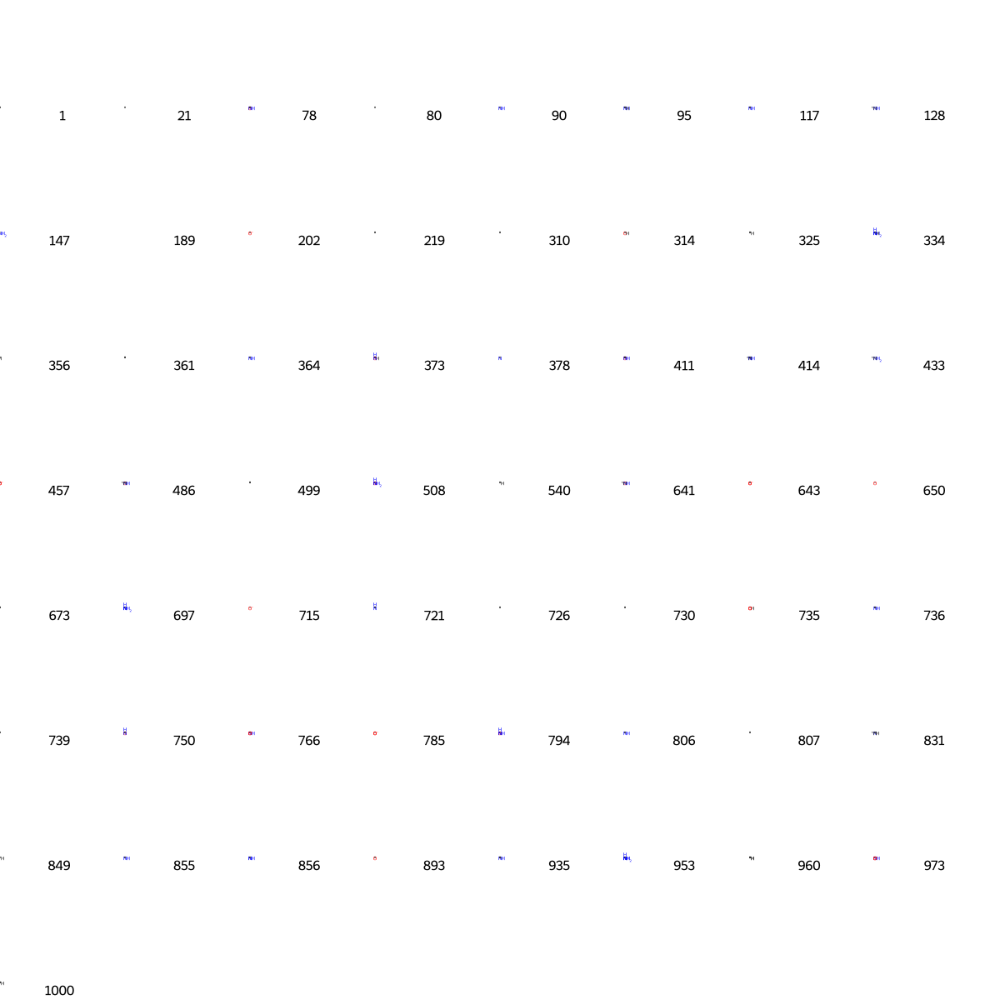

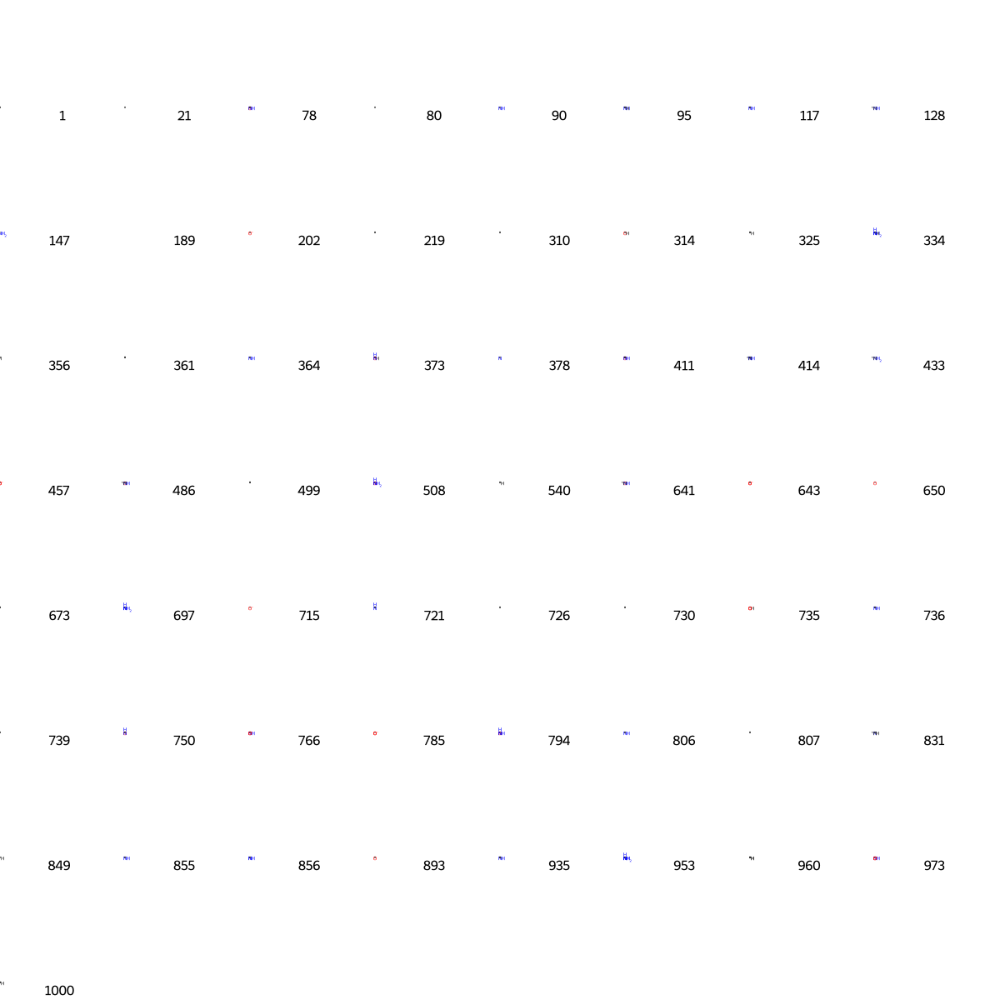

In [1653]:
prints = [(M31, x, bi) for x in fp31.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp31.GetOnBits ()])

In [1654]:
bi = {}

fp32= AllChem.GetMorganFingerprintAsBitVect(M32, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp32, fp_arr)
np.nonzero(fp_arr)
list(fp32.GetOnBits())

[1,
 8,
 13,
 17,
 26,
 33,
 35,
 36,
 80,
 91,
 125,
 134,
 138,
 233,
 243,
 250,
 268,
 283,
 294,
 301,
 350,
 397,
 430,
 452,
 453,
 458,
 463,
 490,
 497,
 500,
 519,
 529,
 531,
 562,
 584,
 590,
 592,
 620,
 624,
 650,
 669,
 695,
 739,
 753,
 775,
 784,
 807,
 854,
 913,
 926,
 927,
 1015,
 1019]

[1,
 8,
 13,
 17,
 26,
 33,
 35,
 36,
 80,
 91,
 125,
 134,
 138,
 233,
 243,
 250,
 268,
 283,
 294,
 301,
 350,
 397,
 430,
 452,
 453,
 458,
 463,
 490,
 497,
 500,
 519,
 529,
 531,
 562,
 584,
 590,
 592,
 620,
 624,
 650,
 669,
 695,
 739,
 753,
 775,
 784,
 807,
 854,
 913,
 926,
 927,
 1015,
 1019]

In [1655]:
bi = {}

fp33= AllChem.GetMorganFingerprintAsBitVect(M33, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp33, fp_arr)
np.nonzero(fp_arr)
list(fp33.GetOnBits())

[1,
 4,
 33,
 42,
 64,
 80,
 106,
 139,
 175,
 214,
 325,
 341,
 356,
 389,
 398,
 456,
 464,
 465,
 470,
 491,
 512,
 557,
 560,
 650,
 651,
 726,
 730,
 767,
 807,
 849,
 871,
 881,
 893,
 898,
 913,
 926,
 935,
 974]

[1,
 4,
 33,
 42,
 64,
 80,
 106,
 139,
 175,
 214,
 325,
 341,
 356,
 389,
 398,
 456,
 464,
 465,
 470,
 491,
 512,
 557,
 560,
 650,
 651,
 726,
 730,
 767,
 807,
 849,
 871,
 881,
 893,
 898,
 913,
 926,
 935,
 974]

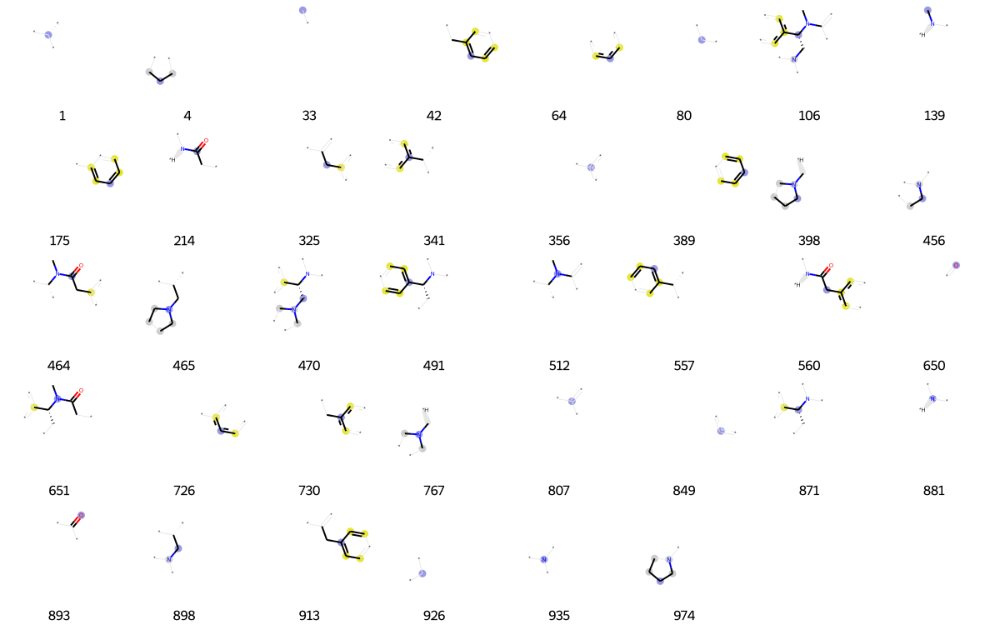

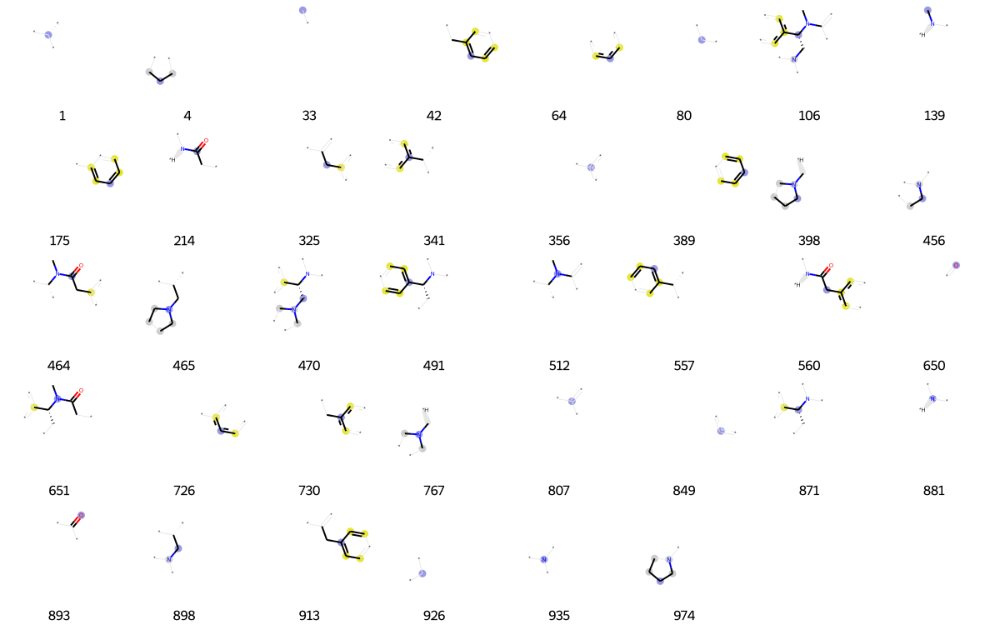

In [1656]:
prints = [(M33, x, bi) for x in fp33.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp33.GetOnBits ()])

In [1657]:
bi = {}

fp34= AllChem.GetMorganFingerprintAsBitVect(M34, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp34, fp_arr)
np.nonzero(fp_arr)
list(fp34.GetOnBits())

[15,
 64,
 65,
 90,
 128,
 136,
 147,
 198,
 300,
 311,
 320,
 322,
 333,
 346,
 356,
 378,
 381,
 392,
 401,
 428,
 433,
 449,
 489,
 496,
 562,
 578,
 593,
 647,
 667,
 695,
 721,
 726,
 736,
 744,
 745,
 786,
 807,
 821,
 849,
 875,
 888,
 898,
 912,
 987]

[15,
 64,
 65,
 90,
 128,
 136,
 147,
 198,
 300,
 311,
 320,
 322,
 333,
 346,
 356,
 378,
 381,
 392,
 401,
 428,
 433,
 449,
 489,
 496,
 562,
 578,
 593,
 647,
 667,
 695,
 721,
 726,
 736,
 744,
 745,
 786,
 807,
 821,
 849,
 875,
 888,
 898,
 912,
 987]

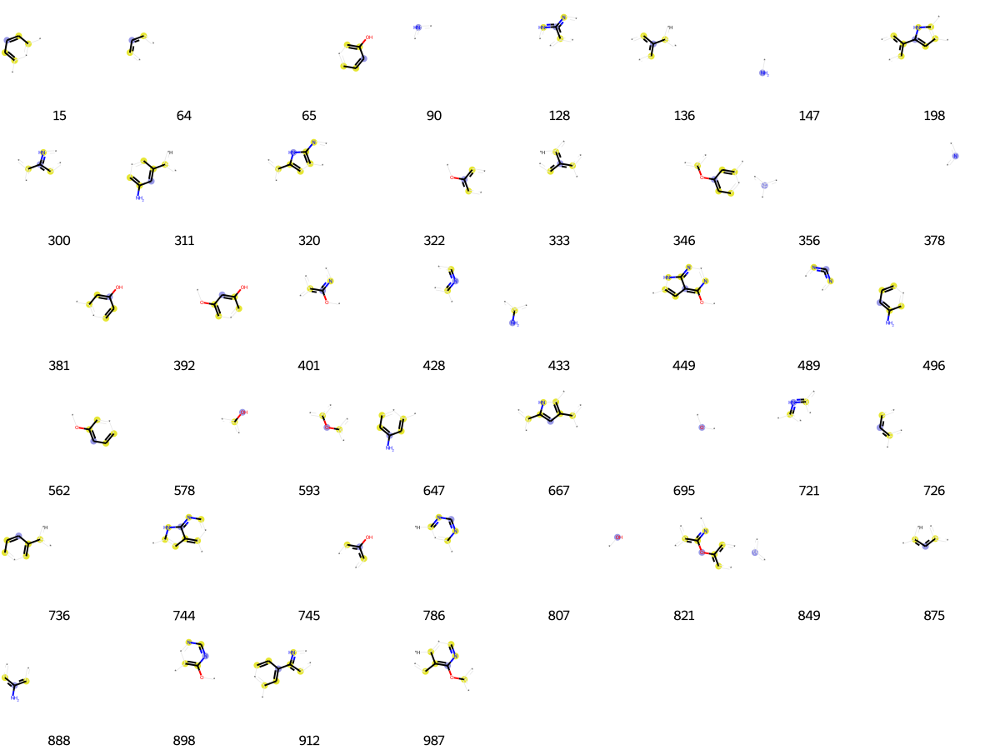

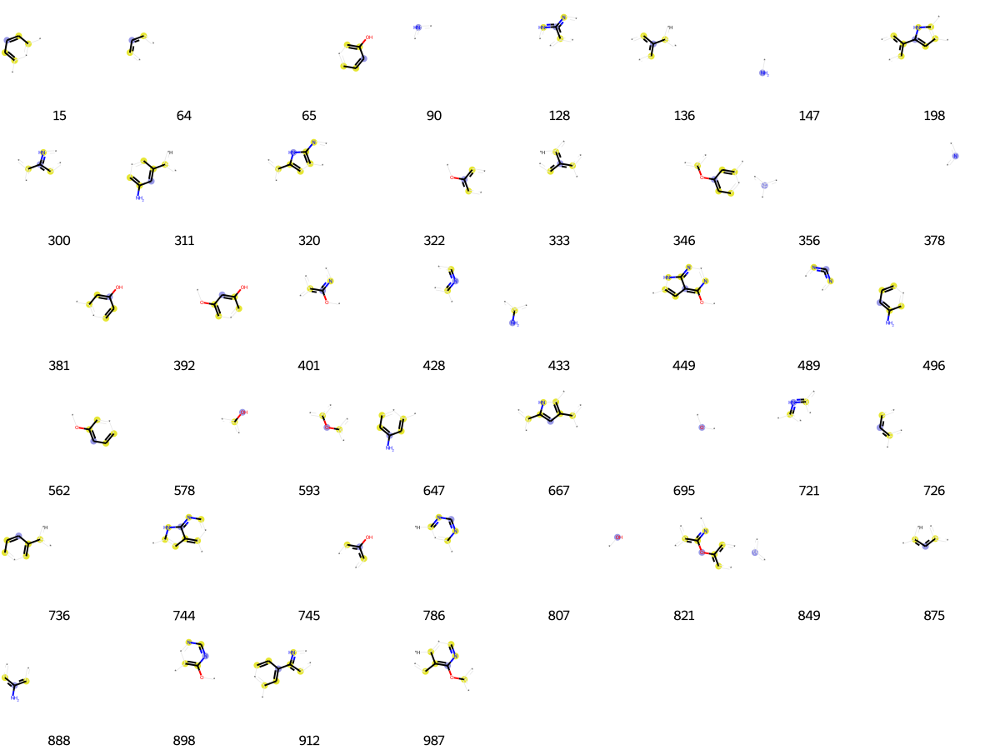

In [1658]:
prints = [(M34, x, bi) for x in fp34.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp34.GetOnBits ()])

In [1659]:
bi = {}

fp35= AllChem.GetMorganFingerprintAsBitVect(M35, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp35, fp_arr)
np.nonzero(fp_arr)
list(fp35.GetOnBits())

[33,
 80,
 90,
 116,
 124,
 128,
 134,
 136,
 137,
 144,
 158,
 186,
 254,
 345,
 356,
 360,
 378,
 406,
 428,
 447,
 512,
 541,
 599,
 674,
 692,
 698,
 702,
 713,
 720,
 725,
 762,
 767,
 786,
 790,
 802,
 806,
 807,
 815,
 834,
 849,
 873,
 949,
 953]

[33,
 80,
 90,
 116,
 124,
 128,
 134,
 136,
 137,
 144,
 158,
 186,
 254,
 345,
 356,
 360,
 378,
 406,
 428,
 447,
 512,
 541,
 599,
 674,
 692,
 698,
 702,
 713,
 720,
 725,
 762,
 767,
 786,
 790,
 802,
 806,
 807,
 815,
 834,
 849,
 873,
 949,
 953]

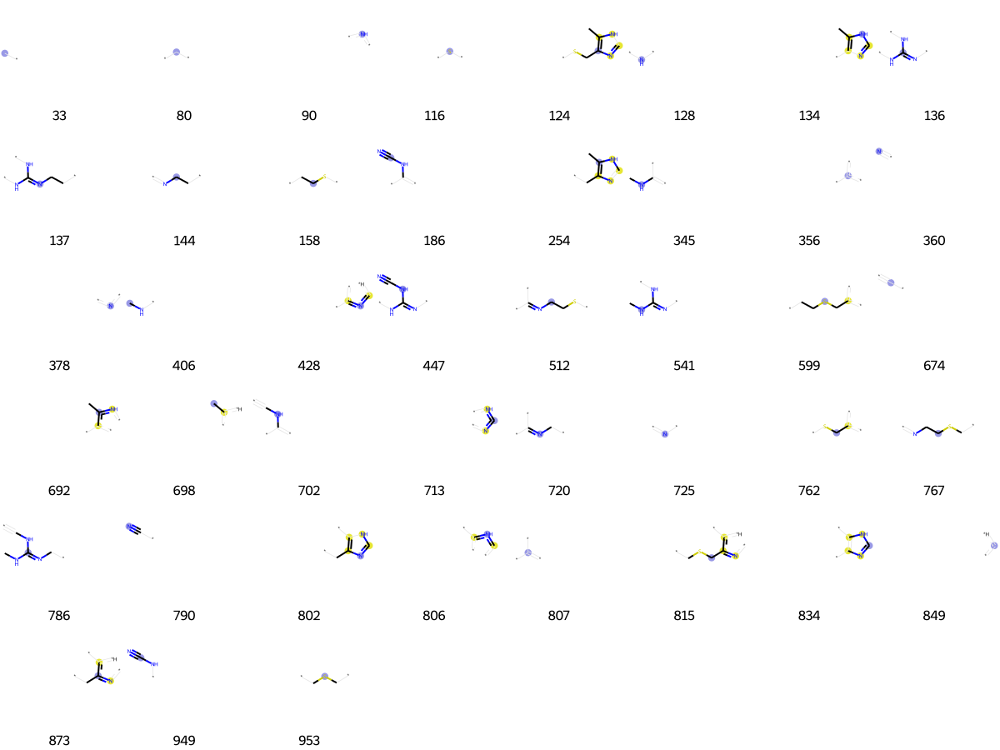

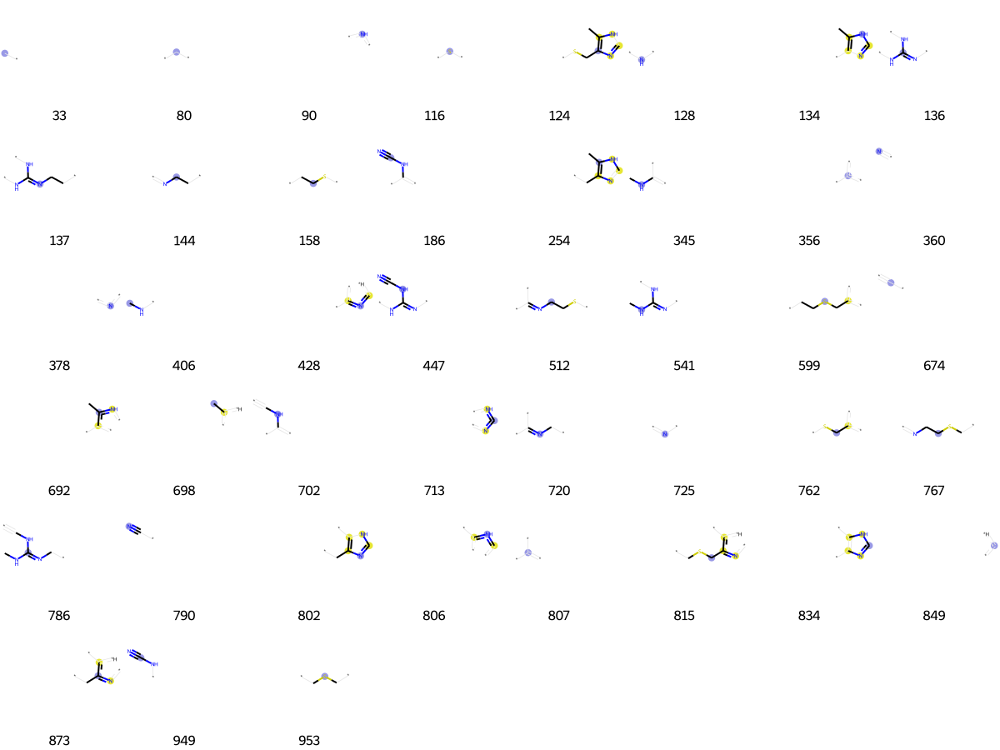

In [1660]:
prints = [(M35, x, bi) for x in fp35.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp35.GetOnBits ()])

In [1661]:
bi = {}

fp36= AllChem.GetMorganFingerprintAsBitVect(M36, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp36, fp_arr)
np.nonzero(fp_arr)
list(fp36.GetOnBits())

[5,
 36,
 41,
 64,
 83,
 90,
 175,
 305,
 356,
 360,
 389,
 422,
 443,
 556,
 561,
 588,
 726,
 772,
 839,
 842,
 849,
 926,
 940,
 996]

[5,
 36,
 41,
 64,
 83,
 90,
 175,
 305,
 356,
 360,
 389,
 422,
 443,
 556,
 561,
 588,
 726,
 772,
 839,
 842,
 849,
 926,
 940,
 996]

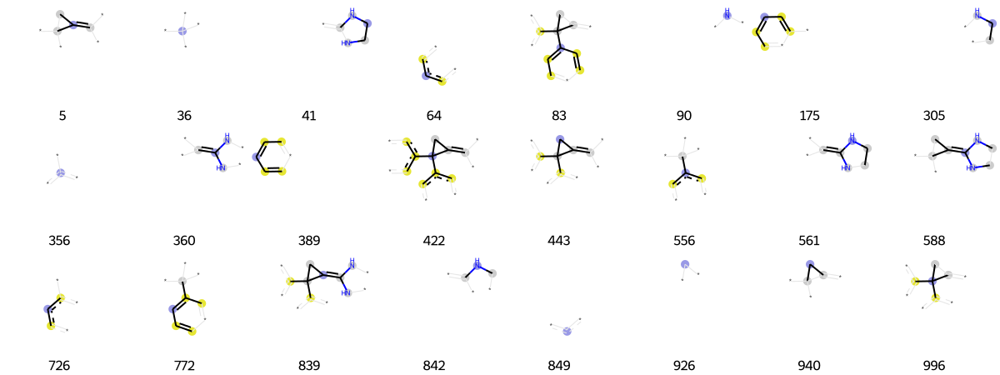

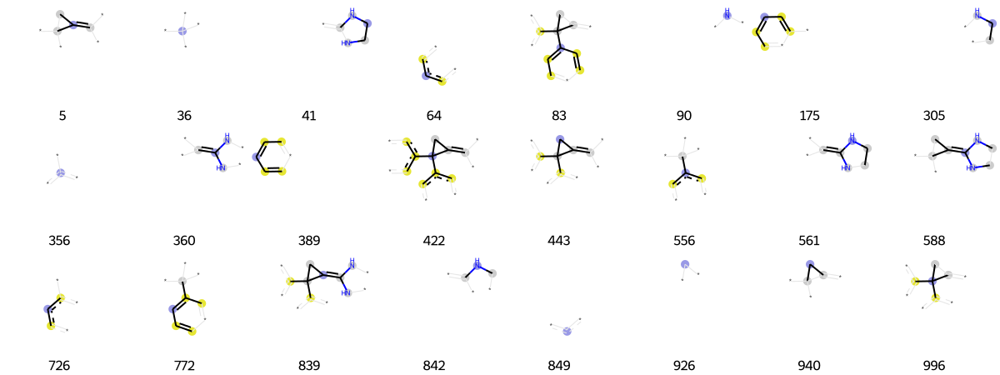

In [1662]:
prints = [(M36, x, bi) for x in fp36.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp36.GetOnBits ()])

In [1663]:
bi = {}

fp37= AllChem.GetMorganFingerprintAsBitVect(M37, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp37, fp_arr)
np.nonzero(fp_arr)
list(fp37.GetOnBits())

[64,
 73,
 83,
 90,
 107,
 119,
 127,
 155,
 175,
 275,
 289,
 314,
 333,
 342,
 356,
 361,
 378,
 382,
 385,
 389,
 456,
 472,
 504,
 549,
 650,
 698,
 707,
 714,
 721,
 726,
 759,
 831,
 849,
 926,
 935,
 943,
 978]

[64,
 73,
 83,
 90,
 107,
 119,
 127,
 155,
 175,
 275,
 289,
 314,
 333,
 342,
 356,
 361,
 378,
 382,
 385,
 389,
 456,
 472,
 504,
 549,
 650,
 698,
 707,
 714,
 721,
 726,
 759,
 831,
 849,
 926,
 935,
 943,
 978]

In [1664]:
bi = {}

fp38= AllChem.GetMorganFingerprintAsBitVect(M38, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp38, fp_arr)
np.nonzero(fp_arr)
list(fp38.GetOnBits())

[9,
 15,
 64,
 80,
 133,
 147,
 161,
 189,
 202,
 275,
 277,
 284,
 325,
 356,
 361,
 406,
 423,
 433,
 573,
 607,
 625,
 650,
 673,
 715,
 726,
 728,
 751,
 767,
 785,
 807,
 849,
 857,
 893,
 909,
 967]

[9,
 15,
 64,
 80,
 133,
 147,
 161,
 189,
 202,
 275,
 277,
 284,
 325,
 356,
 361,
 406,
 423,
 433,
 573,
 607,
 625,
 650,
 673,
 715,
 726,
 728,
 751,
 767,
 785,
 807,
 849,
 857,
 893,
 909,
 967]

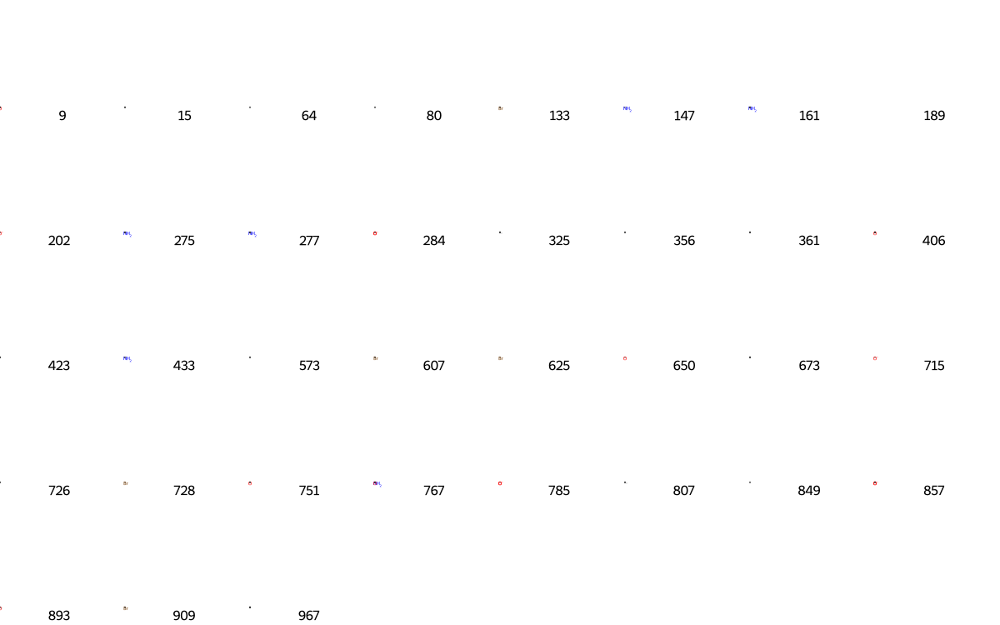

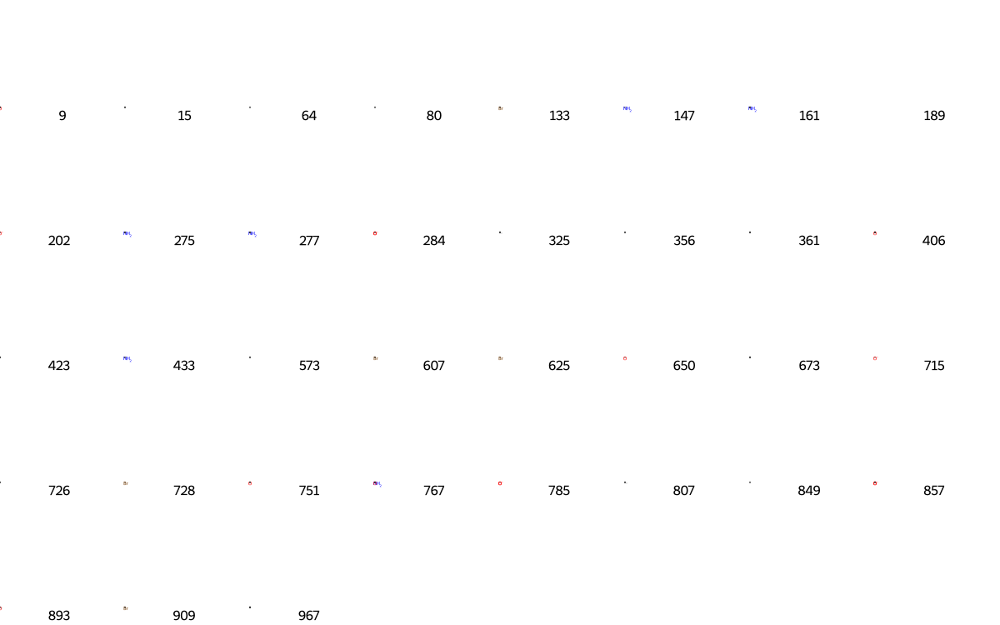

In [1665]:
prints = [(M38, x, bi) for x in fp38.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp38.GetOnBits ()])

In [1666]:
bi = {}

fp39= AllChem.GetMorganFingerprintAsBitVect(M39, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp39, fp_arr)
np.nonzero(fp_arr)
list(fp3.GetOnBits())

[36,
 57,
 64,
 90,
 113,
 129,
 130,
 147,
 160,
 175,
 176,
 276,
 314,
 342,
 350,
 352,
 356,
 366,
 392,
 436,
 452,
 484,
 556,
 561,
 583,
 633,
 650,
 659,
 666,
 691,
 726,
 807,
 833,
 849,
 861,
 875,
 884,
 889,
 956,
 984,
 987]

[36,
 57,
 64,
 90,
 113,
 129,
 130,
 147,
 160,
 175,
 176,
 276,
 314,
 342,
 350,
 352,
 356,
 366,
 392,
 436,
 452,
 484,
 556,
 561,
 583,
 633,
 650,
 659,
 666,
 691,
 726,
 807,
 833,
 849,
 861,
 875,
 884,
 889,
 956,
 984,
 987]

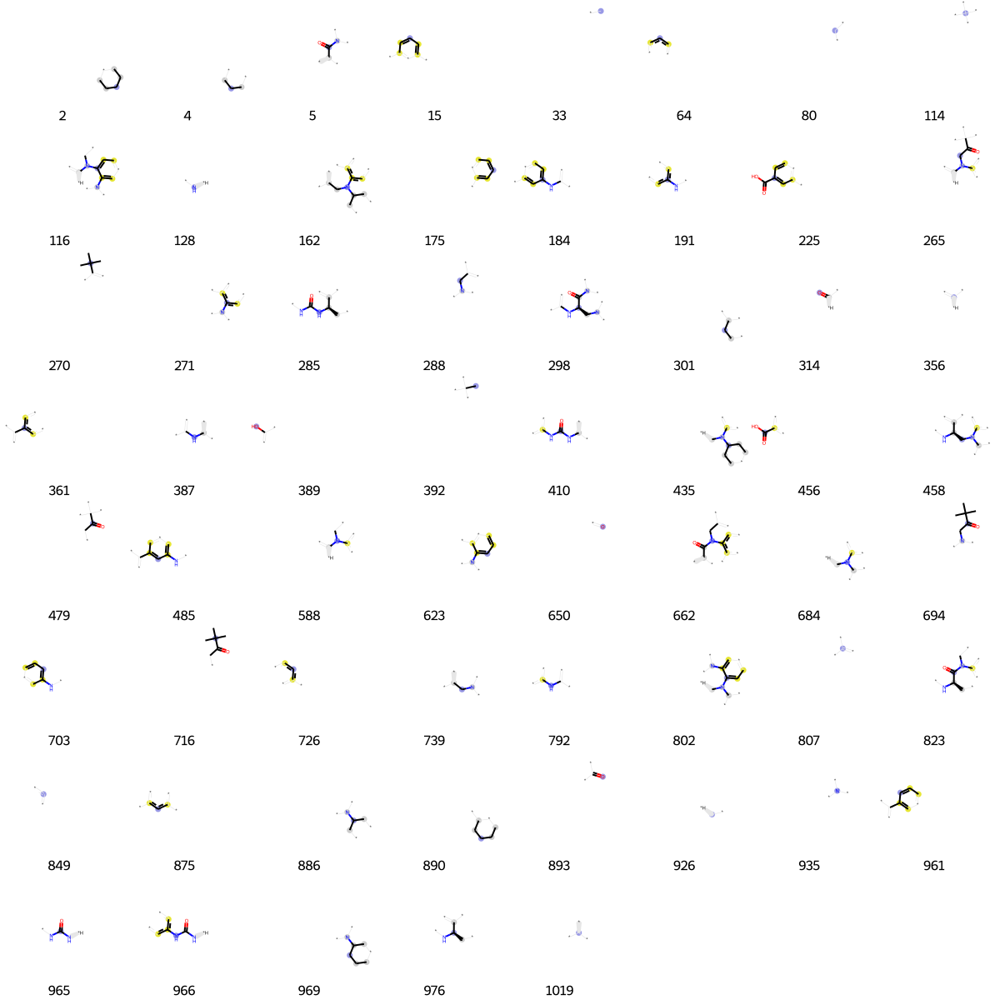

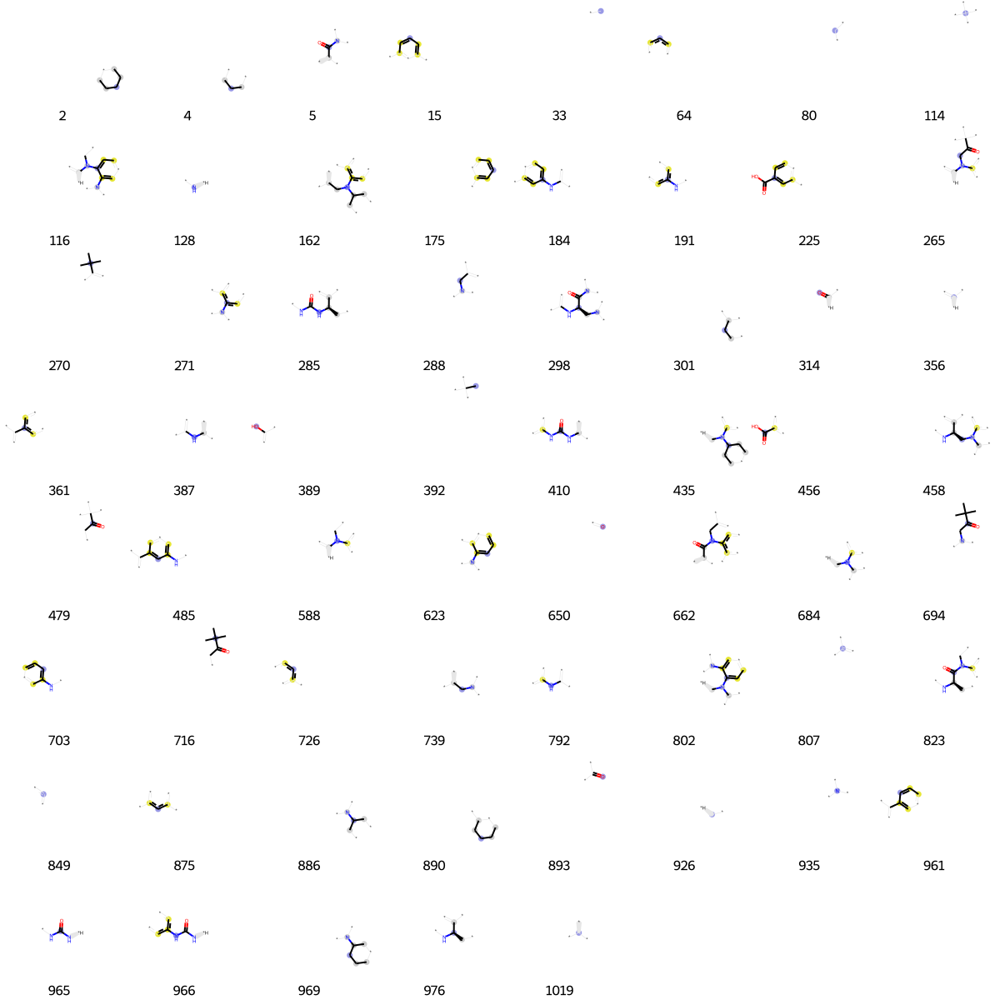

In [1667]:
prints = [(M39, x, bi) for x in fp39.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp39.GetOnBits ()])

In [1668]:
bi = {}

fp40= AllChem.GetMorganFingerprintAsBitVect(M40, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp40, fp_arr)
np.nonzero(fp_arr)
list(fp40.GetOnBits())

[33,
 36,
 39,
 41,
 43,
 59,
 80,
 102,
 109,
 114,
 119,
 125,
 139,
 145,
 171,
 205,
 233,
 248,
 250,
 258,
 301,
 317,
 322,
 335,
 337,
 356,
 378,
 381,
 385,
 407,
 428,
 429,
 456,
 464,
 494,
 503,
 524,
 548,
 602,
 650,
 656,
 687,
 695,
 701,
 715,
 718,
 726,
 753,
 801,
 831,
 838,
 849,
 862,
 866,
 880,
 888,
 896,
 904,
 926,
 935,
 939,
 959,
 961,
 964,
 1019]

[33,
 36,
 39,
 41,
 43,
 59,
 80,
 102,
 109,
 114,
 119,
 125,
 139,
 145,
 171,
 205,
 233,
 248,
 250,
 258,
 301,
 317,
 322,
 335,
 337,
 356,
 378,
 381,
 385,
 407,
 428,
 429,
 456,
 464,
 494,
 503,
 524,
 548,
 602,
 650,
 656,
 687,
 695,
 701,
 715,
 718,
 726,
 753,
 801,
 831,
 838,
 849,
 862,
 866,
 880,
 888,
 896,
 904,
 926,
 935,
 939,
 959,
 961,
 964,
 1019]

In [1669]:
bi = {}

fp41= AllChem.GetMorganFingerprintAsBitVect(M41, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp41, fp_arr)
np.nonzero(fp_arr)
list(fp41.GetOnBits())

[4,
 15,
 31,
 64,
 128,
 157,
 175,
 191,
 198,
 233,
 246,
 284,
 319,
 327,
 329,
 350,
 356,
 389,
 452,
 464,
 502,
 575,
 607,
 650,
 661,
 694,
 703,
 726,
 743,
 807,
 835,
 849,
 875,
 878,
 893,
 918,
 1009,
 1017]

[4,
 15,
 31,
 64,
 128,
 157,
 175,
 191,
 198,
 233,
 246,
 284,
 319,
 327,
 329,
 350,
 356,
 389,
 452,
 464,
 502,
 575,
 607,
 650,
 661,
 694,
 703,
 726,
 743,
 807,
 835,
 849,
 875,
 878,
 893,
 918,
 1009,
 1017]

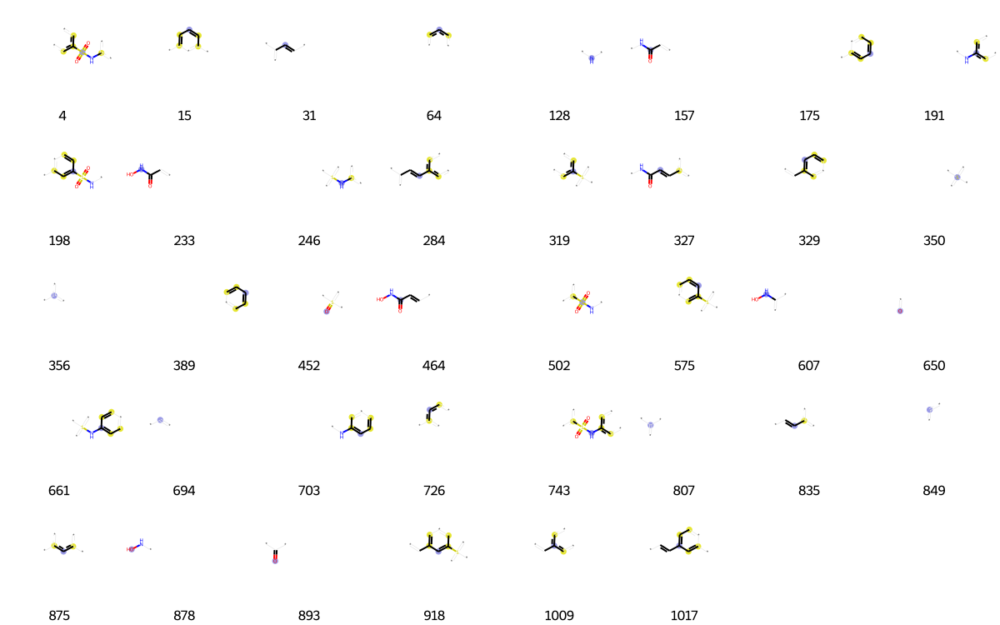

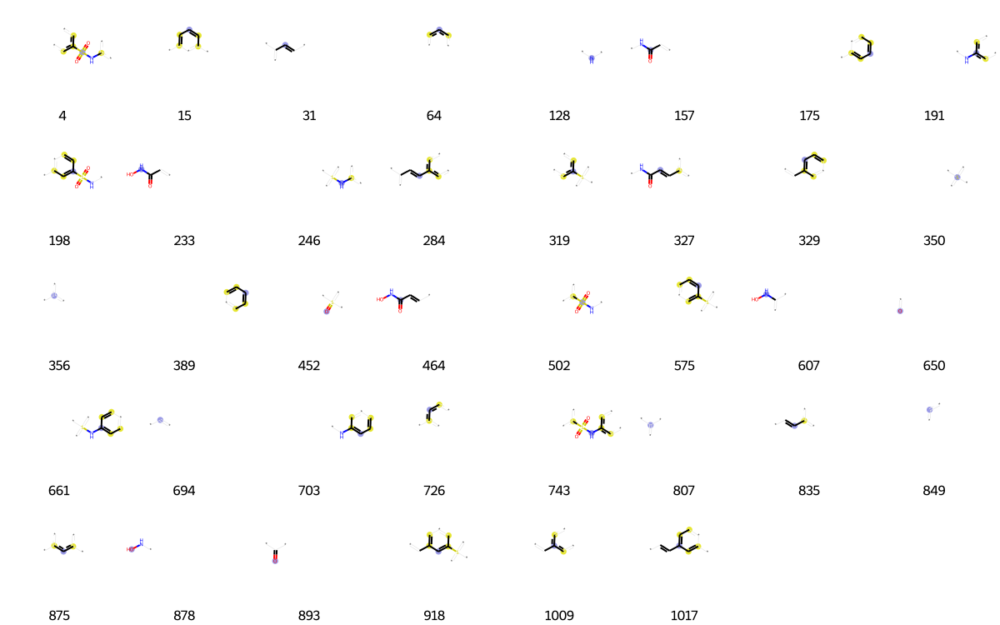

In [1670]:
prints = [(M41, x, bi) for x in fp41.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp41.GetOnBits ()])

In [1671]:
bi = {}

fp42= AllChem.GetMorganFingerprintAsBitVect(M42, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp42, fp_arr)
np.nonzero(fp_arr)
list(fp42.GetOnBits())

[23,
 25,
 31,
 33,
 64,
 94,
 128,
 140,
 157,
 175,
 200,
 221,
 249,
 284,
 327,
 356,
 389,
 419,
 423,
 456,
 512,
 650,
 672,
 694,
 695,
 726,
 745,
 792,
 804,
 807,
 835,
 841,
 849,
 875,
 882,
 893,
 946,
 967,
 1009,
 1015,
 1017]

[23,
 25,
 31,
 33,
 64,
 94,
 128,
 140,
 157,
 175,
 200,
 221,
 249,
 284,
 327,
 356,
 389,
 419,
 423,
 456,
 512,
 650,
 672,
 694,
 695,
 726,
 745,
 792,
 804,
 807,
 835,
 841,
 849,
 875,
 882,
 893,
 946,
 967,
 1009,
 1015,
 1017]

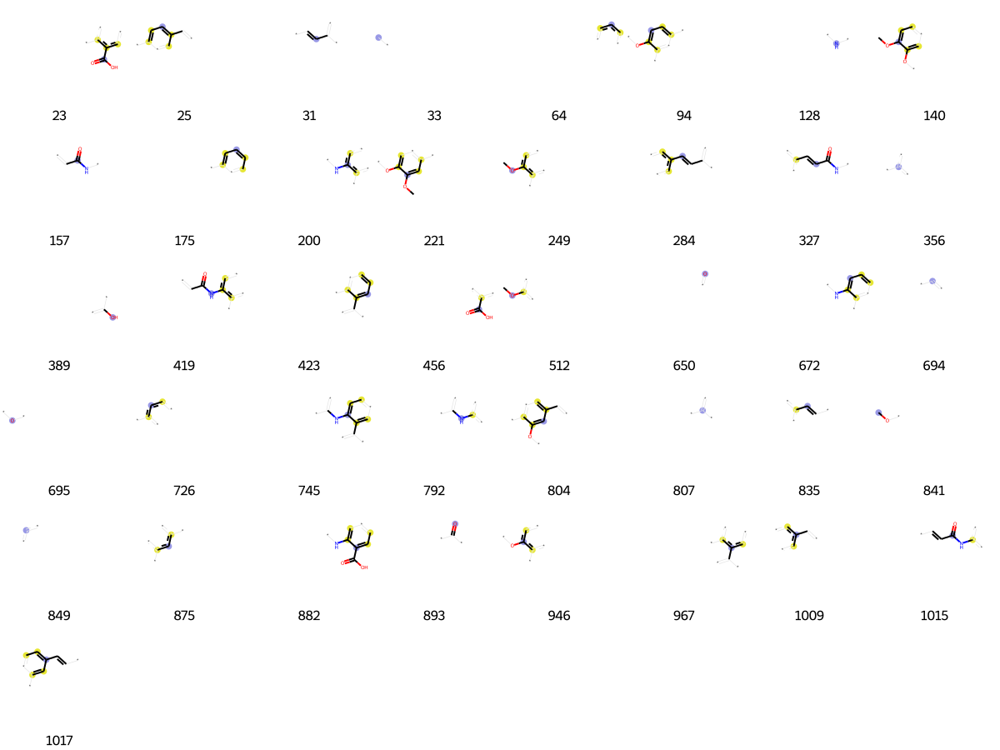

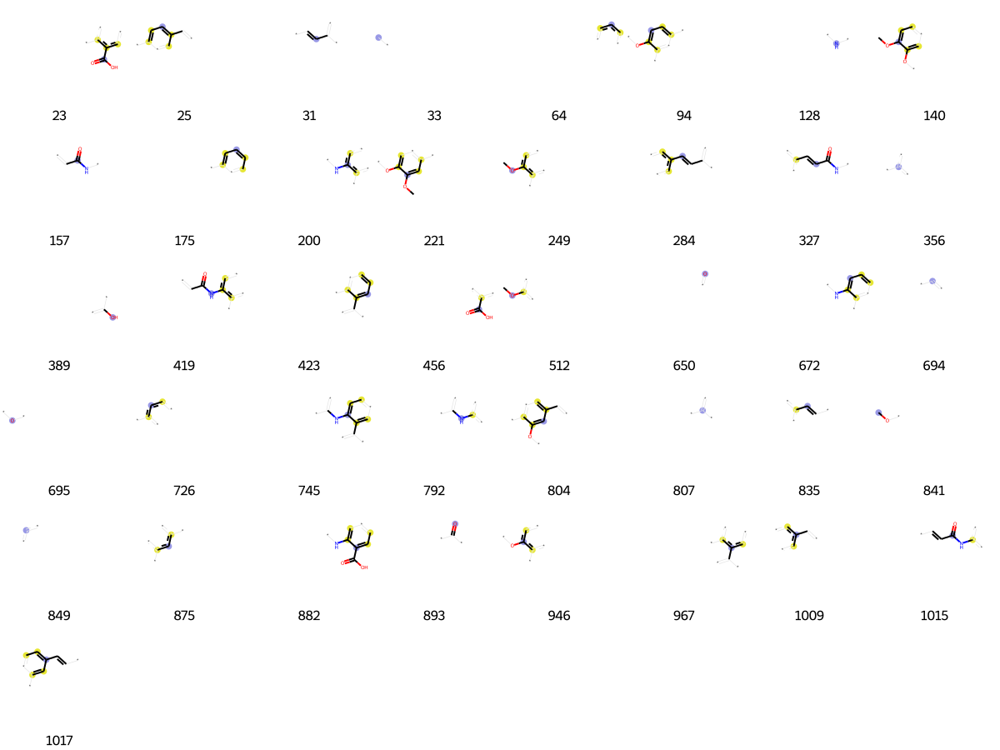

In [1672]:
prints = [(M42, x, bi) for x in fp42.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp42.GetOnBits ()])

In [1673]:
bi = {}

fp43= AllChem.GetMorganFingerprintAsBitVect(M43, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp43, fp_arr)
np.nonzero(fp_arr)
list(fp43.GetOnBits())

[8,
 46,
 80,
 121,
 128,
 197,
 216,
 265,
 350,
 356,
 361,
 381,
 417,
 456,
 458,
 486,
 523,
 561,
 641,
 650,
 653,
 656,
 659,
 667,
 673,
 726,
 767,
 807,
 816,
 825,
 849,
 852,
 887,
 893,
 926,
 935,
 950]

[8,
 46,
 80,
 121,
 128,
 197,
 216,
 265,
 350,
 356,
 361,
 381,
 417,
 456,
 458,
 486,
 523,
 561,
 641,
 650,
 653,
 656,
 659,
 667,
 673,
 726,
 767,
 807,
 816,
 825,
 849,
 852,
 887,
 893,
 926,
 935,
 950]

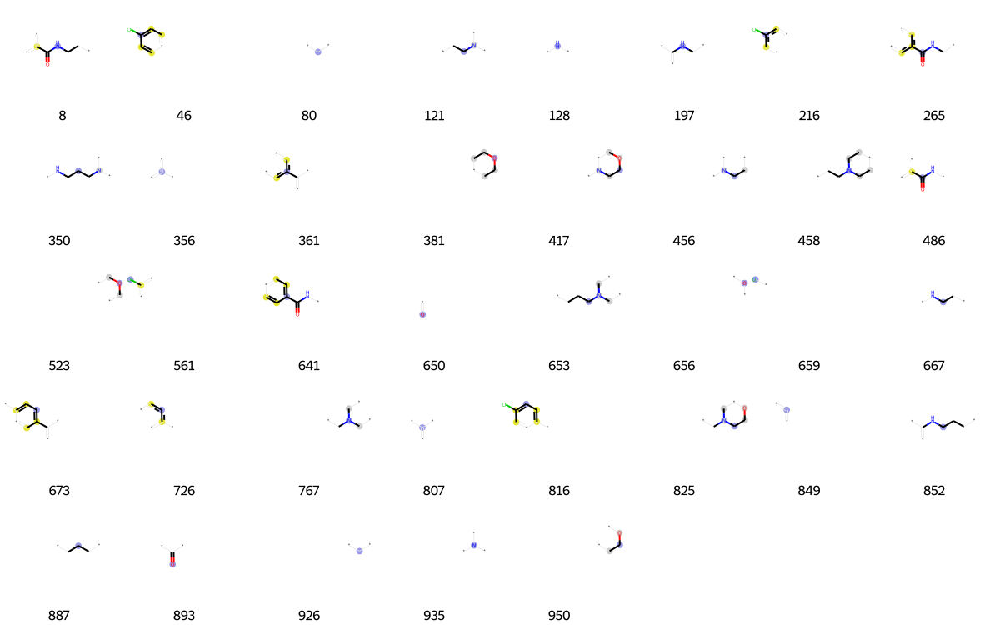

/usr/local/lib/python3.7/dist-packages/IPython/core/displayhook.py:260: UserWarning: Output cache limit (currently 1000 entries) hit.
Flushing oldest 200 entries.
  'Flushing oldest {cull_count} entries.'.format(sz=sz, cull_count=cull_count))


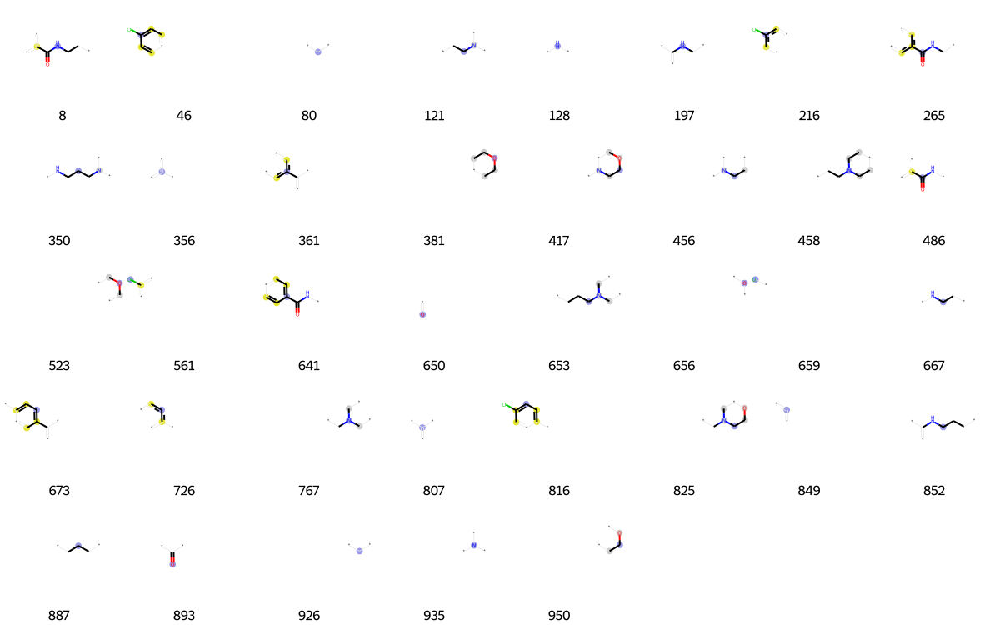

In [1674]:
prints = [(M43, x, bi) for x in fp43.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp43.GetOnBits ()])

In [1675]:
bi = {}

fp44= AllChem.GetMorganFingerprintAsBitVect(M44, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp44, fp_arr)
np.nonzero(fp_arr)
list(fp44.GetOnBits())

[1,
 15,
 29,
 33,
 64,
 90,
 106,
 114,
 121,
 136,
 175,
 222,
 237,
 257,
 283,
 300,
 333,
 337,
 352,
 356,
 361,
 371,
 378,
 389,
 456,
 549,
 581,
 598,
 650,
 673,
 684,
 700,
 721,
 723,
 726,
 736,
 807,
 831,
 849,
 875,
 892,
 893,
 896,
 897,
 900,
 960,
 980]

[1,
 15,
 29,
 33,
 64,
 90,
 106,
 114,
 121,
 136,
 175,
 222,
 237,
 257,
 283,
 300,
 333,
 337,
 352,
 356,
 361,
 371,
 378,
 389,
 456,
 549,
 581,
 598,
 650,
 673,
 684,
 700,
 721,
 723,
 726,
 736,
 807,
 831,
 849,
 875,
 892,
 893,
 896,
 897,
 900,
 960,
 980]

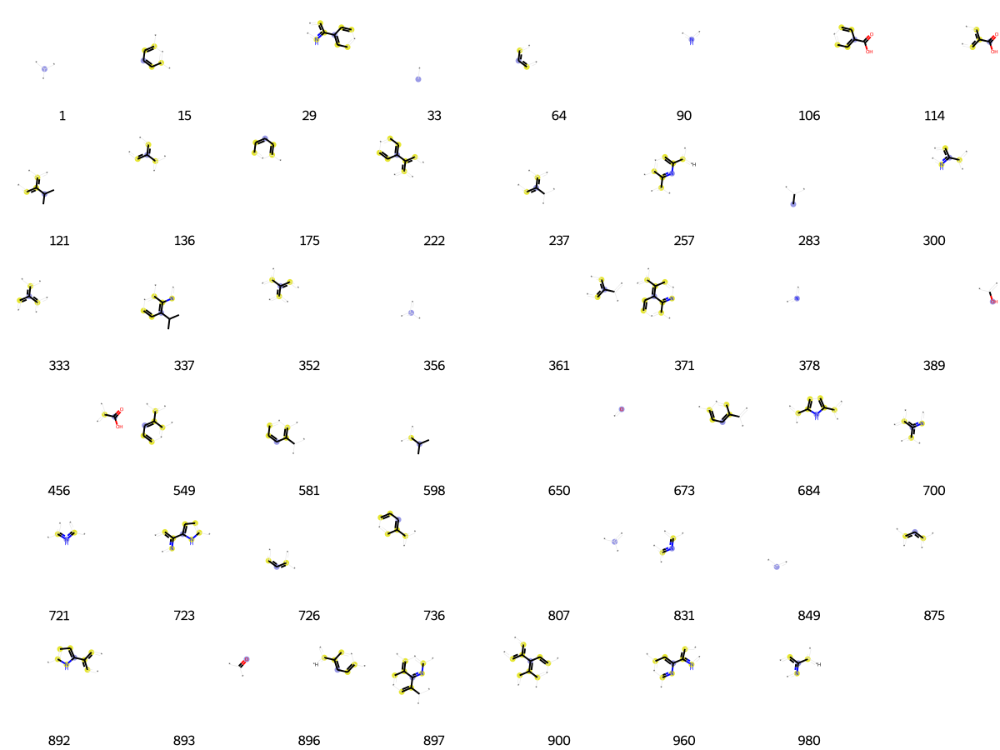

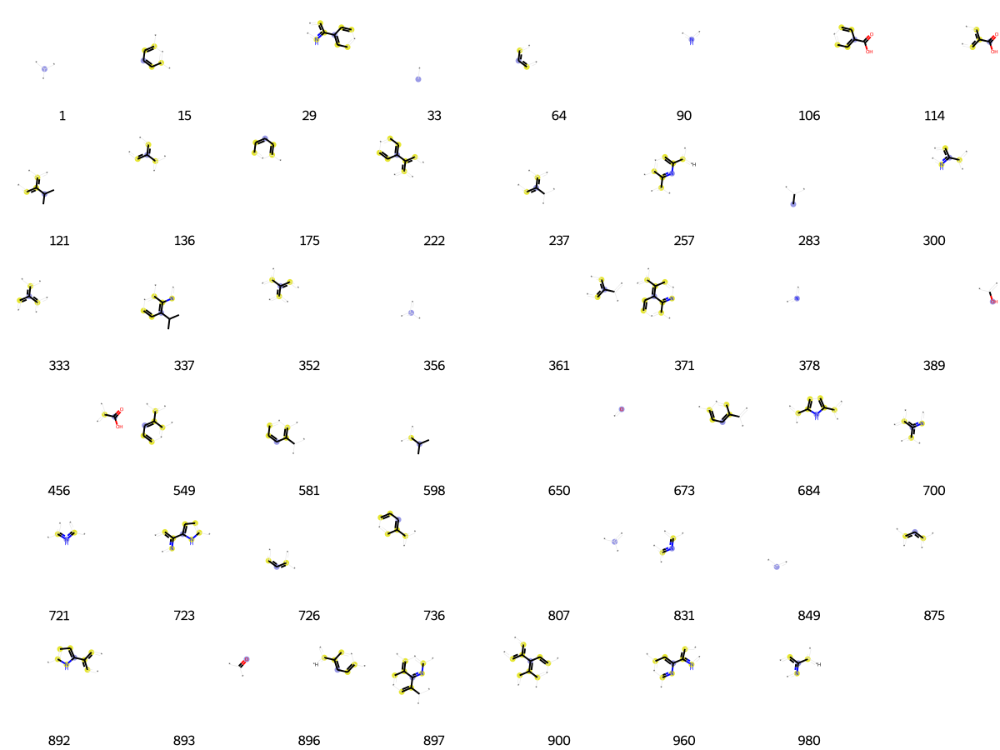

In [1676]:
prints = [(M44, x, bi) for x in fp44.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp44.GetOnBits ()])

In [1677]:
bi = {}

fp45= AllChem.GetMorganFingerprintAsBitVect(M45, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp45, fp_arr)
np.nonzero(fp_arr)
list(fp45.GetOnBits())

[15,
 29,
 36,
 64,
 74,
 80,
 90,
 119,
 130,
 138,
 150,
 175,
 212,
 214,
 231,
 248,
 264,
 270,
 275,
 301,
 311,
 333,
 356,
 361,
 389,
 451,
 456,
 470,
 474,
 549,
 556,
 578,
 583,
 632,
 647,
 649,
 656,
 682,
 721,
 726,
 736,
 737,
 750,
 759,
 784,
 791,
 807,
 849,
 889,
 908,
 926,
 935,
 940,
 948,
 956,
 978,
 998,
 1019,
 1021]

[15,
 29,
 36,
 64,
 74,
 80,
 90,
 119,
 130,
 138,
 150,
 175,
 212,
 214,
 231,
 248,
 264,
 270,
 275,
 301,
 311,
 333,
 356,
 361,
 389,
 451,
 456,
 470,
 474,
 549,
 556,
 578,
 583,
 632,
 647,
 649,
 656,
 682,
 721,
 726,
 736,
 737,
 750,
 759,
 784,
 791,
 807,
 849,
 889,
 908,
 926,
 935,
 940,
 948,
 956,
 978,
 998,
 1019,
 1021]

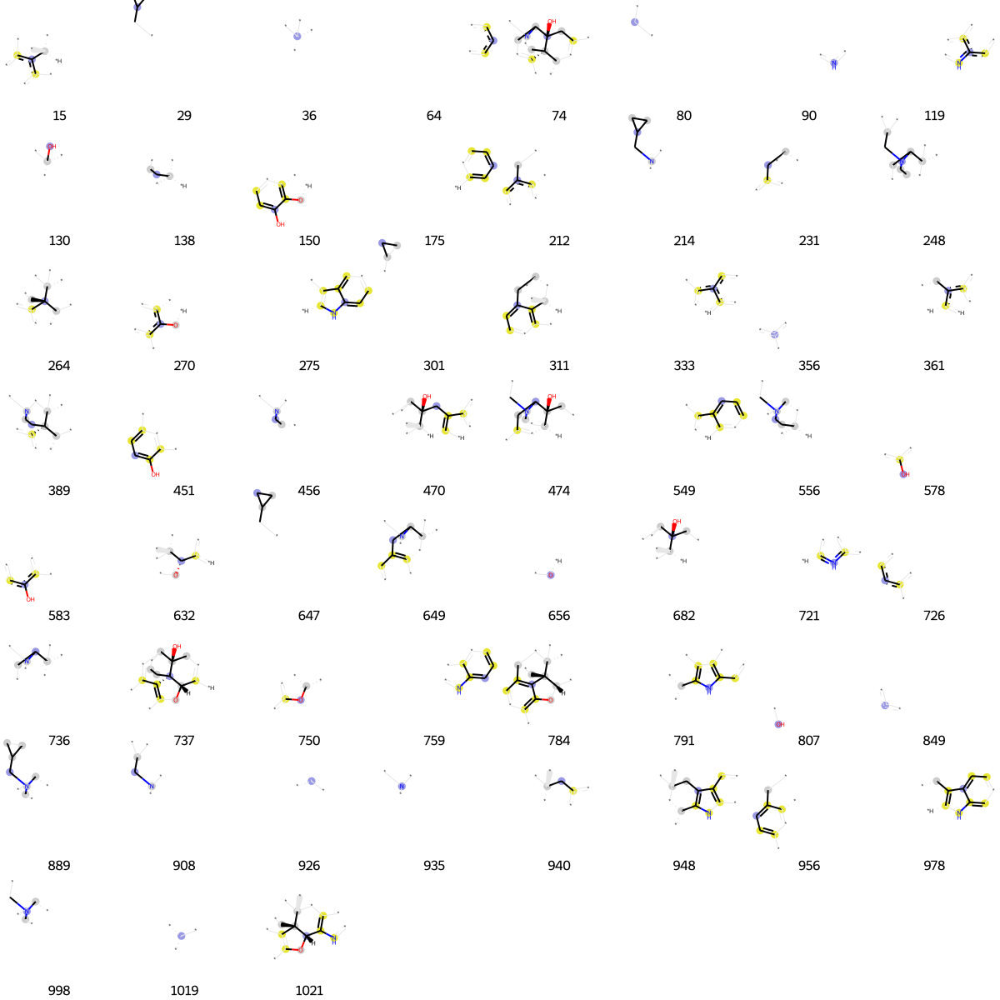

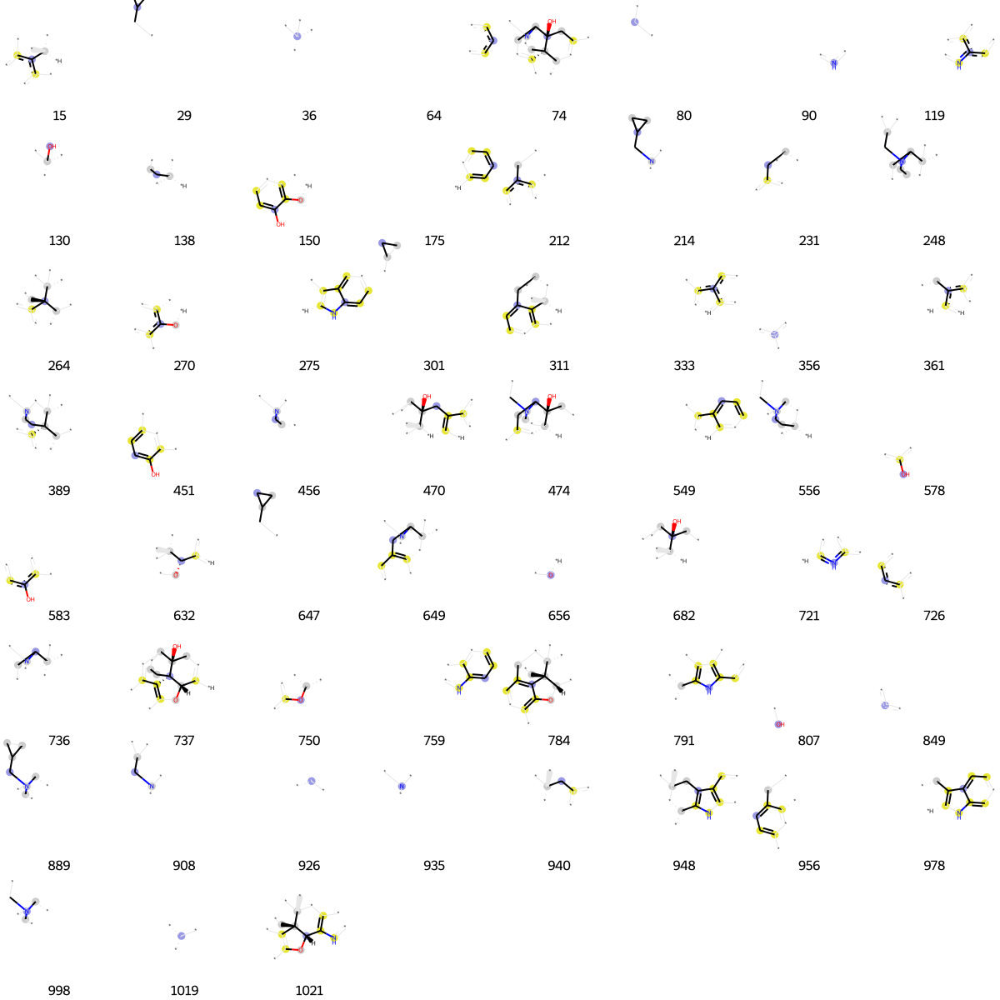

In [1678]:
prints = [(M45, x, bi) for x in fp45.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp45.GetOnBits ()])

In [1679]:
bi = {}

fp46= AllChem.GetMorganFingerprintAsBitVect(M46, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp46, fp_arr)
np.nonzero(fp_arr)
list(fp46.GetOnBits())

[4,
 5,
 65,
 80,
 90,
 128,
 140,
 146,
 147,
 288,
 301,
 305,
 314,
 318,
 356,
 362,
 387,
 398,
 456,
 483,
 521,
 650,
 661,
 688,
 689,
 701,
 712,
 735,
 742,
 760,
 807,
 874,
 888,
 893,
 926,
 935,
 955,
 976,
 1014,
 1019]

[4,
 5,
 65,
 80,
 90,
 128,
 140,
 146,
 147,
 288,
 301,
 305,
 314,
 318,
 356,
 362,
 387,
 398,
 456,
 483,
 521,
 650,
 661,
 688,
 689,
 701,
 712,
 735,
 742,
 760,
 807,
 874,
 888,
 893,
 926,
 935,
 955,
 976,
 1014,
 1019]

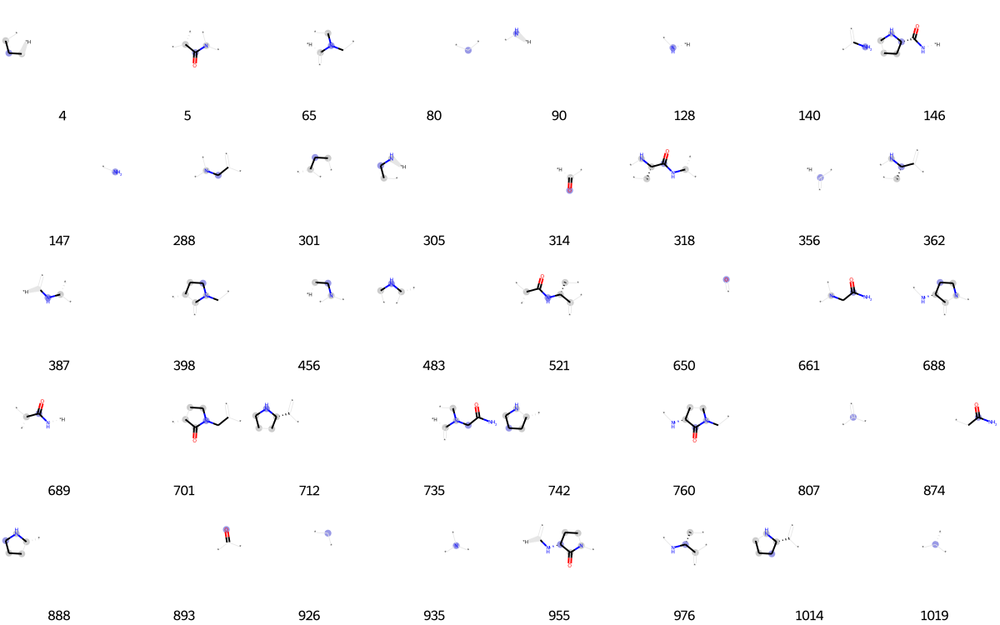

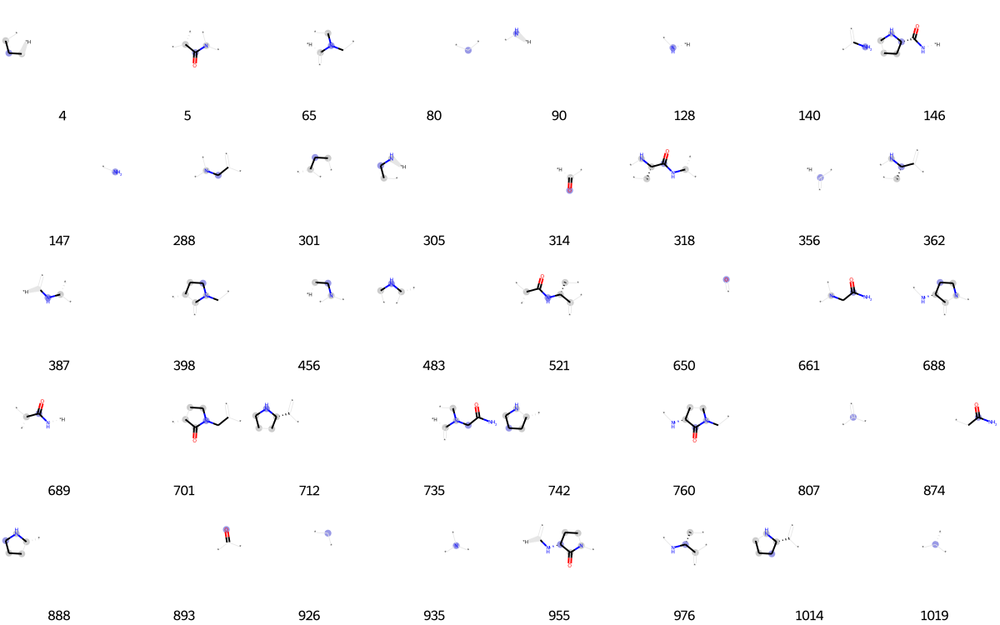

In [1680]:
prints = [(M46, x, bi) for x in fp46.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp46.GetOnBits ()])

In [1681]:
bi = {}

fp47= AllChem.GetMorganFingerprintAsBitVect(M47, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp47, fp_arr)
np.nonzero(fp_arr)
list(fp47.GetOnBits())

[32,
 33,
 36,
 84,
 130,
 138,
 217,
 250,
 268,
 289,
 301,
 314,
 356,
 412,
 455,
 460,
 468,
 483,
 484,
 494,
 516,
 519,
 529,
 555,
 560,
 561,
 580,
 645,
 650,
 653,
 659,
 666,
 707,
 738,
 790,
 807,
 844,
 849,
 871,
 872,
 893,
 918,
 926,
 933,
 987,
 991,
 1017,
 1019]

[32,
 33,
 36,
 84,
 130,
 138,
 217,
 250,
 268,
 289,
 301,
 314,
 356,
 412,
 455,
 460,
 468,
 483,
 484,
 494,
 516,
 519,
 529,
 555,
 560,
 561,
 580,
 645,
 650,
 653,
 659,
 666,
 707,
 738,
 790,
 807,
 844,
 849,
 871,
 872,
 893,
 918,
 926,
 933,
 987,
 991,
 1017,
 1019]

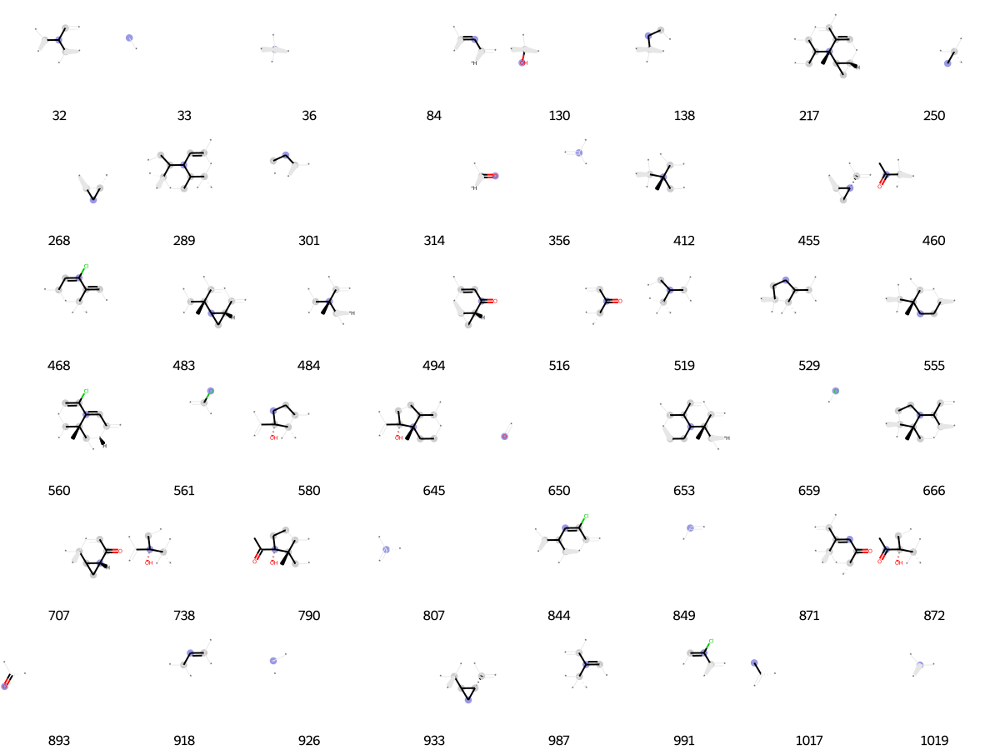

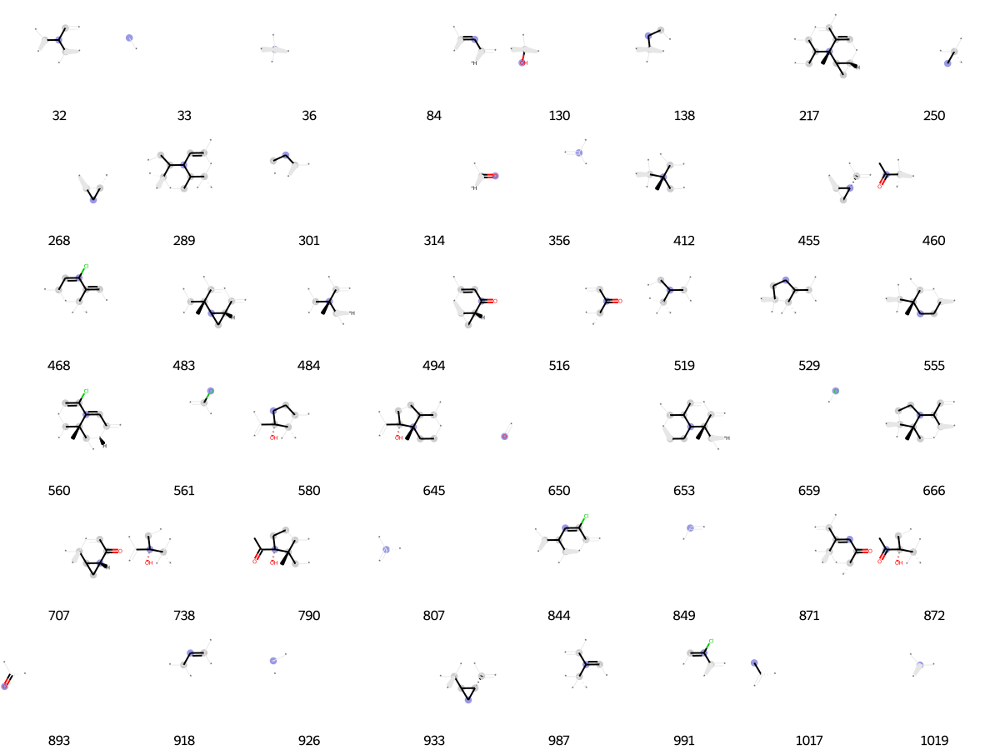

In [1682]:
prints = [(M47, x, bi) for x in fp47.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp47.GetOnBits ()])

In [1683]:
bi = {}

fp48= AllChem.GetMorganFingerprintAsBitVect(M48, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp48, fp_arr)
np.nonzero(fp_arr)
list(fp48.GetOnBits())

[33,
 46,
 114,
 183,
 216,
 317,
 322,
 334,
 356,
 389,
 392,
 548,
 561,
 650,
 659,
 695,
 718,
 726,
 770,
 805,
 807,
 816,
 849,
 893,
 953]

[33,
 46,
 114,
 183,
 216,
 317,
 322,
 334,
 356,
 389,
 392,
 548,
 561,
 650,
 659,
 695,
 718,
 726,
 770,
 805,
 807,
 816,
 849,
 893,
 953]

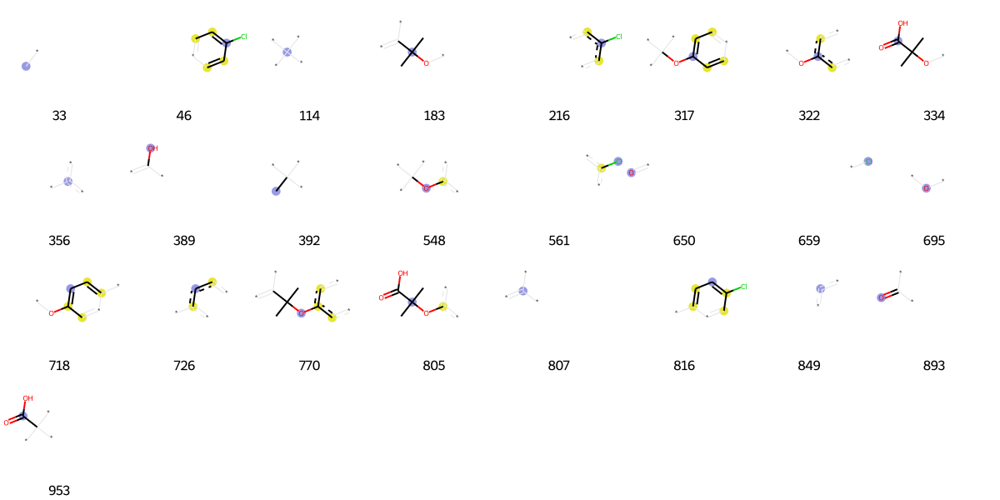

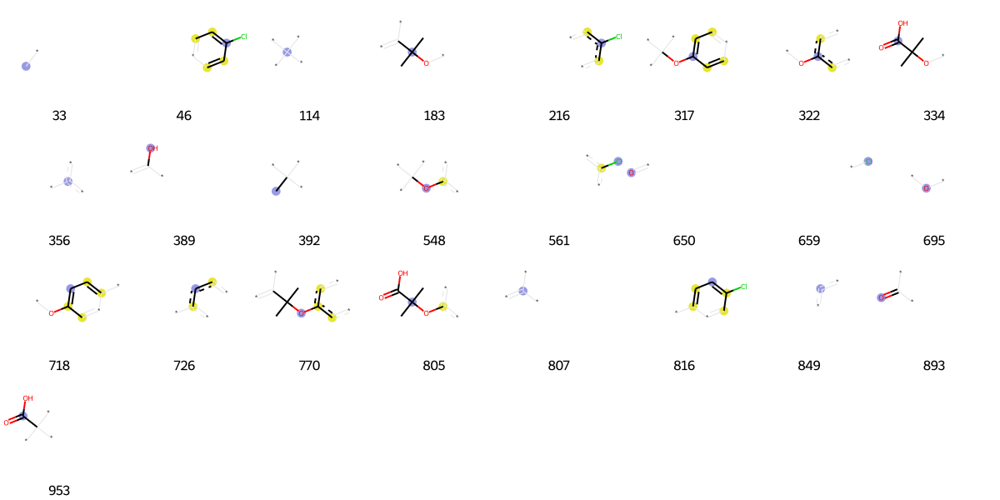

In [1684]:
prints = [(M48, x, bi) for x in fp48.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp48.GetOnBits ()])

In [1685]:
bi = {}

fp49= AllChem.GetMorganFingerprintAsBitVect(M49, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp49, fp_arr)
np.nonzero(fp_arr)
list(fp49.GetOnBits())

[33,
 80,
 161,
 193,
 228,
 235,
 288,
 307,
 314,
 322,
 330,
 346,
 352,
 356,
 389,
 588,
 593,
 597,
 642,
 650,
 680,
 695,
 698,
 713,
 718,
 726,
 799,
 807,
 849,
 875,
 879,
 893,
 896,
 935]

[33,
 80,
 161,
 193,
 228,
 235,
 288,
 307,
 314,
 322,
 330,
 346,
 352,
 356,
 389,
 588,
 593,
 597,
 642,
 650,
 680,
 695,
 698,
 713,
 718,
 726,
 799,
 807,
 849,
 875,
 879,
 893,
 896,
 935]

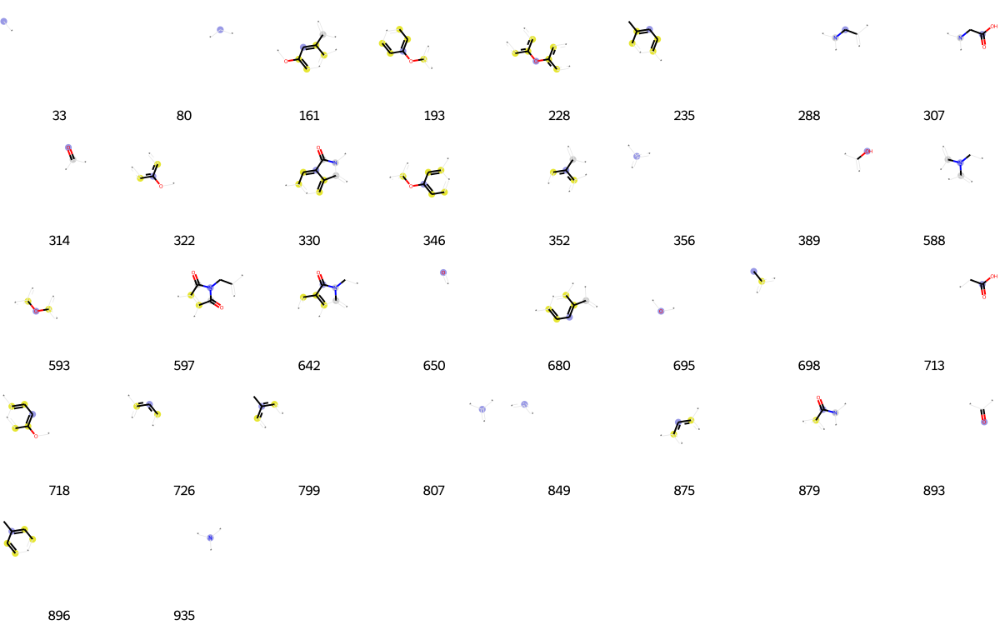

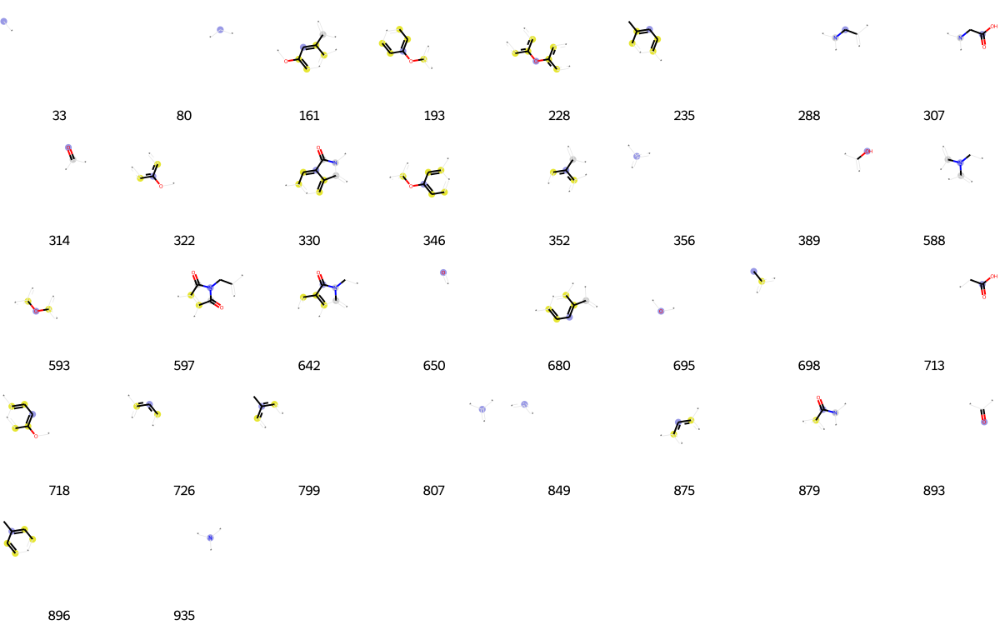

In [1686]:
prints = [(M49, x, bi) for x in fp49.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp49.GetOnBits ()])

In [1687]:
bi = {}

fp50= AllChem.GetMorganFingerprintAsBitVect(M50, 2, nBits= 1024, bitInfo=bi)
fp_arr = np.zeros((1,))
DataStructs.ConvertToNumpyArray(fp50, fp_arr)
np.nonzero(fp_arr)
list(fp50.GetOnBits())

[4,
 14,
 24,
 33,
 64,
 73,
 74,
 77,
 80,
 121,
 143,
 155,
 165,
 175,
 207,
 212,
 216,
 271,
 350,
 356,
 397,
 446,
 452,
 456,
 458,
 481,
 561,
 588,
 592,
 623,
 648,
 650,
 653,
 659,
 675,
 726,
 744,
 767,
 804,
 807,
 816,
 849,
 875,
 887,
 917,
 926,
 935,
 949,
 1020]

[4,
 14,
 24,
 33,
 64,
 73,
 74,
 77,
 80,
 121,
 143,
 155,
 165,
 175,
 207,
 212,
 216,
 271,
 350,
 356,
 397,
 446,
 452,
 456,
 458,
 481,
 561,
 588,
 592,
 623,
 648,
 650,
 653,
 659,
 675,
 726,
 744,
 767,
 804,
 807,
 816,
 849,
 875,
 887,
 917,
 926,
 935,
 949,
 1020]

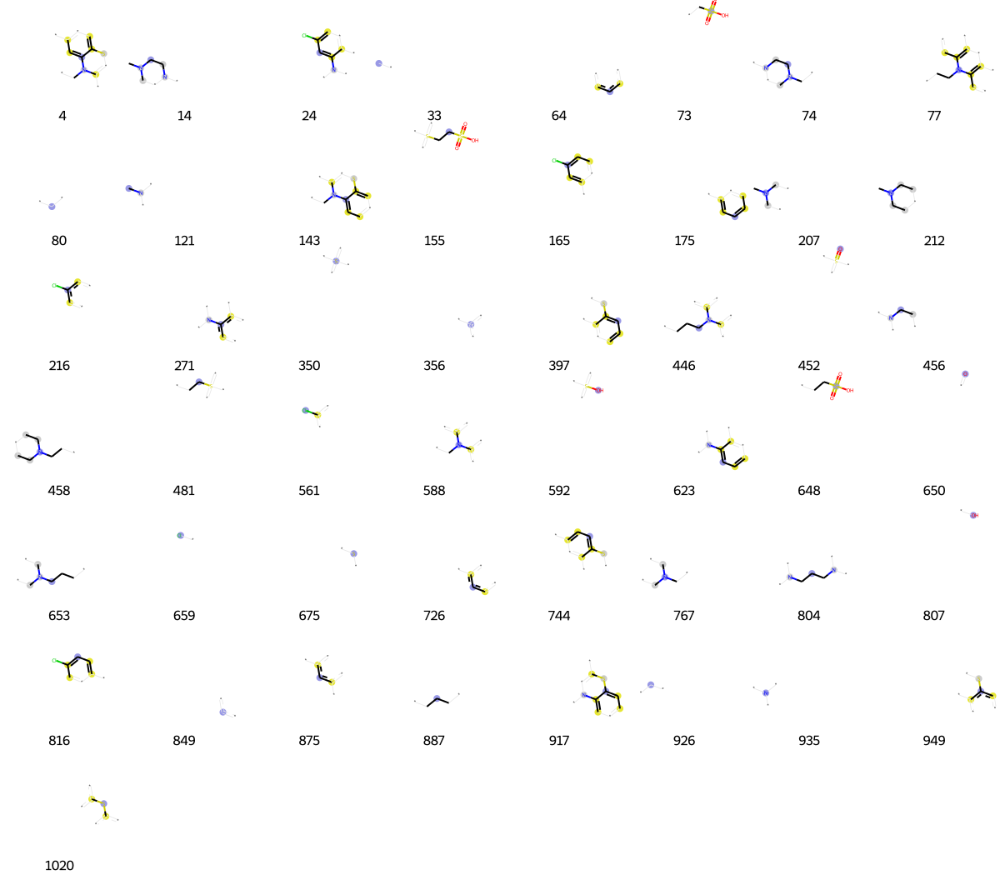

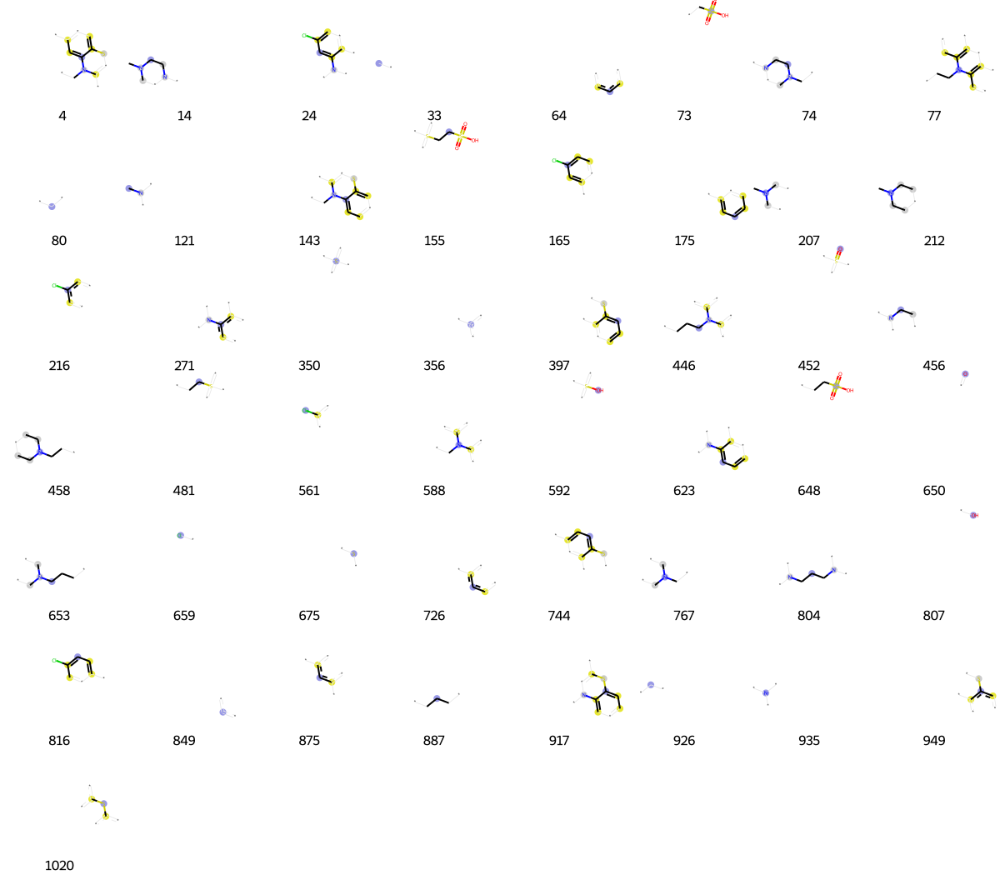

In [1688]:
prints = [(M50, x, bi) for x in fp50.GetOnBits()]
Draw.DrawMorganBits(prints, molsPerRow =8, legends=[str(x) for x in fp50.GetOnBits ()])